In [1]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows', 500)
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
train_identity = pd.read_csv('./ieee-fraud-detection/train_identity.csv')
train_transaction = pd.read_csv('./ieee-fraud-detection/train_transaction.csv')
#test_transaction = pd.read_csv('test_transaction.csv')
#test_identity = pd.read_csv('test_identity.csv')

In [3]:
# Gộp dataframe lại và export
# train = pd.merge(train_transaction, train_identity, on='TransactionID', how='left')
# del train_identity, train_transaction
# test = pd.merge(test_transaction, test_identity, on='TransactionID', how='left')
# del test_identity, test_transaction
# train.to_csv('train_merged.csv',index=False)

In [195]:
train = pd.read_csv('./ieee-fraud-detection/train_merged.csv')

In [196]:
train.shape

(543592, 434)

In [5]:
train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,NaN,NaN,yahoo.com,NaN,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,NaN,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M


In [6]:
#test.head()

In [7]:
column_data_types = train.dtypes

chunk_size = 20
num_columns = len(column_data_types)

for i in range(0, num_columns, chunk_size):
    chunk_end = min(i + chunk_size, num_columns)
    chunk = column_data_types.index[i:chunk_end]

    print(column_data_types[chunk])
    print('\n' + '-' * 80 + '\n')

TransactionID       int64
isFraud             int64
TransactionDT       int64
TransactionAmt    float64
ProductCD          object
card1               int64
card2             float64
card3             float64
card4              object
card5             float64
card6              object
addr1             float64
addr2             float64
dist1             float64
dist2             float64
P_emaildomain      object
R_emaildomain      object
C1                float64
C2                float64
C3                float64
dtype: object

--------------------------------------------------------------------------------

C4     float64
C5     float64
C6     float64
C7     float64
C8     float64
C9     float64
C10    float64
C11    float64
C12    float64
C13    float64
C14    float64
D1     float64
D2     float64
D3     float64
D4     float64
D5     float64
D6     float64
D7     float64
D8     float64
D9     float64
dtype: object

--------------------------------------------------------------------

In [8]:
train.describe()


,TransactionID,isFraud,TransactionDT,TransactionAmt,card1,card2,card3,card5,addr1,addr2,dist1,dist2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_13,id_14,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,5.435920e+05,543592.000000,5.435920e+05,543592.000000,543592.000000,535163.000000,542028.000000,539478.000000,482790.000000,482790.000000,217167.00000,35387.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,543592.000000,542364.000000,282138.000000,298181.000000,385944.000000,255520.000000,66787.000000,34771.000000,69156.000000,69156.000000,471042.000000,277464.000000,59814.000000,56084.000000,56782.000000,458910.000000,277464.000000,277464.000000,277464.000000,277464.000000,277464.000000,277464.000000,277464.000000,277464.000000,277464.000000,...,542364.000000,542364.000000,542364.000000,543580.000000,543580.000000,543580.000000,543580.000000,543580.000000,543580.000000,77288.000000,77288.000000,77288.000000,77288.000000,77288.00000,77288.000000,77288.000000,77288.000000,77288.000000,77288.000000,77288.000000,77288.000000,77288.000000,77288.000000,77288.000000,77288.000000,77288.000000,77288.000000,134397.000000,131280.000000,60947.000000,60947.000000,127708.000000,127708.000000,4809.000000,4809.000000,69156.000000,69156.000000,131393.000000,118082.000000,75218.000000,130101.000000,42032.000000,130060.000000,130015.000000,4812.000000,4822.000000,4432.000000,4792.000000,4816.000000,72928.00000
mean,3.258796e+06,0.034673,6.708763e+06,134.700982,9881.204378,362.406364,153.231344,199.436477,290.634595,86.788204,118.86958,233.900641,14.552876,15.817937,0.005269,4.318653,5.545508,9.307092,3.070886,5.480759,4.445156,5.587556,10.567015,4.385534,32.594554,8.439574,93.141591,169.073748,28.592583,138.165651,42.573681,66.780466,43.538351,147.880953,0.561545,121.629840,143.590055,53.723727,17.529527,54.657427,161.307527,0.999939,1.042961,1.075199,0.843198,0.873371,1.043559,1.069937,1.025780,1.038931,...,20.903746,41.737940,26.299405,34.326692,106.483555,57.044492,15.971214,29.364217,21.377500,1.194105,2.049594,1.586107,0.051353,0.51814,0.179989,0.211275,0.395016,0.318639,164.679508,223.464175,196.733952,9.258960,31.959891,16.956518,39.848557,56.454415,50.853823,-10.027411,173762.001881,0.062087,-0.059265,1.652810,-6.668282,13.427324,-38.448534,0.094757,-0.307898,99.738926,48.531097,-345.303917,189.149584,14.208936,351.793249,402.759374,369.625727,16.002489,12.752256,329.648581,148.749585,26.55452
std,1.569216e+05,0.182951,4.195926e+06,237.928089,4897.761372,157.920537,11.379665,41.031279,101.813709,2.761280,371.83659,535.811666,138.374142,160.338513,0.147851,71.078755,25.652796,73.643195,64.325906,99.261173,16.600530,99.483268,97.589240,90.310612,131.326341,50.817680,156.121393,175.860776,62.401104,188.562074,88.908538,141.747879,101.464073,232.788265,0.316963,180.106634,182.946711,123.198207,67.481751,133.806434,199.945808,0.007827,0.233114,0.314386,0.438672,0.473668,0.232802,0.296424,0.177569,0.216518,...,94.360219,169.460826,114.493854,560.778355,1426.447471,704.188605,296.941357,338.768633,315.574498,13.849646,18.663919,17.083881,0.286800,2.72689,0.898293,1.109754,2.778737,2.279044,1704.563466,2044.439046,1940.552434,251.225279,309.090074,260.356876,524.543466,586.122990,565.635398,14.183043,157306.385193,0.604312,0.700988,5.284567,16.458392,11.366300,25.919061,0.989132,2.817637,1.141343,11.406076,93.961741,30.319644,1.509261,140.176432,151.847386,199.505257,6.900874,2.252107,97.857067,32.268397,3.75621
min,2.987000e+06,0.000000,8.640000e+04,0.251000,1000.000000,100.000000,100.000000,100.000000,100.0

In [9]:
def detectmissing(df):
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing(%)'] = df.isnull().sum().values / df.shape[0]*100
    summary['Uniques'] = df.nunique().values

    return summary

def calculate_outliers(df_num):
    data_mean, data_std = np.mean(df_num), np.std(df_num)
    cut = data_std * 3
    lower, upper = data_mean - cut, data_mean + cut

    outliers_lower = [x for x in df_num if x < lower]
    outliers_higher = [x for x in df_num if x > upper]
    outliers_total = [x for x in df_num if x < lower or x > upper]
    outliers_removed = [x for x in df_num if x > lower and x < upper]

    outlier_stats = {
        'Number of values below lower bound': len(outliers_lower),
        'Number of values above upper bound': len(outliers_higher),
        'Total number of outlier values': len(outliers_total),
        'Total number of non-outlier values': len(outliers_removed),
        'Percentage of Outliers': round((len(outliers_total) / len(outliers_removed)) * 100, 4)
    }

    print("Outlier Statistics:")
    for stat_name, stat_value in outlier_stats.items():
        print(f'{stat_name}: {stat_value}')

In [10]:
train_missing = detectmissing(train)
train_missing

,Name,dtypes,Missing(%),Uniques
0,TransactionID,int64,0.000000,543592
1,isFraud,int64,0.000000,2
2,TransactionDT,int64,0.000000,527452
3,TransactionAmt,float64,0.000000,19874
4,ProductCD,object,0.000000,5
5,card1,int64,0.000000,13216
6,card2,float64,1.550611,500
7,card3,float64,0.287716,114
8,card4,object,0.289923,4
9,card5,float64,0.756818,118


In [11]:
print("Missing value in the train set:")
for i in [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 99]:
    print("%0.2f percent of features have more than " % ((len(train_missing[train_missing['Missing(%)'] >i])/ train.shape[1])*100) + str(i) + "% of missing value")

Missing value in the train set:
95.39 percent of features have more than 0% of missing value
74.19 percent of features have more than 10% of missing value
58.06 percent of features have more than 20% of missing value
53.46 percent of features have more than 30% of missing value
53.46 percent of features have more than 40% of missing value
49.31 percent of features have more than 50% of missing value
48.85 percent of features have more than 60% of missing value
47.93 percent of features have more than 70% of missing value
17.05 percent of features have more than 80% of missing value
2.76 percent of features have more than 90% of missing value
2.07 percent of features have more than 99% of missing value


In [12]:
col_70missing = train_missing[train_missing['Missing(%)'] >70]['Name'].to_list()
print('The number of features with more than 70% missing value in Train is: ')
len(col_70missing)

The number of features with more than 70% missing value in Train is: 


208

In [13]:
one_unique_col = [i for i in train.columns if train[i].nunique() == 1]
#one_unique_col_test = [i for i in test.columns if test[i].nunique() == 1]
print("There are %d features in train set with only one unique value" % len(one_unique_col))
#print("There are %d features in test set with only one unique value" % len(one_unique_col_test))
#print("The feature is %s" % one_unique_col_test[0])

There are 0 features in train set with only one unique value


## Frauds Target Distribution

In [14]:
train['isFraud'].value_counts()

isFraud
0    524744
1     18848
Name: count, dtype: int64

Text(0, 0.5, 'Percentage')

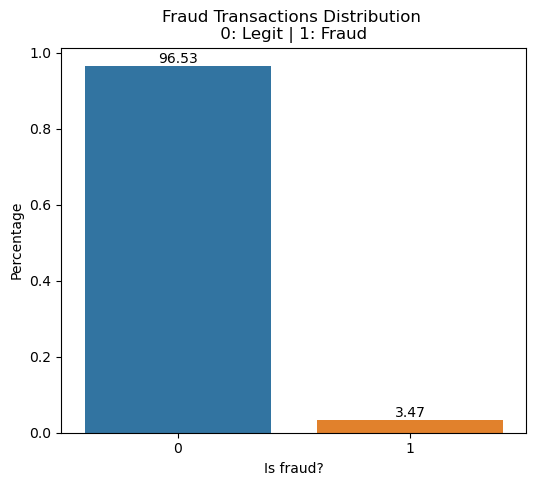

In [15]:
plt.figure(figsize=(6, 5))
yaxis = train['isFraud'].value_counts().values / train.shape[0]
barplot = sns.barplot(x=[0,1], y=yaxis)
for p in barplot.patches:
    barplot.annotate(format(p.get_height()*100, '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')
plt.title("Fraud Transactions Distribution \n 0: Legit | 1: Fraud ")
plt.xlabel('Is fraud?')
plt.ylabel('Percentage')

* Có sự mất cân bằng lớn giữa hai nhãn mục tiêu

## TransactionAmt

In [16]:
train["TransactionAmt"].isnull().sum()

0

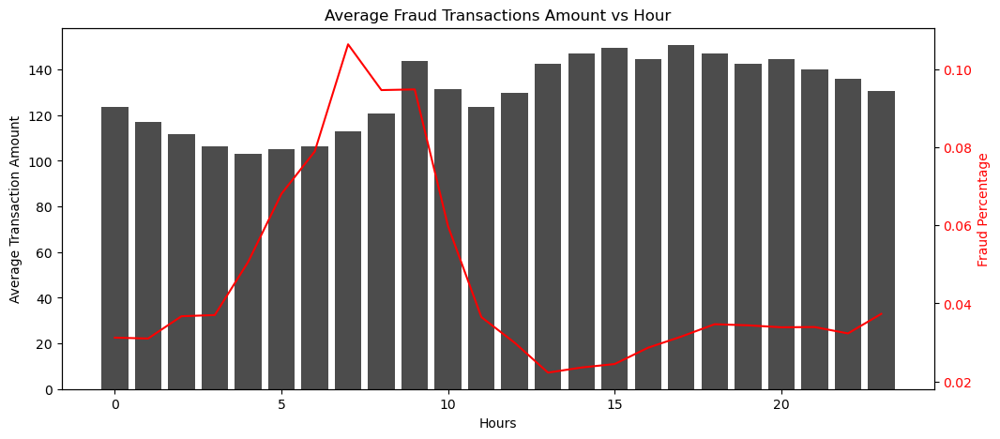

In [17]:
train['hour'] = (train['TransactionDT'] // (60 * 60)) % 24

tmp_fraud_pct = train.groupby('hour')['isFraud'].mean().reset_index()
tmp_fraud_pct.rename(columns={'isFraud': 'Fraud Percentage'}, inplace=True)

tmp_avg_trans_amt = train.groupby('hour')['TransactionAmt'].mean().reset_index()
tmp_avg_trans_amt.rename(columns={'TransactionAmt': 'Average Transaction Amount'}, inplace=True)

tmp = pd.merge(tmp_fraud_pct, tmp_avg_trans_amt, on='hour')

fig, axes = plt.subplots(figsize=(12, 5))
plt.xlabel('Hours')

axes2 = plt.bar(tmp['hour'], tmp['Average Transaction Amount'], color='black', alpha=0.7)
plt.ylabel('Average Transaction Amount', color='black')
plt.tick_params(axis='y', labelcolor='black')

axes = plt.twinx()
axes.plot(tmp['hour'], tmp['Fraud Percentage'], color='r')
axes.set_ylabel('Fraud Percentage', color='r')
axes.tick_params(axis='y', labelcolor='r')

plt.title('Average Fraud Transactions Amount vs Hour')
plt.show()

Hiển thị xu hướng về số tiền giao dịch gian lận trung bình theo thời gian. Chúng ta có thể thấy rằng những giao dịch gian lận thường là những giao dịch với số tiền từ 100 đến 120 đô la Mỹ.

Biểu đồ mô tả mô hình các giao dịch gian lận đạt đỉnh cao vào khung đầu giờ sáng (khoảng 5 giờ sáng đến 9 giờ sáng) và sau đó giảm dần vào khung cuối giờ sáng (bắt đầu từ 10 giờ sáng trở đi). Từ mô hình này chúng ta có thể hiểu rằng các vụ trộm cắp tín dụng thường tập trung vào các khung thời gian có khối lượng giao dịch thấp hơn và mức độ cảnh giác thấp hơn, tận dụng những thời điểm có ít người tham gia hoặc giám sát giao dịch của họ hơn.

### Distribution

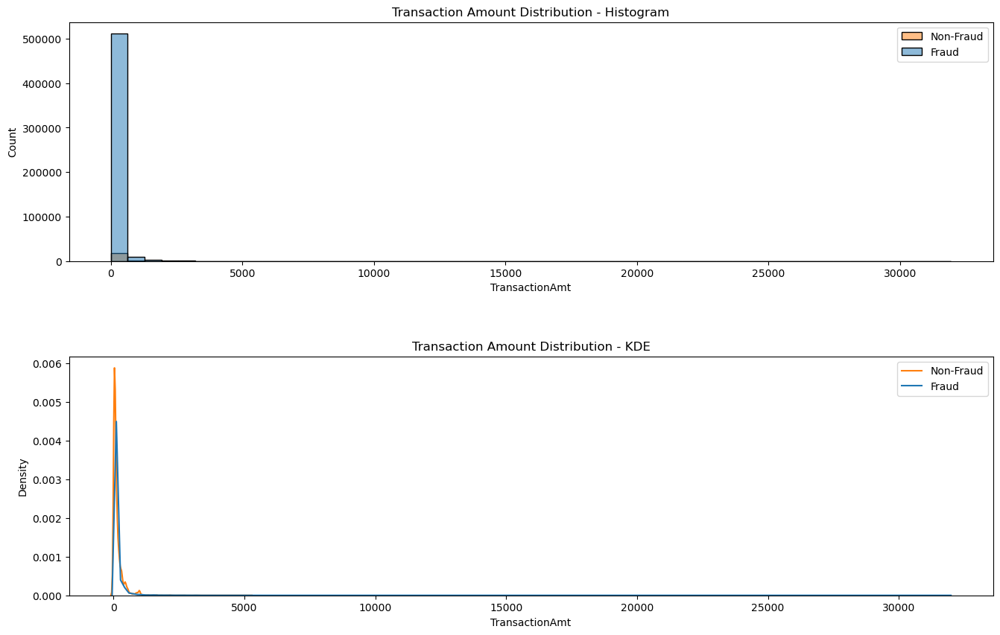

In [18]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(16, 10))

sns.histplot(data=train, x='TransactionAmt', hue='isFraud', common_norm=False, bins=50, ax=axs[0])
sns.kdeplot(data=train, x='TransactionAmt', hue='isFraud', common_norm=False, ax=axs[1])

plt.subplots_adjust(hspace=0.4)

axs[0].set_title('Transaction Amount Distribution - Histogram')
axs[1].set_title('Transaction Amount Distribution - KDE')

for ax in axs:
    ax.legend(labels=['Non-Fraud', 'Fraud'])

plt.show()


Vì có những giá trị vô cùng lớn trong TransactionAmt, chúng ta sẽ áp dụng phép biến đổi logarit để nâng cao khả năng trực quan hóa của dữ liệu

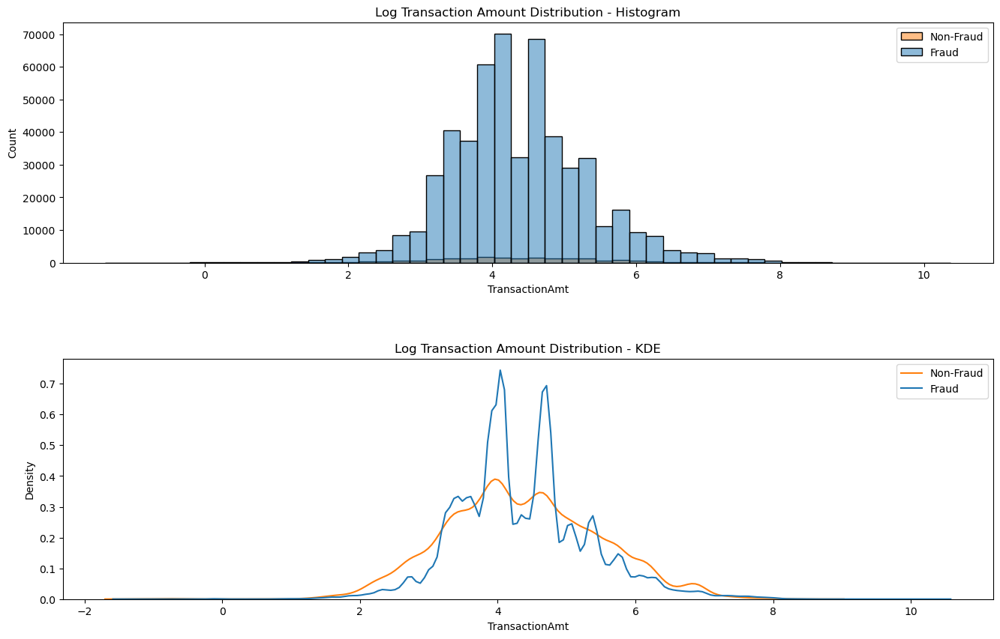

In [19]:
log_amt = np.log(train['TransactionAmt'])

fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(16, 10))

sns.histplot(data=train, x=log_amt, hue='isFraud', common_norm=False, bins=50, ax=axs[0])
sns.kdeplot(data=train, x=log_amt, hue='isFraud', common_norm=False, ax=axs[1])

plt.subplots_adjust(hspace=0.4)

axs[0].set_title('Log Transaction Amount Distribution - Histogram')
axs[1].set_title('Log Transaction Amount Distribution - KDE')

for ax in axs:
    ax.legend(labels=['Non-Fraud', 'Fraud'])

plt.show()

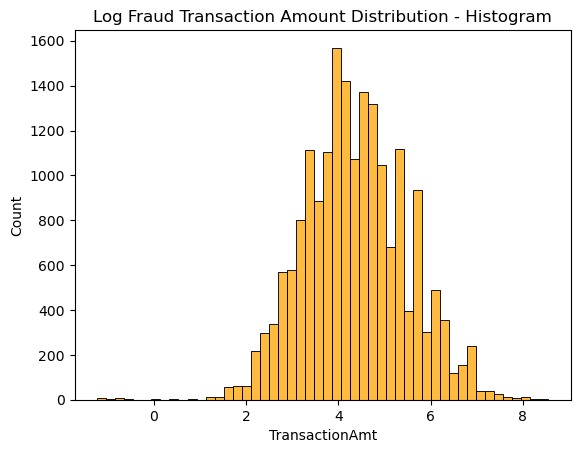

In [20]:
fraud_amt = np.log(train[train['isFraud'] == 1]['TransactionAmt'])

sns.histplot(data=fraud_amt, common_norm=False, bins=50, color='orange')  # Plot only for isFraud == 1
plt.title('Log Fraud Transaction Amount Distribution - Histogram')
plt.show()

Trong các giao dịch gian lận, có một sự cải thiện đáng kể trong hình dạng của phân phối, thể hiện bởi một đường cong chuông rộng hơn. Mẫu này cho thấy sự tập trung cao hơn của các giao dịch trong các khoảng thời gian cụ thể, cho thấy các hoạt động gian lận tiềm ẩn.

Hơn nữa, các giao dịch có giá trị trong log_amt lớn hơn 5.5 (tương đương 244 đô la) và nhỏ hơn 3.3 (tương đương 27 đô la) thường có tần suất và mật độ xác suất gia tăng liên quan đến gian lận. Ngược lại, các giao dịch nằm trong khoảng từ 3.3 đến 5.5 của log_amt có khả năng là giao dịch hợp pháp cao hơn.

In [21]:
fraud_mean_amt = log_amt[train['isFraud'] == 1].mean()
non_fraud_mean_amt = log_amt[train['isFraud'] == 0].mean()
fraud_median_amt = log_amt[train['isFraud'] == 1].median()
non_fraud_median_amt = log_amt[train['isFraud'] == 0].median()

print(f'Mean fraud transaction amount: {fraud_mean_amt} ({np.exp(fraud_mean_amt)} USD)')
print(f'Median fraud transaction amount: {fraud_median_amt} ({np.exp(fraud_median_amt)} USD)')
print(f'Mean non-fraud transaction amount: {non_fraud_mean_amt} ({np.exp(non_fraud_mean_amt)} USD)')
print(f'Median non-fraud transaction amount: {non_fraud_median_amt} ({np.exp(non_fraud_median_amt)} USD)')

Mean fraud transaction amount: 4.357795773913444 (78.08482797687576 USD)
Median fraud transaction amount: 4.31748811353631 (74.99999999999997 USD)
Mean non-fraud transaction amount: 4.364256583540277 (78.59095241143272 USD)
Median non-fraud transaction amount: 4.22683374526818 (68.5 USD)


Có vẻ như trung vị của số lượng giao dịch gian lận cao hơn một chút so với giao dịch không gian lận.

### Check for outliers

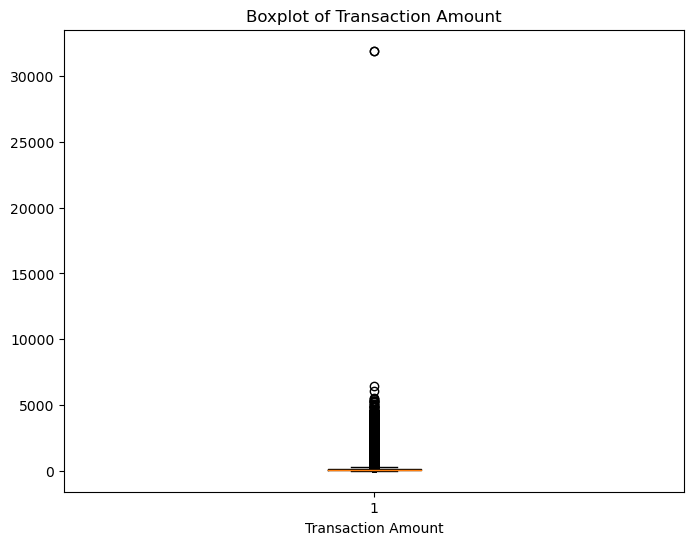

In [22]:
plt.figure(figsize=(8, 6))
plt.boxplot(train['TransactionAmt'])
plt.title('Boxplot of Transaction Amount')
plt.xlabel('Transaction Amount')
plt.show()

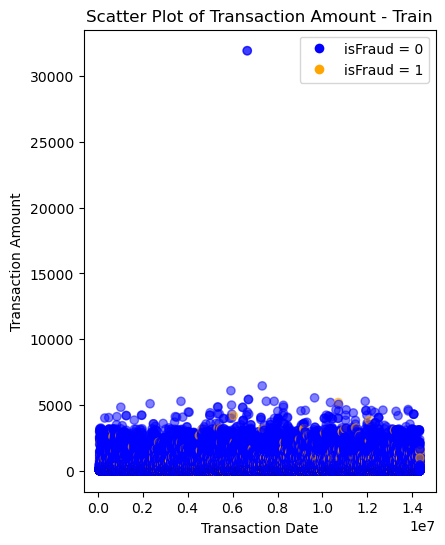

In [23]:
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.scatter(train['TransactionDT'], train['TransactionAmt'], c=np.where(train['isFraud'] == 1, 'orange', 'blue'), label='Train', alpha=0.5)
plt.xlabel('Transaction Date')
plt.ylabel('Transaction Amount')
plt.title('Scatter Plot of Transaction Amount - Train')
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=8, label='isFraud = 0'),
                    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=8, label='isFraud = 1')])



Chúng ta có thể thấy một (hoặc nhiều) (các) ngoại lai cực đoan được tách biệt khỏi phần còn lại của dữ liệu

In [24]:
print('Train df: \n', train['TransactionAmt'].describe())

Train df: 
 count    543592.000000
mean        134.700982
std         237.928089
min           0.251000
25%          43.375000
50%          68.950000
75%         125.000000
max       31937.391000
Name: TransactionAmt, dtype: float64


In [25]:
calculate_outliers(train['TransactionAmt'])

Outlier Statistics:
Number of values below lower bound: 0
Number of values above upper bound: 9156
Total number of outlier values: 9156
Total number of non-outlier values: 534436
Percentage of Outliers: 1.7132


In [26]:
train[train.TransactionAmt >= 10000]

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,...,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,hour
274336,3261336,0,6652360,31937.391,W,16075,514.0,150.0,mastercard,102.0,credit,205.0,87.0,27.0,NaN,yahoo.com,NaN,1.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,T,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23
274339,3261339,0,6652391,31937.391,W,16075,514.0,150.0,mastercard,102.0,credit,205.0,87.0,27.0,NaN,yahoo.com,NaN,1.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,T,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23


Các giá trị trên 10000 dường như bị trùng lặp

Những giá trị ngoại lai vượt quá 10,000 trong dữ liệu huấn luyện có thể làm giảm độ chính xác của mô hình, đặc biệt là trong các thuật toán dựa trên khoảng cách như hồi quy logistic và KNN. Những rủi ro về việc overfitting xuất phát từ những giá trị ngoại lai này có thể mang vào mô hình những nhiễu không liên quan. Hơn nữa, các mô hình tree-based có thể đặt những ngoại lai như vậy vào các nodes lá cô lập, có thể gây ảnh hưởng đến khả năng tổng quát hóa của mô hình. Do đó, tôi đã chọn loại bỏ những giá trị vượt quá 10,000 khỏi tập huấn luyện, tăng cường tính ổn định và hiệu suất của mô hình trên nhiều thuật toán khác nhau.

Tôi chưa loại bỏ hoàn toàn tất cả các giá trị ngoại lai mà chỉ loại bỏ các giá trị cực đoan nhất. Biện pháp phòng ngừa này là do có khả năng mất thông tin quan trọng trong trường hợp các giá trị ngoại lai này hợp lệ và có ý nghĩa quan trọng trong việc phát hiện gian lận trong giao dịch.

In [27]:
train = train[train['TransactionAmt'] < 10000]
train.shape

(543590, 435)

## Dist1, Dist2

Chúng ta có thể phỏng đoán rằng 2 cột này có thể cho biết khoảng cách giữa địa điểm giao dịch và địa chỉ chủ thẻ.

In [28]:
missing_data_percentage_dist1 = (train["dist1"].isnull().sum() / len(train)) * 100
missing_data_percentage_dist2 = (train["dist2"].isnull().sum() / len(train)) * 100

print(f"Percentage of missing values in dist1 column: {missing_data_percentage_dist1:.2f}%")
print(f"Percentage of missing values in dist2 column: {missing_data_percentage_dist2:.2f}%")

Percentage of missing values in dist1 column: 60.05%
Percentage of missing values in dist2 column: 93.49%


In [29]:
unique_dist1_values = train['dist1'].nunique()
unique_dist2_values = train['dist2'].nunique()

print("Unique values in dist1:", unique_dist1_values)
print("Unique values in dist2:", unique_dist2_values)

Unique values in dist1: 2622
Unique values in dist2: 1721


Khoảng 93% data bị thiếu/null - rất lớn

In [30]:

dist1_desc = train['dist1'].describe()
dist2_desc = train['dist2'].describe()
dist1_fraud_desc = train[train['isFraud'] == 1]['dist1'].describe()
dist1_non_fraud_desc = train[train['isFraud'] == 0]['dist1'].describe()
dist2_fraud_desc = train[train['isFraud'] == 1]['dist2'].describe()
dist2_non_fraud_desc = train[train['isFraud'] == 0]['dist2'].describe()

summary_table = pd.DataFrame({
    "dist1": dist1_desc,
    "dist1 for Fraud Transactions": dist1_fraud_desc,
    "dist1 for Non-Fraud Transactions": dist1_non_fraud_desc,
    "dist2": dist2_desc,
    "dist2 for Fraud Transactions": dist2_fraud_desc,
    "dist2 for Non-Fraud Transactions": dist2_non_fraud_desc
})

summary_table

,dist1,dist1 for Fraud Transactions,dist1 for Non-Fraud Transactions,dist2,dist2 for Fraud Transactions,dist2 for Non-Fraud Transactions
count,217165.000000,4316.000000,212849.000000,35387.000000,3372.000000,32015.000000
mean,118.870426,175.280584,117.726581,233.900641,207.670225,236.663377
std,371.838198,424.987423,370.593983,535.811666,468.406997,542.356436
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,3.000000,3.000000,7.000000,7.000000,7.000000
50%,8.000000,11.000000,8.000000,36.000000,49.000000,36.000000
75%,24.000000,80.000000,24.000000,213.000000,249.000000,207.000000
max,10286.000000,4942.000000,10286.000000,11623.000000,9337.000000,11623.000000


Trong trường hợp của cột dist1, giá trị trung bình khoảng cách cho các giao dịch gian lận vượt xa so với các giao dịch không gian lận. Sự chênh lệch này có thể được quy cho xu hướng của những vụ trộm thông tin thẻ tín dụng thực hiện các hoạt động bất hợp pháp từ những vị trí có khoảng cách đáng kể từ địa chỉ của chủ sở hữu thẻ.

In [31]:
print('Mean dist1 của giao dịch gian trá lớn hơn với giao dịch hợp pháp khoảng', 174.588854/117.360872, 'lần')

Mean dist1 của giao dịch gian trá lớn hơn với giao dịch hợp pháp khoảng 1.4876240353769696 lần


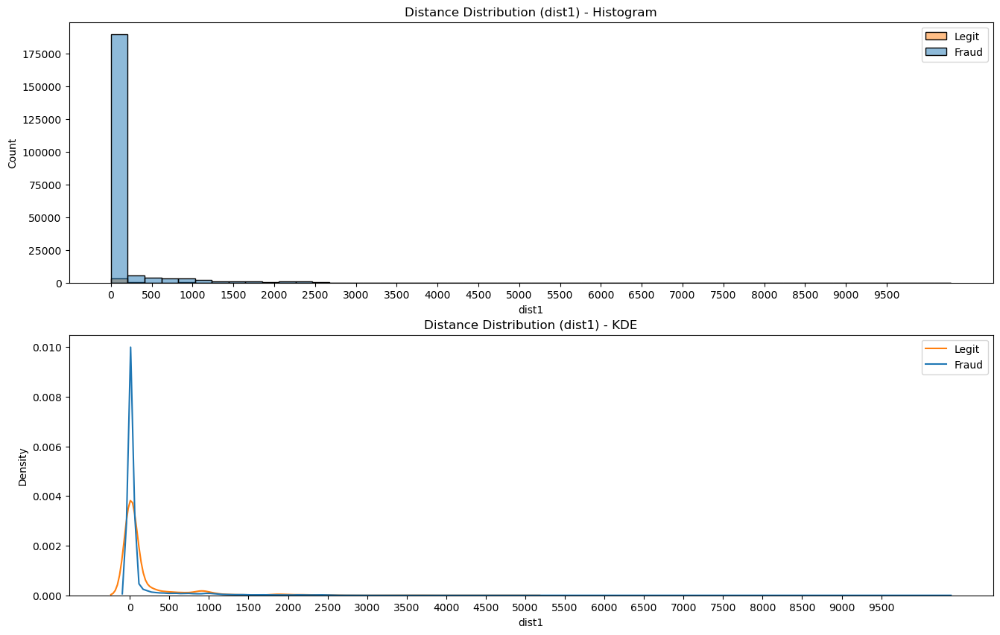

In [32]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(16, 10))

sns.histplot(data=train, x='dist1', hue='isFraud', common_norm=False, bins=50, ax=axs[0])
sns.kdeplot(data=train, x='dist1', hue='isFraud', common_norm=False, ax=axs[1])


axs[0].set_title('Distance Distribution (dist1) - Histogram')
axs[1].set_title('Distance Distribution (dist1) - KDE')

for ax in axs:
    ax.set_xticks(np.arange(0, 10000, 500))
    ax.legend(labels=['Legit', 'Fraud'])

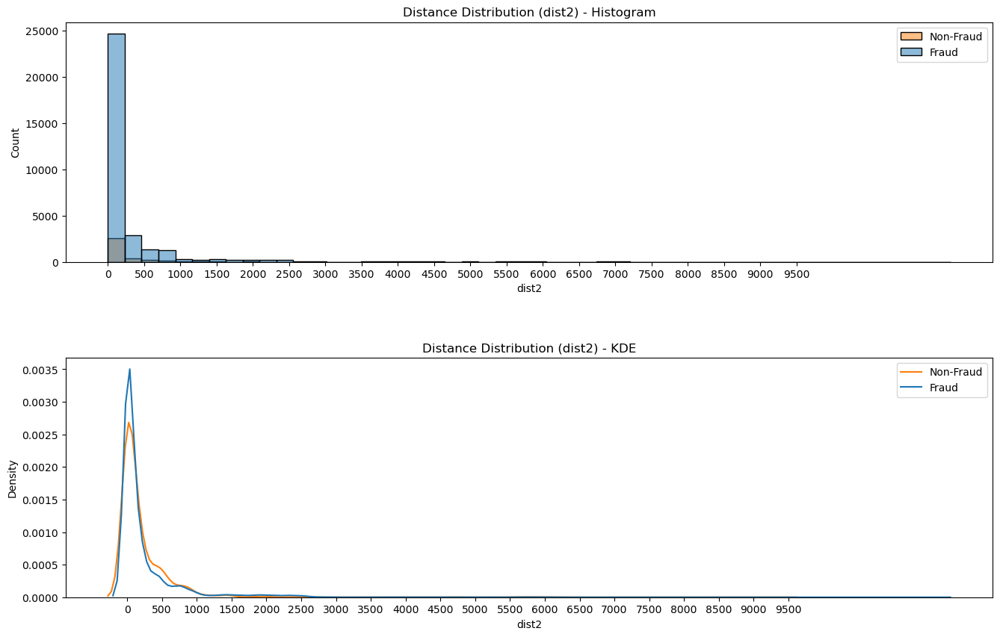

In [33]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(16, 10))

sns.histplot(data=train, x='dist2', hue='isFraud', common_norm=False, bins=50, ax=axs[0])
sns.kdeplot(data=train, x='dist2', hue='isFraud', common_norm=False, ax=axs[1])

plt.subplots_adjust(hspace=0.4)

axs[0].set_title('Distance Distribution (dist2) - Histogram')
axs[1].set_title('Distance Distribution (dist2) - KDE')

for ax in axs:
    ax.set_xticks(np.arange(0, 10000, 500))
    ax.legend(labels=['Non-Fraud', 'Fraud'])

plt.show()

Phân phối cho thấy hầu hết các giao dịch hợp pháp đều diễn ra rất gần với địa chỉ của chủ thẻ (từ giá trị khoảng cách từ 0 đến khoảng 100).

In [34]:
calculate_outliers(train['dist1'])

Outlier Statistics:
Number of values below lower bound: 0
Number of values above upper bound: 5703
Total number of outlier values: 5703
Total number of non-outlier values: 211462
Percentage of Outliers: 2.6969


In [35]:
calculate_outliers(train['dist2'])

Outlier Statistics:
Number of values below lower bound: 0
Number of values above upper bound: 885
Total number of outlier values: 885
Total number of non-outlier values: 34502
Percentage of Outliers: 2.5651


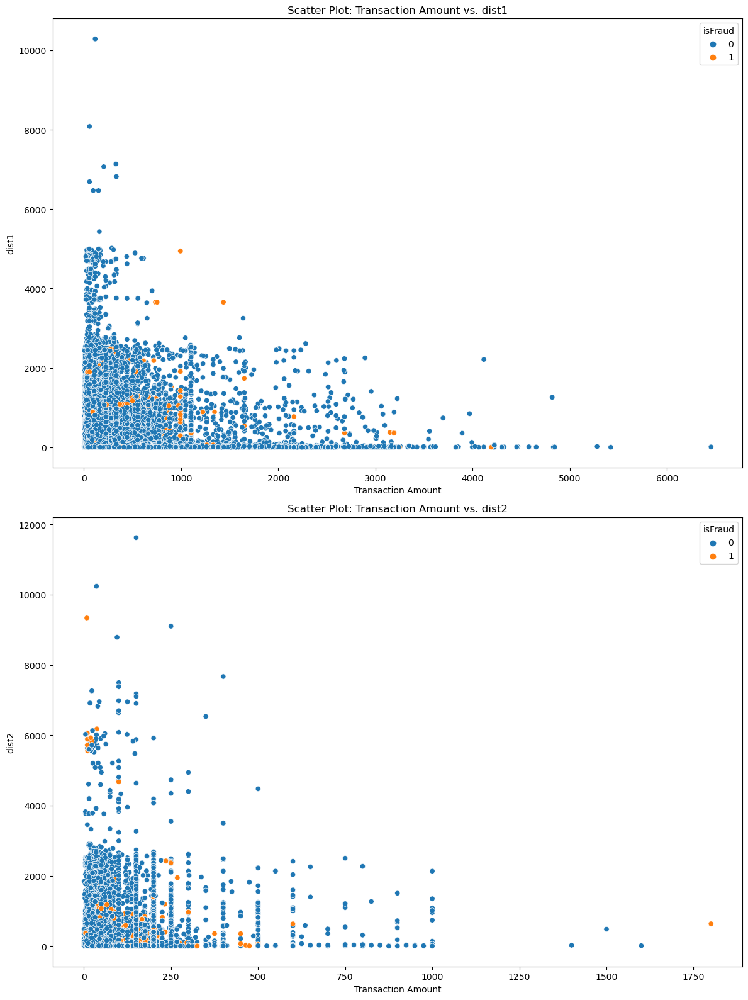

In [36]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(12, 16))

sns.scatterplot(data=train, x='TransactionAmt', y='dist1', hue='isFraud', ax=axs[0])
axs[0].set_title('Scatter Plot: Transaction Amount vs. dist1')
axs[0].set_xlabel('Transaction Amount')
axs[0].set_ylabel('dist1')

sns.scatterplot(data=train, x='TransactionAmt', y='dist2', hue='isFraud', ax=axs[1])
axs[1].set_title('Scatter Plot: Transaction Amount vs. dist2')
axs[1].set_xlabel('Transaction Amount')
axs[1].set_ylabel('dist2')

plt.tight_layout()
plt.show()

Từ biểu đồ phân tán, chúng ta có thể thấy rằng đối với dist1, các giá trị >= 6000 là các giá trị ngoại lai và có thể bị xóa, đối với các giá trị dist2 >= 8000 là các giá trị ngoại lai và cũng có thể bị xóa. Tôi chưa loại bỏ hoàn toàn tất cả các ngoại lai, chỉ các giá trị cực trị vì có nguy cơ mất thông tin có giá trị nếu các giá trị ngoại lai là hợp pháp và quan trọng để phát hiện gian lận.

In [37]:
train.drop(train[(train['dist1'] > 6000) | (train['dist2'] > 8000)].index, inplace=True)

In [38]:
train.shape

(543574, 435)

### Handling Missing Data

Vì cột dist2 có quá nhiều dữ liệu missing nên ta có thể drop

In [39]:
train.drop('dist2', axis=1, inplace=True)

**Predictive Modeling Imputation using RandomForestRegressor**

Vì lượng data bị thiếu khoảng 60%, khá cao, nên chúng ta sẽ dùng machine learning model để dự đoán các kết quả bị thiếu. Cột 'dist1' có thể chứa các mối quan hệ phi tuyến tính với các biến khác. Random Forest có khả năng mô hình hóa các mối quan hệ phi tuyến tính, giúp dự đoán chính xác hơn khi thay thế các giá trị bị thiếu.

In [40]:
# Lấy những cột số
numerical_columns = train.select_dtypes(include=['int64', 'float64']).columns

missing_percentages = (train[numerical_columns].isnull().sum() / len(train)) * 100

# Lấy cột không có missing values
numerical_columns_no_missing = missing_percentages[missing_percentages == 0].index.tolist()
numerical_columns_no_missing.remove('TransactionID')
numerical_columns_no_missing.remove('TransactionDT')
numerical_columns_no_missing.remove('hour')
numerical_columns_no_missing.remove('isFraud')
print(numerical_columns_no_missing)

['TransactionAmt', 'card1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']


In [41]:
categorical_columns = train.select_dtypes(include=['object']).columns
missing_percentages_cat = (train[categorical_columns].isnull().sum() / len(train)) * 100
categorical_columns_no_missing = missing_percentages_cat[missing_percentages_cat == 0].index.tolist()

print(categorical_columns_no_missing)

['ProductCD']


In [42]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

columns_no_missing = numerical_columns_no_missing + categorical_columns_no_missing

data = train[columns_no_missing + ['dist1']]
train_data = data[data['dist1'].notnull()]
test_data = data[data['dist1'].isnull()]


X_train = train_data.drop('dist1', axis=1)
y_train = train_data['dist1']


X_test = test_data.drop('dist1', axis=1)

combined_categorical = pd.concat([X_train[categorical_columns_no_missing], X_test[categorical_columns_no_missing]])
categorical_encoder = OneHotEncoder().fit(combined_categorical)


X_train_encoded = categorical_encoder.transform(X_train[categorical_columns_no_missing])
X_test_encoded = categorical_encoder.transform(X_test[categorical_columns_no_missing])

X_train_transformed = np.hstack((X_train_encoded.toarray(), X_train[numerical_columns_no_missing].values))
X_test_transformed = np.hstack((X_test_encoded.toarray(), X_test[numerical_columns_no_missing].values))


In [43]:
X_train.columns

Index(['TransactionAmt', 'card1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7',
       'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'ProductCD'],
      dtype='object')

In [44]:
# Huấn luyện Random Forest Regressor
model = RandomForestRegressor()
model.fit(X_train_transformed, y_train)

# dự đoán missing values
predicted_values = model.predict(X_test_transformed)

Kiểm tra imputed data trước khi cho vào tập dữ liệu

In [45]:
tempdf = train.copy()

In [46]:
tempdf.loc[tempdf['dist1'].isnull(), 'dist1'] = predicted_values

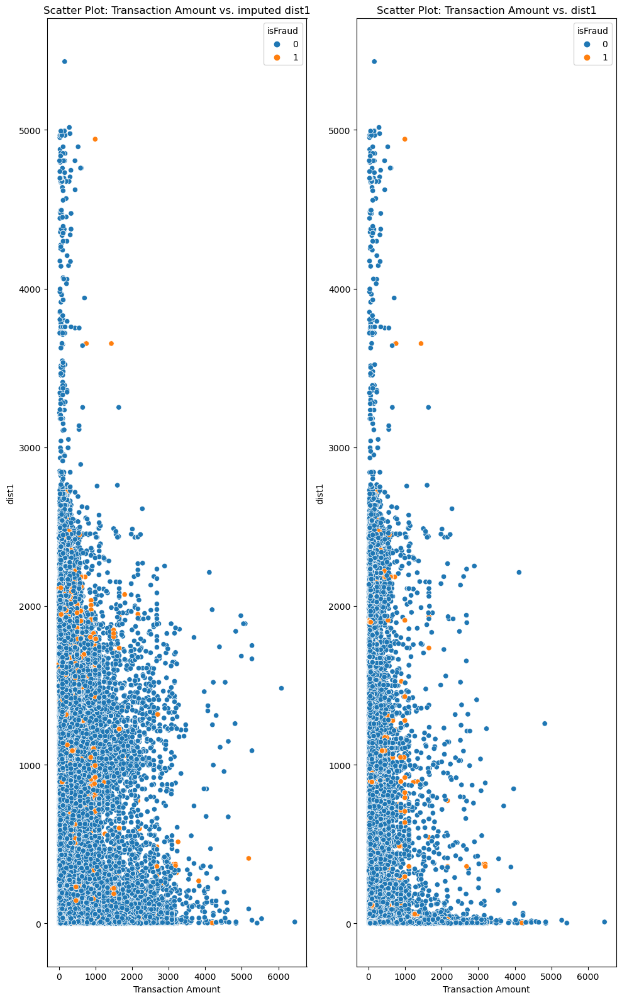

In [47]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 16))

# Scatter plot cho dist1 mới
sns.scatterplot(data=tempdf, x='TransactionAmt', y='dist1', hue='isFraud', ax=axs[0])
axs[0].set_title('Scatter Plot: Transaction Amount vs. imputed dist1')
axs[0].set_xlabel('Transaction Amount')
axs[0].set_ylabel('dist1')

# Scatter plot cho dist1
sns.scatterplot(data=train, x='TransactionAmt', y='dist1', hue='isFraud', ax=axs[1])
axs[1].set_title('Scatter Plot: Transaction Amount vs. dist1')
axs[1].set_xlabel('Transaction Amount')
axs[1].set_ylabel('dist1')

plt.tight_layout()
plt.show()

In [48]:
print(tempdf['dist1'].describe())
print('----------------------------')
print(train['dist1'].describe())

count    543574.000000
mean        648.742697
std         814.808631
min           0.000000
25%          11.000000
50%          94.170000
75%        1658.110000
max        5431.000000
Name: dist1, dtype: float64
----------------------------
count    217155.000000
mean        118.544606
std         368.653348
min           0.000000
25%           3.000000
50%           8.000000
75%          24.000000
max        5431.000000
Name: dist1, dtype: float64


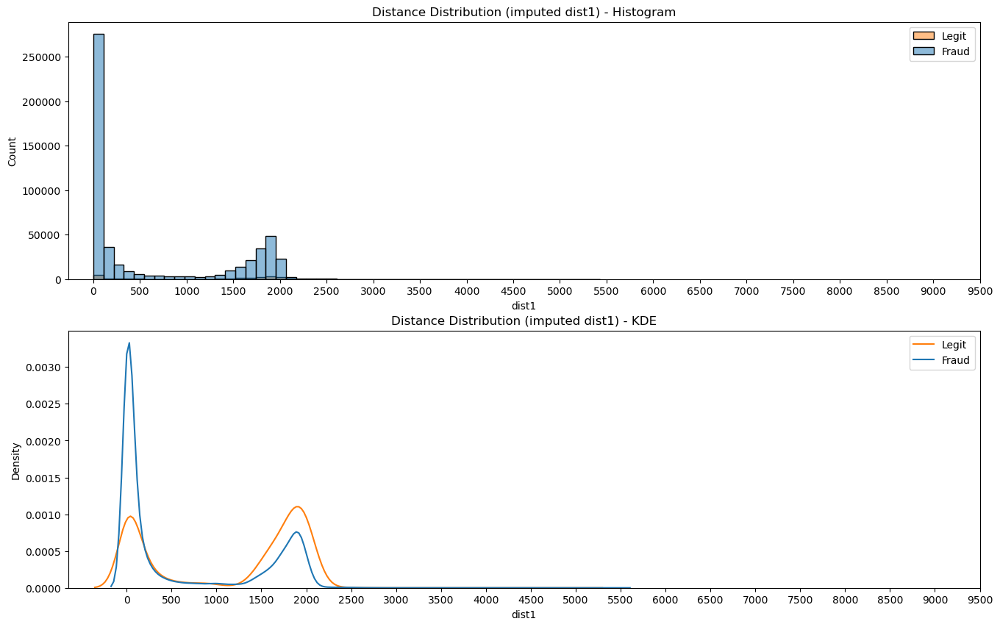

In [49]:
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(16, 10))

sns.histplot(data=tempdf, x='dist1', hue='isFraud', common_norm=False, bins=50, ax=axs[0])
sns.kdeplot(data=tempdf, x='dist1', hue='isFraud', common_norm=False, ax=axs[1])


axs[0].set_title('Distance Distribution (imputed dist1) - Histogram')
axs[1].set_title('Distance Distribution (imputed dist1) - KDE')

for ax in axs:
    ax.set_xticks(np.arange(0, 10000, 500))
    ax.legend(labels=['Legit', 'Fraud'])

In [50]:
train = tempdf.copy()

## C1-C14

Ý nghĩa: Counting, such as how many addresses are found to be associated with the payment card, etc. The actual meaning is masked.

In [51]:
col_c = ['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']
detectmissing(train[col_c])

,Name,dtypes,Missing(%),Uniques
0,C1,float64,0.0,1635
1,C2,float64,0.0,1179
2,C3,float64,0.0,26
3,C4,float64,0.0,1253
4,C5,float64,0.0,316
5,C6,float64,0.0,1321
6,C7,float64,0.0,1102
7,C8,float64,0.0,1242
8,C9,float64,0.0,205
9,C10,float64,0.0,1205


In [52]:
train[col_c].describe()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
count,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000,543574.000000
mean,14.553295,15.818354,0.005269,4.318779,5.545685,9.307340,3.070977,5.480924,4.445266,5.587718,10.567316,4.385662,32.595520,8.439804
std,138.376413,160.341150,0.147854,71.079929,25.653202,73.644401,64.326969,99.262812,16.600791,99.484911,97.590842,90.312105,131.328405,50.818505
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000
50%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,1.000000
75%,3.000000,3.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,2.000000,0.000000,2.000000,0.000000,12.000000,2.000000
max,4685.000000,5691.000000,25.000000,2253.000000,349.000000,2253.000000,2255.000000,3331.000000,210.000000,3257.000000,3188.000000,3188.000000,2918.000000,1429.000000


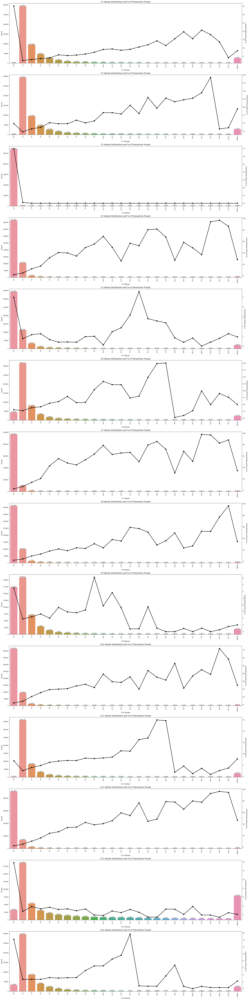

In [53]:
num_subplots = len(col_c)
num_rows = 14
num_cols = 1

fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 100))
fig.subplots_adjust(hspace=0.5)

axes = axes.flatten()

for i, col in enumerate(col_c):
    x = 25
    top_x_values = train[col].value_counts().head(x).index.tolist()

    train[col + '_grouped'] = train[col].apply(lambda x: x if x in top_x_values else 'Others')


    total = len(train)

    tmp = pd.crosstab(train[col + '_grouped'], train['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

    ax = axes[i]
    sns.countplot(x=col + '_grouped', data=train, order=list(tmp[col + '_grouped'].values), ax=ax)
    ax1 = sns.pointplot(x=col + '_grouped', y='Fraud', data=tmp,
                  color='black', order=list(tmp[col + '_grouped'].values), ax=ax.twinx())
    ax1.set_ylabel("% of Fraud Transactions", fontsize=12)
    ax.set_title(f"{col} Values Distribution and % of Transaction Frauds", fontsize=14)
    ax.set_xlabel(f"{col} Values", fontsize=12)
    ax.set_ylabel("Count", fontsize=12)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 25,
                '{:1.2f}%'.format(height/total*100),
                ha="center")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

    train.drop(col + '_grouped', axis=1, inplace=True)

for i in range(num_subplots, num_rows * num_cols):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


Chúng ta có thể thấy đáng chú ý nhất là C3, C5, C9 với số count giữ liệu cao và tỉ lệ fraud trong số dữ liệu đấy cũng rất là cao.

<Figure size 2000x2000 with 0 Axes>

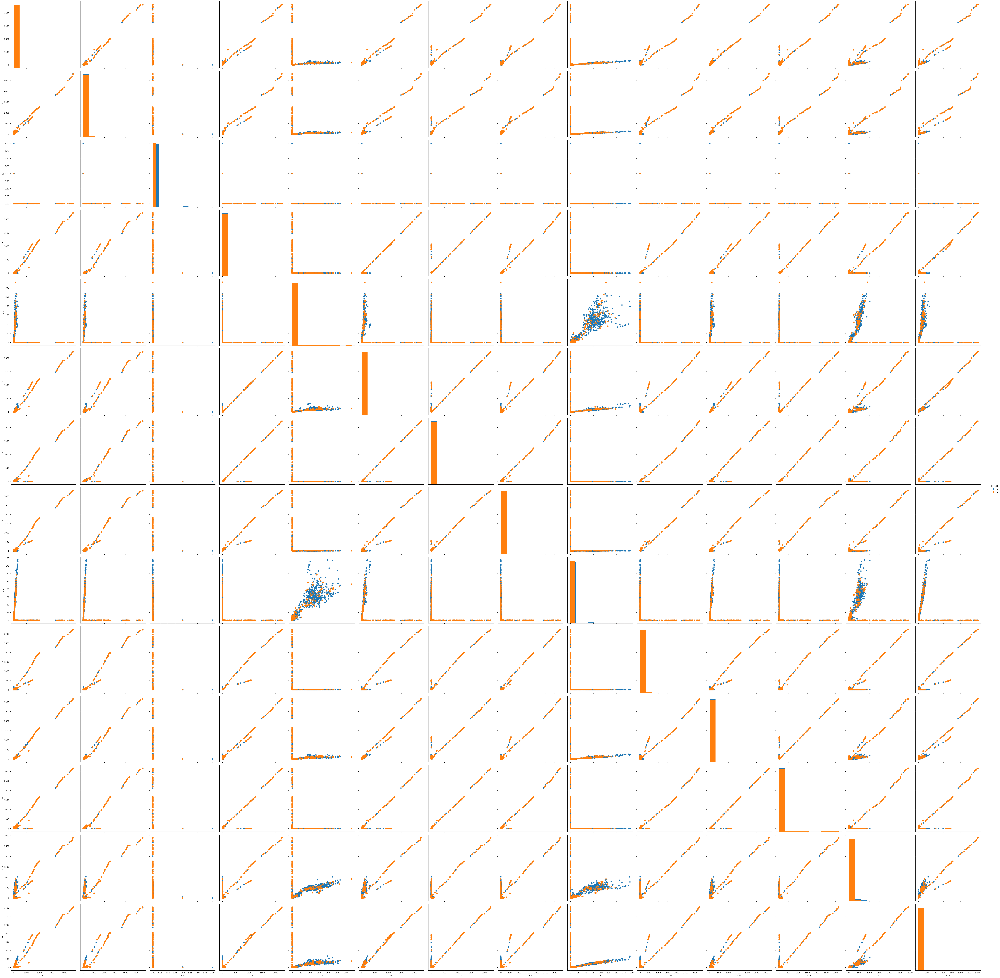

In [54]:
# Chọn ngẫu nhiên 10000 mẫu fraud và mẫu non-fraud
fraud_samples = train[train['isFraud'] == 0].sample(10000)
non_fraud_samples = train[train['isFraud'] == 1].sample(10000)
sample_df = pd.concat([fraud_samples, non_fraud_samples])

plt.figure(figsize=(20, 20))


g = sns.PairGrid(sample_df, vars=col_c, hue='isFraud', height=5)
g.map_diag(plt.hist)
g.map_offdiag(plt.scatter)
g.add_legend()

plt.show()

Chúng ta có thể thấy sự tuyến tính cũng như phi tuyến tồn tại giữa các đặc trưng.

### Check outliers

In [55]:
for col in col_c:
    print(col)
    calculate_outliers(train[col])
    print('----------------------------')

C1
Outlier Statistics:
Number of values below lower bound: 0
Number of values above upper bound: 1980
Total number of outlier values: 1980
Total number of non-outlier values: 541594
Percentage of Outliers: 0.3656
----------------------------
C2
Outlier Statistics:
Number of values below lower bound: 0
Number of values above upper bound: 2277
Total number of outlier values: 2277
Total number of non-outlier values: 541297
Percentage of Outliers: 0.4207
----------------------------
C3
Outlier Statistics:
Number of values below lower bound: 0
Number of values above upper bound: 2055
Total number of outlier values: 2055
Total number of non-outlier values: 541519
Percentage of Outliers: 0.3795
----------------------------
C4
Outlier Statistics:
Number of values below lower bound: 0
Number of values above upper bound: 1968
Total number of outlier values: 1968
Total number of non-outlier values: 541606
Percentage of Outliers: 0.3634
----------------------------
C5
Outlier Statistics:
Number of

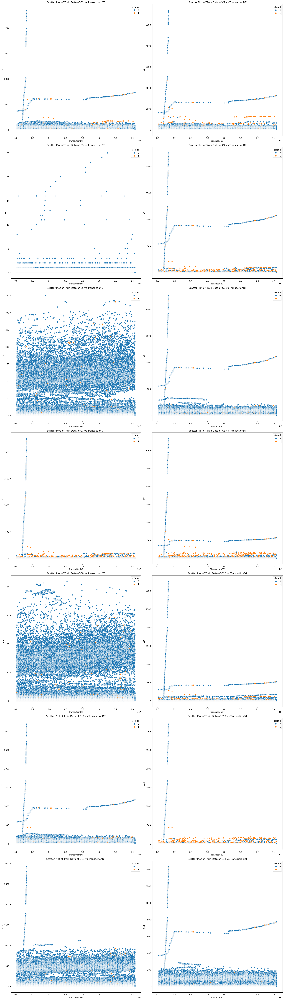

In [56]:
num_cols = len(col_c)
num_plots_per_row = 2
num_rows = (num_cols + num_plots_per_row - 1) // num_plots_per_row

plt.figure(figsize=(20, 10 * num_rows))
for i, col in enumerate(col_c, start=1):
    plt.subplot(num_rows, num_plots_per_row, i)
    sns.scatterplot(x="TransactionDT", y=col, hue="isFraud", data=train)
    plt.title(f'Scatter Plot of Train Data of {col} vs TransactionDT')

plt.tight_layout()
plt.show()

C3, C5 và C9 dường như không có giá trị ngoại lai nào có giá trị cực đại. Giữa các giá trị TransactionDT xấp xỉ trong phạm vi từ 1028000 đến 1199904 (tương ứng với ngày 4 đến ngày 6), một số feature C khác thể hiện các gía trị ngoại lai cực đại. Đáng chú ý, một số lượng đáng kể địa chỉ được liên kết với thẻ thanh toán trong khoảng thời gian cụ thể này.


Chúng ta sẽ loại bỏ các giá trị ngoại lai:

In [57]:

conditions = [
    train['C1'] > 3000,
    train['C2'] > 3000,
    train['C7'] > 1400,
    train['C4'] > 1400,
    train['C6'] > 1400,
    train['C7'] > 1400,
    train['C8'] > 1000,
    train['C10'] > 1000,
    train['C11'] > 2000,
    train['C12'] > 2000,
    train['C13'] > 1200,
    train['C14'] > 900
]

initial_shape = train.shape
print("Initial shape:", initial_shape)

values_drops_df = pd.DataFrame()

for i, condition in enumerate(conditions):
    values_drop = train[condition]['TransactionDT']
    values_drops_df[f"Drop {i+1}"] = values_drop


for condition in conditions:
    train.drop(train.loc[condition].index, inplace=True)

final_shape = train.shape
print("Final shape:", final_shape)


Initial shape: (543574, 434)
Final shape: (542580, 434)


In [58]:
print(values_drops_df.max().max())
print(values_drops_df.min().min())

1296011
1199984


## ProductCD
* Mã sản phẩm
* Categorical

In [59]:
total = len(train)
#total_test = len(test)

In [60]:
train['ProductCD'].isnull().sum()

0

- Không có missing value

In [61]:
train_count = train['ProductCD'].value_counts(normalize=True)
#test_count = test['ProductCD'].value_counts(normalize=True)
train_count

ProductCD
W    0.742150
C    0.115408
R    0.065953
H    0.058557
S    0.017931
Name: proportion, dtype: float64

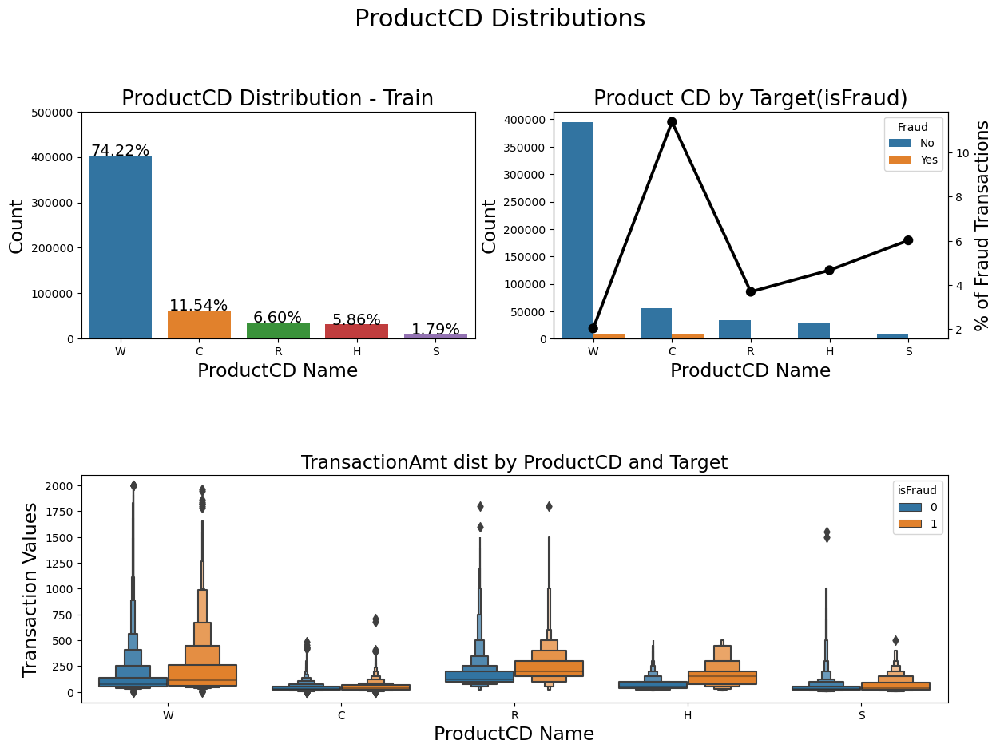

In [62]:
tmp = pd.crosstab(train['ProductCD'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

plt.figure(figsize=(14,10))
plt.suptitle('ProductCD Distributions', fontsize=22)

plt.subplot(221)
g = sns.countplot(x='ProductCD', data=train, order=train_count.index)
# plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])

g.set_title("ProductCD Distribution - Train", fontsize=19)
g.set_xlabel("ProductCD Name", fontsize=17)
g.set_ylabel("Count", fontsize=17)
g.set_ylim(0,500000)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=14)

plt.subplot(222)
g1 = sns.countplot(x='ProductCD', hue='isFraud', data=train, order=train_count.index)
plt.legend(title='Fraud', loc='best', labels=['No', 'Yes'])
gt = g1.twinx()
gt = sns.pointplot(x='ProductCD', y='Fraud', data=tmp, color='black', order=train_count.index)
gt.set_ylabel("% of Fraud Transactions", fontsize=16)

g1.set_title("Product CD by Target(isFraud)", fontsize=19)
g1.set_xlabel("ProductCD Name", fontsize=17)
g1.set_ylabel("Count", fontsize=17)

'''plt.subplot(2,2,3)
g2 = sns.countplot(x='ProductCD', data=test, order=train_count.index)
g2.set_title("ProductCD Distribution - Test", fontsize=19)
g2.set_xlabel("ProductCD Name", fontsize=17)
g2.set_ylabel("Count", fontsize=17)
g2.set_ylim(0,500000)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total_test*100),
            ha="center", fontsize=14) '''

plt.subplot(212)
g3 = sns.boxenplot(x='ProductCD', y='TransactionAmt', hue='isFraud',
              data=train[train['TransactionAmt'] <= 2000], order=train_count.index )
g3.set_title("TransactionAmt dist by ProductCD and Target", fontsize=17)
g3.set_xlabel("ProductCD Name", fontsize=17)
g3.set_ylabel("Transaction Values", fontsize=17)

plt.subplots_adjust(hspace = 0.6, top = 0.85)

plt.show()

- W chiếm tỷ lệ cao nhất (74.45%)
- C có xác suất fraud khá cao (~12%)
- Có thể thấy W, H và R có phân bố giá trị thanh toán ở giao dịch Fraud cao hơn một chút so với giao dịch Non-fraud

## Card
* Gồm 6 cột chứa thông tin thẻ thanh toán
* Dữ liệu dạng categorical đã hoặc chưa được encode

In [63]:
    cards = [col for col in train.columns if 'card' in col]
    train[cards].head()

,card1,card2,card3,card4,card5,card6
0,13926,NaN,150.0,discover,142.0,credit
1,2755,404.0,150.0,mastercard,102.0,credit
2,4663,490.0,150.0,visa,166.0,debit
3,18132,567.0,150.0,mastercard,117.0,debit
4,4497,514.0,150.0,mastercard,102.0,credit


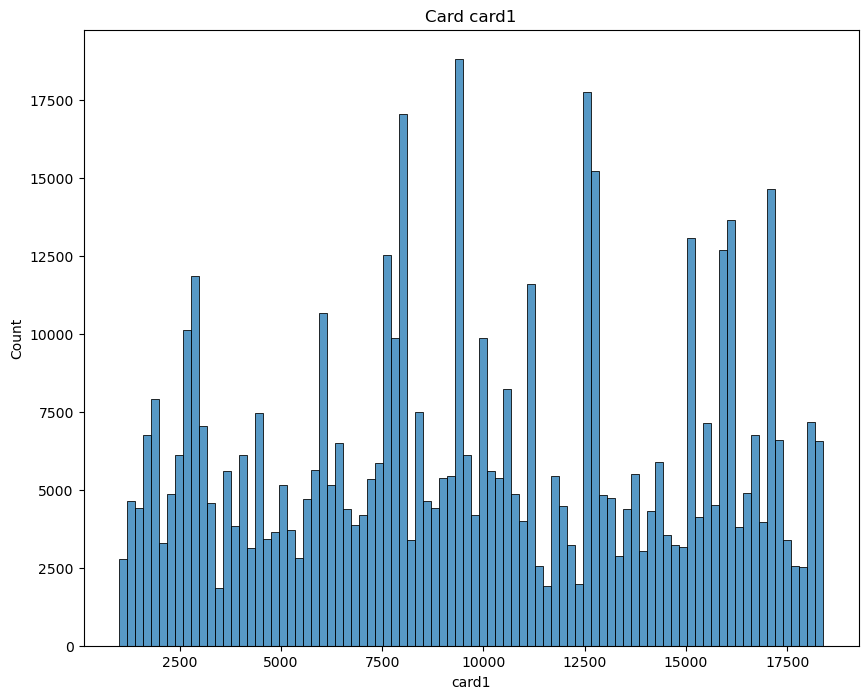

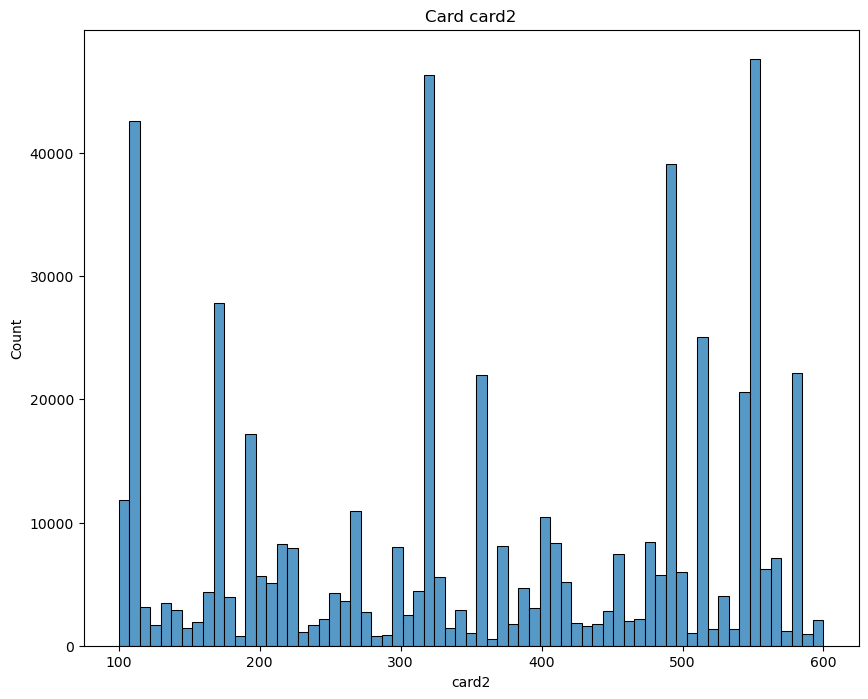

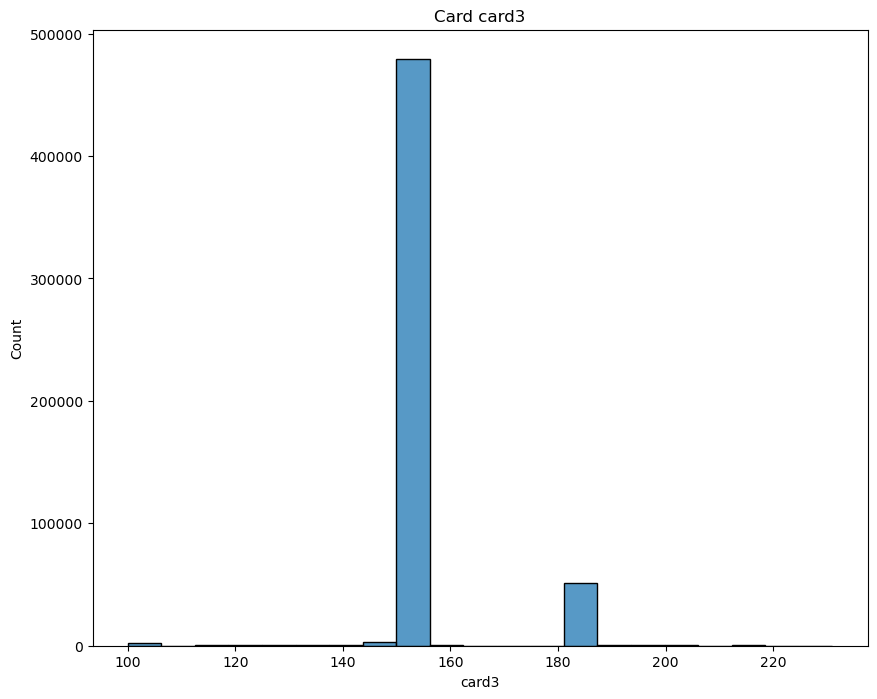

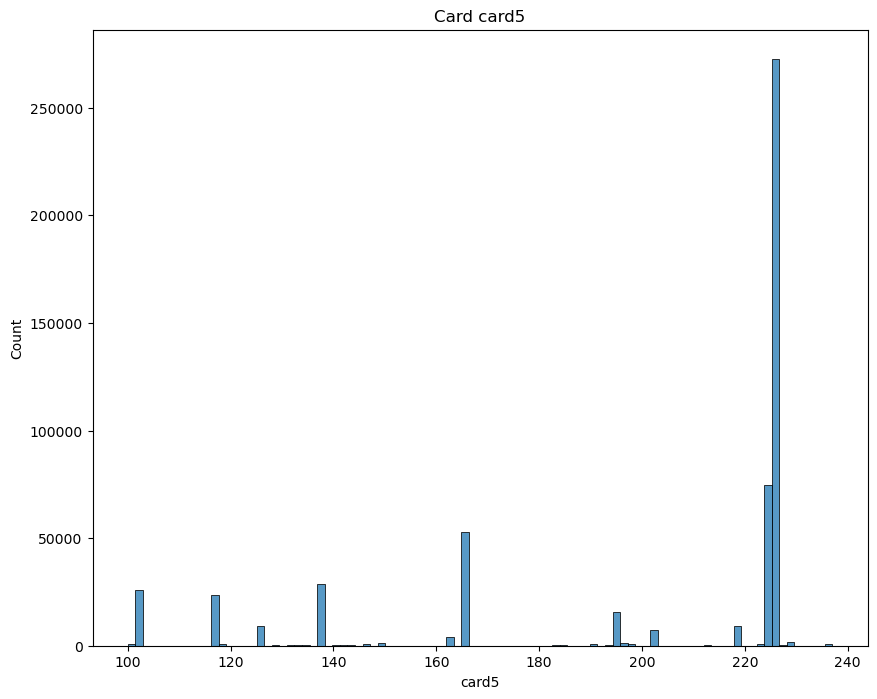

In [64]:
for c in cards:
    if train[c].dtypes in ['int64','float64']:
        fig, axes = plt.subplots(nrows=1, ncols=1,figsize=(10,8))
        sns.histplot(train[c])
        axes.title.set_text(f'Card {c}')
        plt.show()


In [65]:

cards_num = ["card1", "card2", "card3", "card5", "isFraud"]



correlation_matrix = train[cards_num].corr()

print(correlation_matrix)

            card1     card2     card3     card5   isFraud
card1    1.000000  0.004212  0.001729 -0.088495 -0.013305
card2    0.004212  1.000000  0.023526  0.034059  0.003096
card3    0.001729  0.023526  1.000000 -0.159714  0.149439
card5   -0.088495  0.034059 -0.159714  1.000000 -0.035367
isFraud -0.013305  0.003096  0.149439 -0.035367  1.000000


- Các cột gần như không có tương quan với nhau và với target

### card1

In [66]:
def describe(datatrain,feature):
    d = pd.DataFrame(columns=[feature,'Train','TrainFraud','TrainLegit'])
    d[feature] = ['count','mean','std','min','25%','50%','75%','max','unique','NaN','NaNshare']
    for i in range(0,8):
        d['Train'].iloc[i] = datatrain[feature].describe().iloc[i]
        d['TrainFraud'].iloc[i]=datatrain[datatrain['isFraud']==1][feature].describe().iloc[i]
        d['TrainLegit'].iloc[i]=datatrain[datatrain['isFraud']==0][feature].describe().iloc[i]
    d['Train'].iloc[8] = len(datatrain[feature].unique())
    d['TrainFraud'].iloc[8]=len(datatrain[datatrain['isFraud']==1][feature].unique())
    d['TrainLegit'].iloc[8]=len(datatrain[datatrain['isFraud']==0][feature].unique())
    d['Train'].iloc[9] = datatrain[feature].isnull().sum()
    d['TrainFraud'].iloc[9] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()
    d['TrainLegit'].iloc[9] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()
    d['Train'].iloc[10] = datatrain[feature].isnull().sum()/len(datatrain)
    d['TrainFraud'].iloc[10] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==1])
    d['TrainLegit'].iloc[10] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==0])
    return d

In [67]:
describe(train, 'card1')

,card1,Train,TrainFraud,TrainLegit
0,count,542580.0,18733.0,523847.0
1,mean,9880.264426,9535.711685,9892.585784
2,std,4897.281039,4767.289408,4901.421649
3,min,1000.0,1015.0,1000.0
4,25%,6019.0,5680.0,6019.0
5,50%,9633.0,9633.0,9642.0
6,75%,14153.0,13623.0,14170.0
7,max,18396.0,18375.0,18396.0
8,unique,13206,1639,13016
9,NaN,0,0,0


- Không có missing value
- Có 13553 giá trị nguyên từ 1000 - 18396

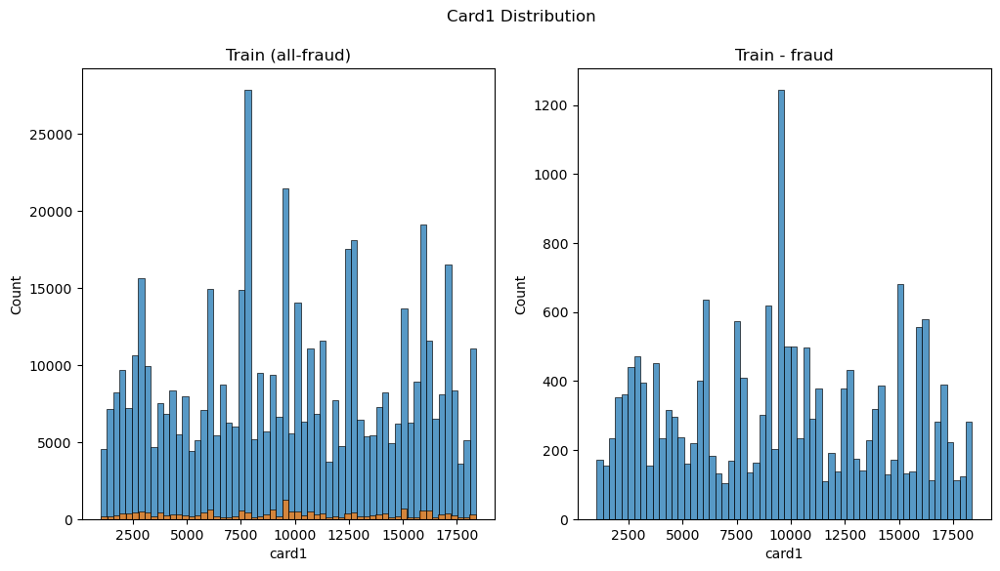

In [68]:
plt.figure(figsize=(12,6))
plt.suptitle('Card1 Distribution' , fontsize=12)
plt.subplot(1,2,1)
sns.histplot(train['card1'], bins=60)
sns.histplot(train[train['isFraud']==1]['card1'], bins=60)
plt.title("Train (all-fraud)")
plt.subplot(1,2,2)
sns.histplot(train[train['isFraud']==1]['card1'], bins=60)
plt.title("Train - fraud")
plt.show()

### card2

In [69]:
describe(train, 'card2')

,card2,Train,TrainFraud,TrainLegit
0,count,534153.0,18322.0,515831.0
1,mean,362.352444,364.947058,362.260285
2,std,157.923545,160.031807,157.847516
3,min,100.0,100.0,100.0
4,25%,209.0,204.0,210.0
5,50%,361.0,375.0,361.0
6,75%,512.0,514.0,512.0
7,max,600.0,599.0,600.0
8,unique,501,314,501
9,NaN,8427,411,8016


- Có 8933 (~ 1.51%) missing values, trong đó 423 (~ 4.73%) là Fraud
- 501 giá trị

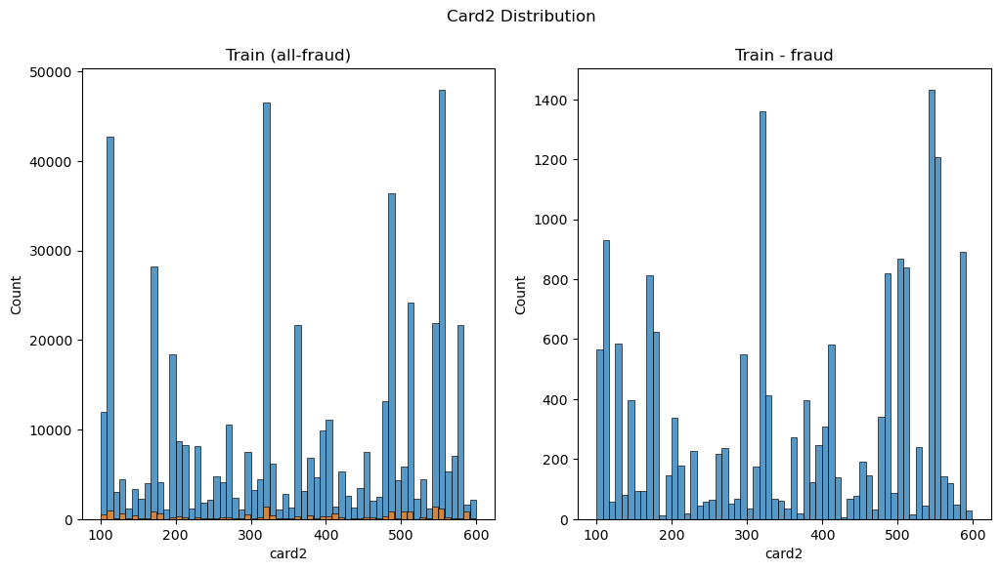

In [70]:
plt.figure(figsize=(12,6))
plt.suptitle('Card2 Distribution' , fontsize=12)
plt.subplot(1,2,1)
sns.histplot(train['card2'], bins=60)
sns.histplot(train[train['isFraud']==1]['card2'], bins=60)
plt.title("Train (all-fraud)")
plt.subplot(1,2,2)
sns.histplot(train[train['isFraud']==1]['card2'], bins=60)
plt.title("Train - fraud")
plt.show()

In [71]:
train['card2'].value_counts(normalize=True).head(20)

card2
321.0    0.083851
111.0    0.077674
555.0    0.072253
490.0    0.065506
583.0    0.037957
170.0    0.031349
194.0    0.030459
545.0    0.027938
360.0    0.026004
514.0    0.025186
174.0    0.019414
512.0    0.017362
408.0    0.013730
361.0    0.013457
100.0    0.013082
399.0    0.012802
225.0    0.012770
215.0    0.012481
553.0    0.011356
268.0    0.010722
Name: proportion, dtype: float64

### card3

In [72]:
describe(train,'card3')

,card3,Train,TrainFraud,TrainLegit
0,count,541016.0,18694.0,522322.0
1,mean,153.183346,162.118541,152.863554
2,std,11.311536,17.38288,10.89755
3,min,100.0,100.0,100.0
4,25%,150.0,150.0,150.0
5,50%,150.0,150.0,150.0
6,75%,150.0,185.0,150.0
7,max,231.0,229.0,231.0
8,unique,115,59,107
9,NaN,1564,39,1525


- Có 1565 (~ 0.265 %) missing values, trong đó 39 (~ 2.49%) là Fraud
- Có 115 giá trị

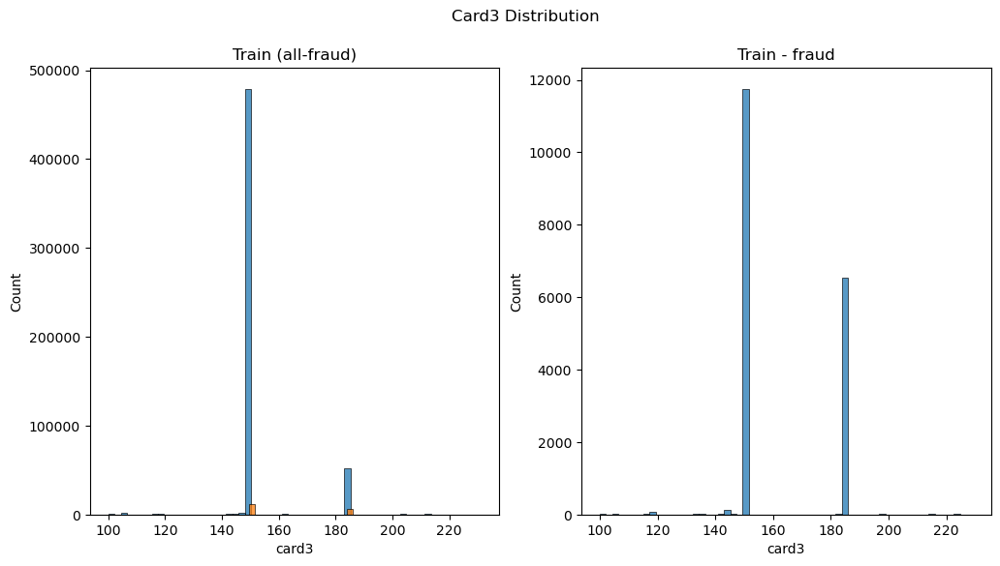

In [73]:
plt.figure(figsize=(12,6))
plt.suptitle('Card3 Distribution' , fontsize=12)
plt.subplot(1,2,1)
sns.histplot(train['card3'], bins=60)
sns.histplot(train[train['isFraud']==1]['card3'], bins=60)
plt.title("Train (all-fraud)")
plt.subplot(1,2,2)
sns.histplot(train[train['isFraud']==1]['card3'], bins=60)
plt.title("Train - fraud")
plt.show()

In [74]:
train['card3'].value_counts(normalize=True).head(20)

card3
150.0    0.885639
185.0    0.095343
106.0    0.002621
144.0    0.002174
146.0    0.002133
117.0    0.001580
143.0    0.001488
119.0    0.001331
102.0    0.000778
147.0    0.000619
162.0    0.000532
203.0    0.000431
213.0    0.000372
100.0    0.000340
200.0    0.000320
131.0    0.000305
134.0    0.000296
188.0    0.000275
149.0    0.000211
135.0    0.000209
Name: proportion, dtype: float64

In [75]:
train.loc[train.card3.isin(train.card3.value_counts()[train.card3.value_counts() < 0.001*total].index), 'card3'] = 100.0

In [76]:
tmp = pd.crosstab(train['card3'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

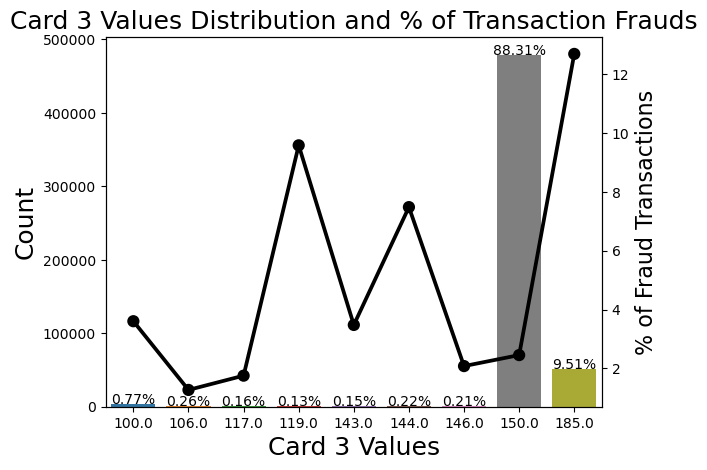

In [77]:
g2 = sns.countplot(x='card3', data=train, order=list(tmp.card3.values))
g22 = g2.twinx()
gg2 = sns.pointplot(x='card3', y='Fraud', data=tmp,
                    color='black', order=list(tmp.card3.values))
gg2.set_ylabel("% of Fraud Transactions", fontsize=16)
g2.set_title("Card 3 Values Distribution and % of Transaction Frauds", fontsize=18)
g2.set_xlabel("Card 3 Values", fontsize=18)
g2.set_ylabel("Count", fontsize=18)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 25,
            '{:1.2f}%'.format(height/total*100),
            ha="center")

- Hầu hết tập trung ở hai giá trị 150 (~ 88.27%) và 185 (~ 9.54%)
- 119, 144 và đặc biệt 185 có tỷ lệ Fraud cao

### card4

In [78]:
train['card4'].isnull().sum()/total

0.002904640790298205

In [79]:
x = train[train['card4'].isnull() & train["isFraud"]==1]
len(x)/train['card4'].isnull().sum()

0.02601522842639594

- Có 0.267% missing value, trong đó 2.60% là Fraud

In [80]:
train_count = train['card4'].value_counts(normalize=True)
train_count

card4
visa                0.653245
mastercard          0.320804
american express    0.014625
discover            0.011327
Name: proportion, dtype: float64

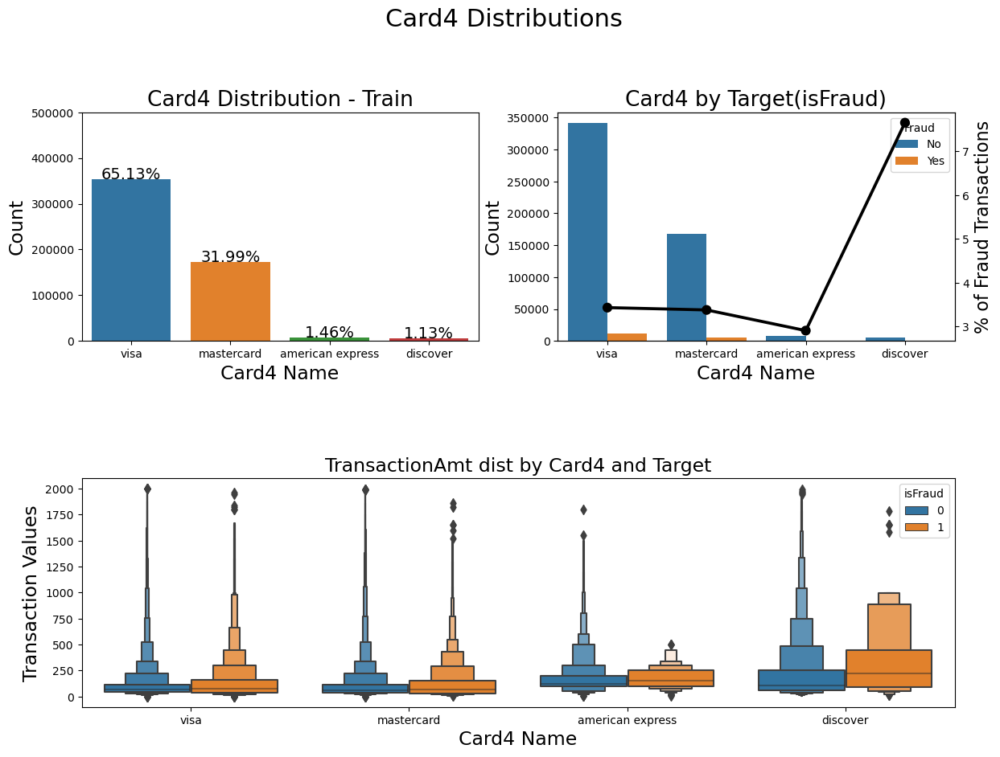

In [81]:
tmp = pd.crosstab(train['card4'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

plt.figure(figsize=(14,10))
plt.suptitle('Card4 Distributions', fontsize=22)

plt.subplot(221)
g = sns.countplot(x='card4', data=train, order=train_count.index)
# plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])

g.set_title("Card4 Distribution - Train", fontsize=19)
g.set_xlabel("Card4 Name", fontsize=17)
g.set_ylabel("Count", fontsize=17)
g.set_ylim(0,500000)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=14)

plt.subplot(222)
g1 = sns.countplot(x='card4', hue='isFraud', data=train, order=train_count.index)
plt.legend(title='Fraud', loc='best', labels=['No', 'Yes'])
gt = g1.twinx()
gt = sns.pointplot(x='card4', y='Fraud', data=tmp, color='black', order=train_count.index)
gt.set_ylabel("% of Fraud Transactions", fontsize=16)

g1.set_title("Card4 by Target(isFraud)", fontsize=19)
g1.set_xlabel("Card4 Name", fontsize=17)
g1.set_ylabel("Count", fontsize=17)

'''plt.subplot(2,2,3)
g2 = sns.countplot(x='card4', data=test, order=train_count.index)
g2.set_title("Card4 Distribution - Test", fontsize=19)
g2.set_xlabel("Card4 Name", fontsize=17)
g2.set_ylabel("Count", fontsize=17)
g2.set_ylim(0,500000)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total_test*100),
            ha="center", fontsize=14) '''

plt.subplot(212)
g3 = sns.boxenplot(x='card4', y='TransactionAmt', hue='isFraud',
              data=train[train['TransactionAmt'] <= 2000], order=train_count.index )
g3.set_title("TransactionAmt dist by Card4 and Target", fontsize=17)
g3.set_xlabel("Card4 Name", fontsize=17)
g3.set_ylabel("Transaction Values", fontsize=17)

plt.subplots_adjust(hspace = 0.6, top = 0.85)

plt.show()

- Thanh toán bằng thẻ visa và mastercard chiếm đa số
- Thanh toán bằng thẻ discover có xác suất Fraud khá cao (>7%)

In [82]:
train.groupby(['card4'])['isFraud'].value_counts(normalize=True)

card4             isFraud
american express  0          0.970930
                  1          0.029070
discover          0          0.923466
                  1          0.076534
mastercard        0          0.966213
                  1          0.033787
visa              0          0.965680
                  1          0.034320
Name: proportion, dtype: float64

### card5

In [83]:
describe(train,'card5')

,card5,Train,TrainFraud,TrainLegit
0,count,538477.0,18532.0,519945.0
1,mean,199.474811,191.791874,199.748648
2,std,41.012492,45.891934,40.801173
3,min,100.0,100.0,100.0
4,25%,166.0,138.0,166.0
5,50%,226.0,224.0,226.0
6,75%,226.0,226.0,226.0
7,max,237.0,237.0,237.0
8,unique,119,49,118
9,NaN,4103,201,3902


- Có 4259 (0.7%) missing value, trong đó 210 (4.93%) là Fraud

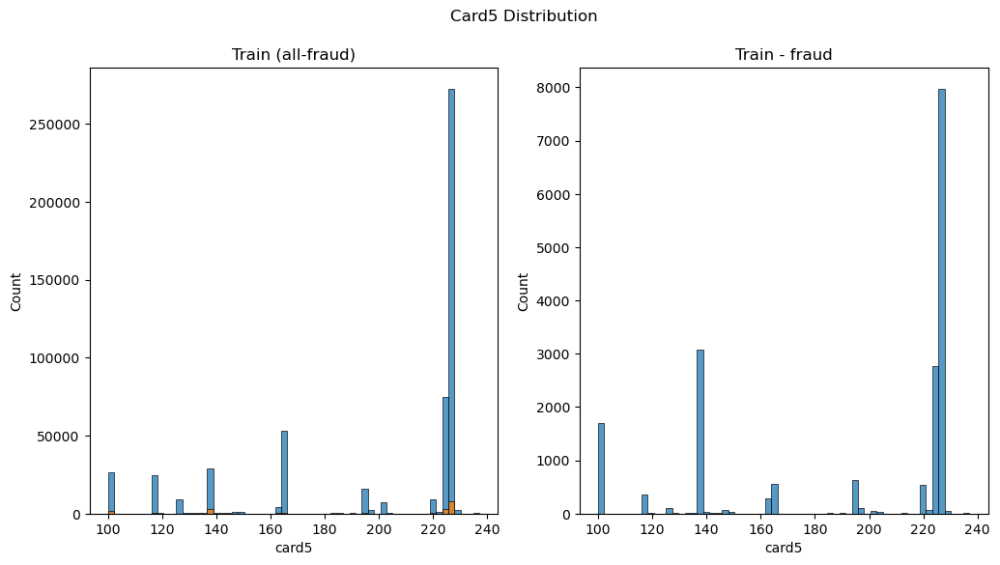

In [84]:
plt.figure(figsize=(12,6))
plt.suptitle('Card5 Distribution' , fontsize=12)
plt.subplot(1,2,1)
sns.histplot(train['card5'], bins=60)
sns.histplot(train[train['isFraud']==1]['card5'], bins=60)
plt.title("Train (all-fraud)")
plt.subplot(1,2,2)
sns.histplot(train[train['isFraud']==1]['card5'], bins=60)
plt.title("Train - fraud")
plt.show()

In [85]:
train['card5'].value_counts(normalize=True).head(20)

card5
226.0    0.506269
224.0    0.138808
166.0    0.098416
102.0    0.047982
117.0    0.044113
138.0    0.033424
195.0    0.028835
137.0    0.020164
219.0    0.017041
126.0    0.016757
202.0    0.013191
162.0    0.007777
229.0    0.003274
197.0    0.002644
150.0    0.002353
223.0    0.001677
100.0    0.001668
118.0    0.001333
190.0    0.001307
198.0    0.001190
Name: proportion, dtype: float64

In [86]:
train.loc[train.card5.isin(train.card5.value_counts()[train.card5.value_counts() < 0.001*total].index), 'card5'] = 240.0

In [87]:
train['card5'].value_counts(normalize=True)

card5
226.0    0.506269
224.0    0.138808
166.0    0.098416
102.0    0.047982
117.0    0.044113
138.0    0.033424
195.0    0.028835
137.0    0.020164
219.0    0.017041
126.0    0.016757
202.0    0.013191
240.0    0.009458
162.0    0.007777
229.0    0.003274
197.0    0.002644
150.0    0.002353
223.0    0.001677
100.0    0.001668
118.0    0.001333
190.0    0.001307
198.0    0.001190
146.0    0.001185
236.0    0.001133
Name: proportion, dtype: float64

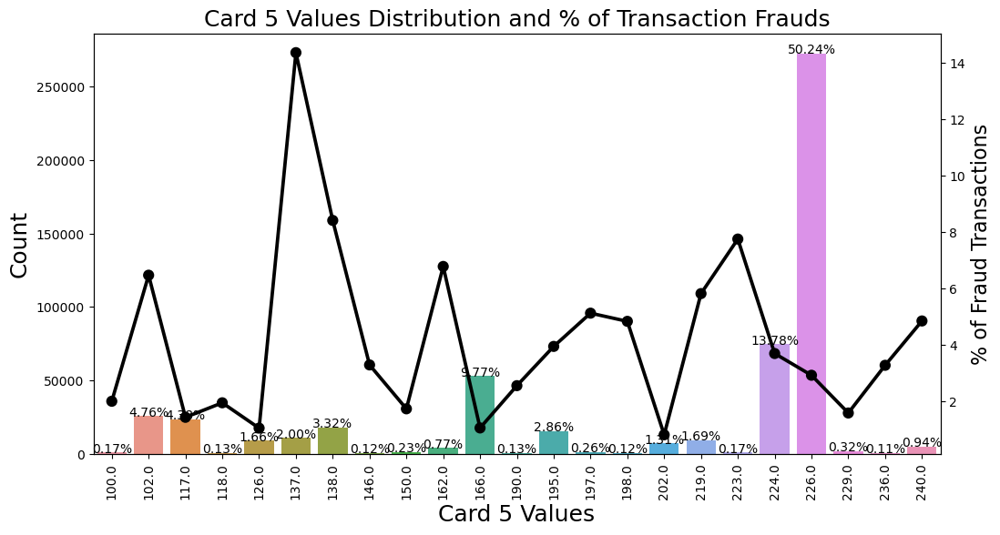

In [88]:
tmp = pd.crosstab(train['card5'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
plt.figure(figsize=(12,6))
g2 = sns.countplot(x='card5', data=train, order=list(tmp.card5.values))
g22 = g2.twinx()
gg2 = sns.pointplot(x='card5', y='Fraud', data=tmp,
                    color='black', order=list(tmp.card5.values))
gg2.set_ylabel("% of Fraud Transactions", fontsize=16)
g2.set_title("Card 5 Values Distribution and % of Transaction Frauds", fontsize=18)
g2.set_xlabel("Card 5 Values", fontsize=18)
g2.set_ylabel("Count", fontsize=18)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 25,
            '{:1.2f}%'.format(height/total*100),
            ha="center")
g2.set_xticklabels(g2.get_xticklabels(), rotation=90)
plt.show()

- 226 chiếm hơn 50%
- Tỷ lệ Fraud không đồng đều, đặc biệt cao ở 137 (>14%)

### card6

In [89]:
train['card6'].isnull().sum()/total

0.0028935825131777802

In [90]:
x = train[train['card6'].isnull() & train["isFraud"]==1]
len(x)/train['card6'].isnull().sum()

0.024840764331210193

- Có 0.266 % missing value, trong đó 2.48% là Fraud

In [91]:
train[train['card3'].isnull()] [cards]

,card1,card2,card3,card4,card5,card6
9686,16794,NaN,NaN,NaN,NaN,NaN
28994,5178,NaN,NaN,NaN,NaN,NaN
29013,5178,NaN,NaN,NaN,NaN,NaN
254275,9026,NaN,NaN,NaN,NaN,NaN
283428,5224,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
526599,18018,NaN,NaN,NaN,NaN,NaN
526600,7861,NaN,NaN,NaN,NaN,NaN
526601,16752,NaN,NaN,NaN,NaN,NaN
526603,16132,NaN,NaN,NaN,NaN,NaN


In [92]:
train[train['card2'].isnull() & train['card3'].isnull() & train['card4'].isnull()&train['card5'].isnull() & train['card6'].isnull()] [cards]

,card1,card2,card3,card4,card5,card6
9686,16794,NaN,NaN,NaN,NaN,NaN
28994,5178,NaN,NaN,NaN,NaN,NaN
29013,5178,NaN,NaN,NaN,NaN,NaN
254275,9026,NaN,NaN,NaN,NaN,NaN
283428,5224,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
526599,18018,NaN,NaN,NaN,NaN,NaN
526600,7861,NaN,NaN,NaN,NaN,NaN
526601,16752,NaN,NaN,NaN,NaN,NaN
526603,16132,NaN,NaN,NaN,NaN,NaN


- Nếu cột card3 có giá trị null, các cột card2,4,5,6 cũng vậy

In [93]:
cards = [col for col in train.columns if 'card' in col]

In [94]:
train_count = train['card6'].value_counts(normalize=True)
train_count

card6
debit              0.746631
credit             0.253286
debit or credit    0.000055
charge card        0.000028
Name: proportion, dtype: float64

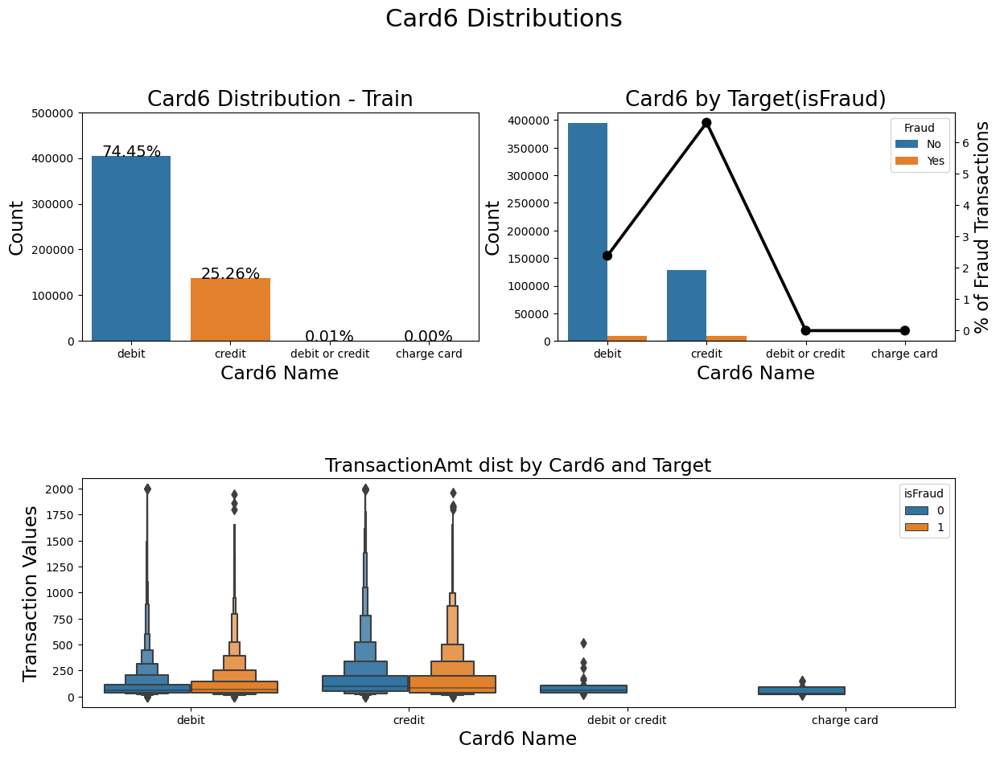

In [95]:
tmp = pd.crosstab(train['card6'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

plt.figure(figsize=(14,10))
plt.suptitle('Card6 Distributions', fontsize=22)

plt.subplot(221)
g = sns.countplot(x='card6', data=train, order=train_count.index)
# plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])

g.set_title("Card6 Distribution - Train", fontsize=19)
g.set_xlabel("Card6 Name", fontsize=17)
g.set_ylabel("Count", fontsize=17)
g.set_ylim(0,500000)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=14)

plt.subplot(222)
g1 = sns.countplot(x='card6', hue='isFraud', data=train, order=train_count.index)
plt.legend(title='Fraud', loc='best', labels=['No', 'Yes'])
gt = g1.twinx()
gt = sns.pointplot(x='card6', y='Fraud', data=tmp, color='black', order=train_count.index)
gt.set_ylabel("% of Fraud Transactions", fontsize=16)

g1.set_title("Card6 by Target(isFraud)", fontsize=19)
g1.set_xlabel("Card6 Name", fontsize=17)
g1.set_ylabel("Count", fontsize=17)

'''plt.subplot(2,2,3)
g2 = sns.countplot(x='card6', data=test, order=train_count.index)
g2.set_title("Card6 Distribution - Test", fontsize=19)
g2.set_xlabel("Card6 Name", fontsize=17)
g2.set_ylabel("Count", fontsize=17)
g2.set_ylim(0,500000)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height/total_test*100),
            ha="center", fontsize=14) '''

plt.subplot(212)
g3 = sns.boxenplot(x='card6', y='TransactionAmt', hue='isFraud',
              data=train[train['TransactionAmt'] <= 2000], order=train_count.index )
g3.set_title("TransactionAmt dist by Card6 and Target", fontsize=17)
g3.set_xlabel("Card6 Name", fontsize=17)
g3.set_ylabel("Transaction Values", fontsize=17)

plt.subplots_adjust(hspace = 0.6, top = 0.85)

plt.show()

- Hầu hết là giá trị debit và credit, tổng đến hơn 99%
- Không có giá trị Fraud ở debit or credit, change card
- Credit có tỷ lệ Fraud cao hơn
- Gộp 2 nhãn debit or credit, change card vào debit vì có số lượng rất nhỏ

In [96]:
train.loc[train['card6'].isin(['debit or credit', 'change card']),'card6'] = 'debit'

### Xử lý missing data
- card2: điền ngẫu nhiên
- card3,4,5,6: điền giá trị mode phổ biến nhất do có ít missing data

In [97]:
train.card3.fillna(150, inplace=True)

In [98]:
train.card5.fillna(226, inplace=True)

In [99]:
train.card4.fillna('visa', inplace=True)

In [100]:
train.card6.fillna('debit', inplace=True)

In [101]:
import random
def impute_missing_card2(row):
    if pd.isna(row['card2']):
        return random.choice(x)
    return row['card2']

x = train['card2'].value_counts().index

train['card2'] = train.apply(impute_missing_card2, axis=1)

In [102]:
train.isnull().sum()

TransactionID          0
isFraud                0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
card2                  0
card3                  0
card4                  0
card5                  0
card6                  0
addr1              59847
addr2              59847
dist1                  0
P_emaildomain      85903
R_emaildomain     415929
C1                     0
C2                     0
C3                     0
C4                     0
C5                     0
C6                     0
C7                     0
C8                     0
C9                     0
C10                    0
C11                    0
C12                    0
C13                    0
C14                    0
D1                  1228
D2                260736
D3                244801
D4                157635
D5                287560
D6                476780
D7                508302
D8                473830
D9                473830
D10                71597


## Address
- Thông tin địa chỉ người mua
- addr1: vùng
- addr2: quốc gia

### addr1

In [103]:
describe(train,'addr1')

,addr1,Train,TrainFraud,TrainLegit
0,count,482733.0,11855.0,470878.0
1,mean,290.634293,293.145846,290.571061
2,std,101.81064,103.117428,101.776834
3,min,100.0,110.0,100.0
4,25%,204.0,204.0,204.0
5,50%,299.0,299.0,299.0
6,75%,330.0,330.0,330.0
7,max,540.0,536.0,540.0
8,unique,330,86,330
9,NaN,59847,6878,52969


- 65706 ~ 11.1% missing data, trong đó có 7741 ~ 11.78 % là Fraud, khá cao!

In [104]:
x = train[train['addr1'].isnull() & train['addr2'].isnull()]
len(x)

59847

- addr1 và addr2 có cùng các quan sát chứa missing data

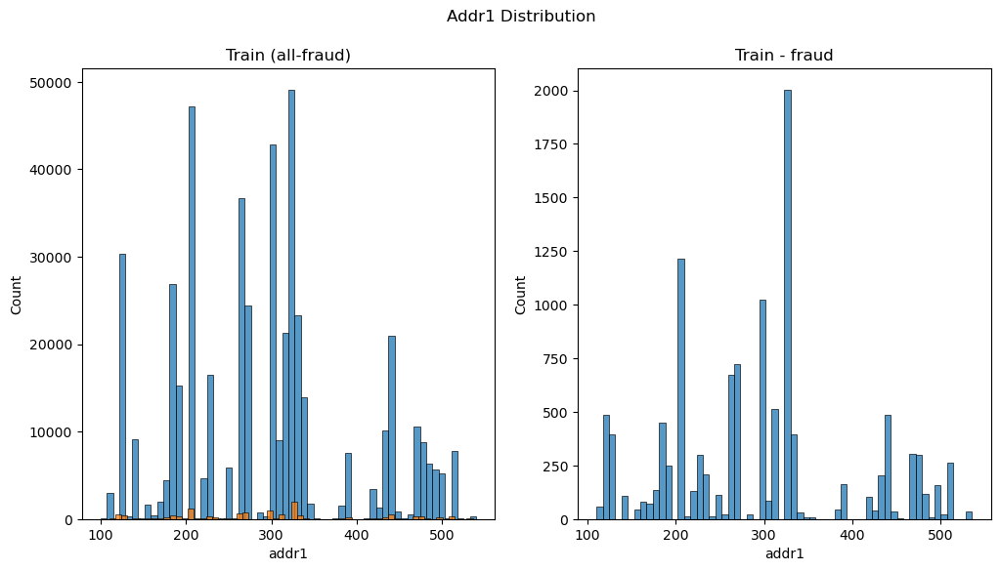

In [105]:
plt.figure(figsize=(12,6))
plt.suptitle('Addr1 Distribution' , fontsize=12)
plt.subplot(1,2,1)
sns.histplot(train['addr1'], bins=60)
sns.histplot(train[train['isFraud']==1]['addr1'], bins=60)
plt.title("Train (all-fraud)")
plt.subplot(1,2,2)
sns.histplot(train[train['isFraud']==1]['addr1'], bins=60)
plt.title("Train - fraud")
plt.show()

In [106]:
train['addr1'].value_counts(normalize=True).head(20)

addr1
299.0    0.088730
325.0    0.081368
204.0    0.079613
264.0    0.075955
330.0    0.048283
315.0    0.044144
441.0    0.039604
272.0    0.038471
123.0    0.030634
184.0    0.029132
126.0    0.029060
337.0    0.028852
191.0    0.028587
181.0    0.026487
143.0    0.018754
476.0    0.018167
472.0    0.016282
310.0    0.016226
327.0    0.016114
512.0    0.015704
Name: proportion, dtype: float64

- Điền missing data là 1 giá trị riêng biệt (550)
- Quy các nhãn có ít dứ liệu về 1 nhãn chung (545)

In [107]:
train.loc[train.addr1.isin(train.addr1.value_counts()[train.addr1.value_counts() < 0.001*total].index), 'addr1'] = 545.0
train.addr1.fillna(550.0, inplace=True)

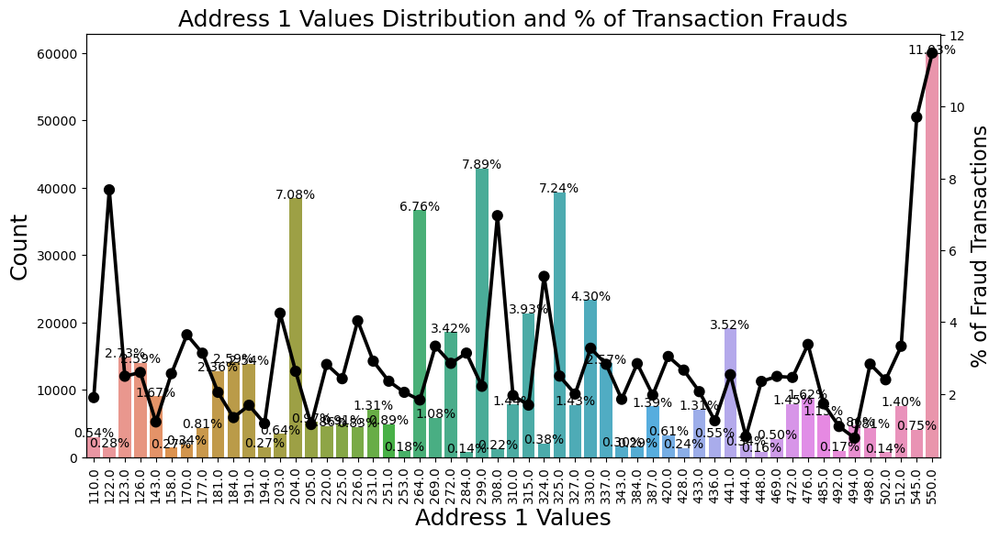

In [108]:
tmp = pd.crosstab(train['addr1'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
plt.figure(figsize=(12,6))
g2 = sns.countplot(x='addr1', data=train, order=list(tmp.addr1.values))
g22 = g2.twinx()
gg2 = sns.pointplot(x='addr1', y='Fraud', data=tmp,
                    color='black', order=list(tmp.addr1.values))
gg2.set_ylabel("% of Fraud Transactions", fontsize=16)
g2.set_title("Address 1 Values Distribution and % of Transaction Frauds", fontsize=18)
g2.set_xlabel("Address 1 Values", fontsize=18)
g2.set_ylabel("Count", fontsize=18)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 25,
            '{:1.2f}%'.format(height/total*100),
            ha="center")
g2.set_xticklabels(g2.get_xticklabels(), rotation=90)
plt.show()

-

### addr2

In [109]:
describe(train,'addr2')

,addr2,Train,TrainFraud,TrainLegit
0,count,482733.0,11855.0,470878.0
1,mean,86.790681,86.249431,86.804308
2,std,2.749018,5.026683,2.665278
3,min,10.0,10.0,13.0
4,25%,87.0,87.0,87.0
5,50%,87.0,87.0,87.0
6,75%,87.0,87.0,87.0
7,max,102.0,96.0,102.0
8,unique,74,18,68
9,NaN,59847,6878,52969


In [110]:
def ploting(df, col):
    tmp = pd.crosstab(df[col], df['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

    plt.figure(figsize=(12,6))

    g = sns.countplot( x=col,  data=df, order=list(tmp[col].values))
    gt = g.twinx()
    gt = sns.pointplot(x=col, y='Fraud', data=tmp, order=list(tmp[col].values),
                       color='black')
    gt.set_ylim(0,tmp['Fraud'].max()*1.1)
    gt.set_ylabel("%Fraud Transactions", fontsize=16)
    g.set_title(f"Most Frequent {col} values and % Fraud Transactions", fontsize=20)
    g.set_xlabel(f"{col} Category Names", fontsize=16)
    g.set_ylabel("Count", fontsize=17)
    g.set_xticklabels(g.get_xticklabels(),rotation=45)
    sizes = []
    for p in g.patches:
        height = p.get_height()
        sizes.append(height)
        g.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total*100),
                ha="center",fontsize=12)

    g.set_ylim(0,max(sizes)*1.15)
    plt.show()

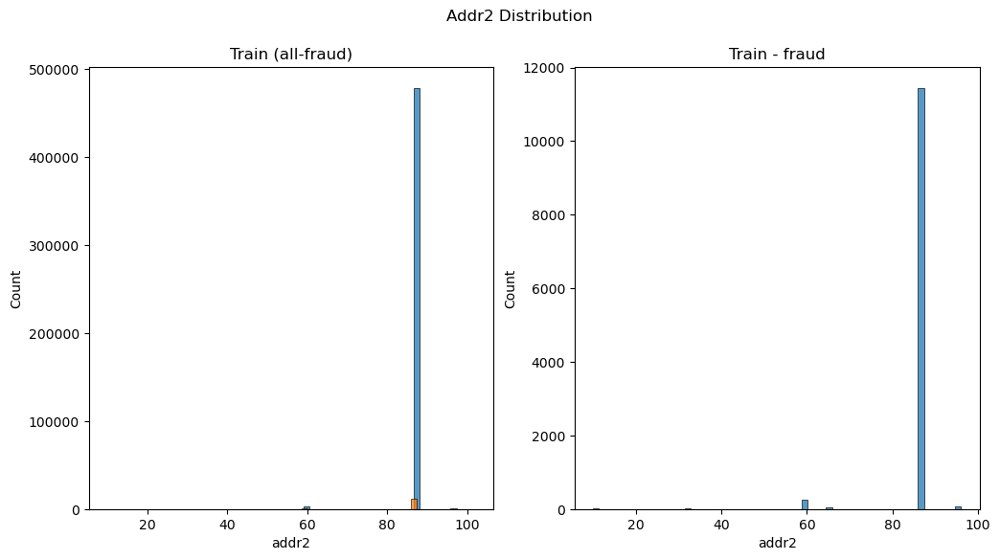

In [111]:
plt.figure(figsize=(12,6))
plt.suptitle('Addr2 Distribution' , fontsize=12)
plt.subplot(1,2,1)
sns.histplot(train['addr2'], bins=60)
sns.histplot(train[train['isFraud']==1]['addr2'], bins=60)
plt.title("Train (all-fraud)")
plt.subplot(1,2,2)
sns.histplot(train[train['isFraud']==1]['addr2'], bins=60)
plt.title("Train - fraud")
plt.show()

In [112]:
train['addr2'].value_counts(normalize=True).head(20)

addr2
87.0     0.991318
60.0     0.006200
96.0     0.001245
32.0     0.000186
65.0     0.000155
16.0     0.000099
31.0     0.000097
19.0     0.000068
26.0     0.000041
27.0     0.000037
69.0     0.000035
59.0     0.000031
34.0     0.000029
43.0     0.000025
29.0     0.000023
98.0     0.000023
102.0    0.000023
57.0     0.000019
68.0     0.000019
10.0     0.000017
Name: proportion, dtype: float64

In [113]:
train.loc[train.addr2.isin(train.addr2.value_counts()[train.addr2.value_counts() < 0.001*total].index), 'addr2'] = 104.0
train.addr2.fillna(105.0, inplace=True)

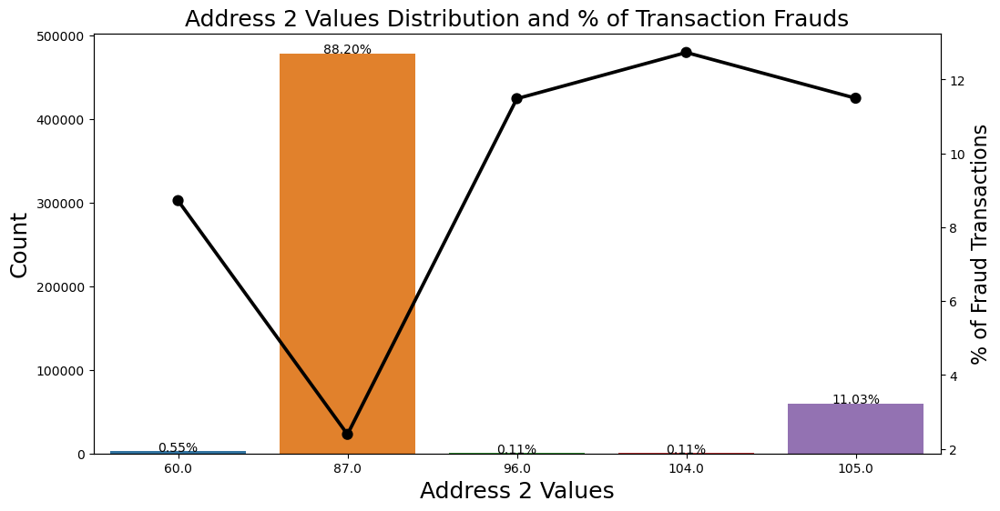

In [114]:
tmp = pd.crosstab(train['addr2'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
plt.figure(figsize=(12,6))
g2 = sns.countplot(x='addr2', data=train, order=list(tmp.addr2.values))
g22 = g2.twinx()
gg2 = sns.pointplot(x='addr2', y='Fraud', data=tmp,
                    color='black', order=list(tmp.addr2.values))
gg2.set_ylabel("% of Fraud Transactions", fontsize=16)
g2.set_title("Address 2 Values Distribution and % of Transaction Frauds", fontsize=18)
g2.set_xlabel("Address 2 Values", fontsize=18)
g2.set_ylabel("Count", fontsize=18)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 25,
            '{:1.2f}%'.format(height/total*100),
            ha="center")
plt.show()

- Hầu hết ở cùng quốc gia 87 (~ 88.14%), các giao dịch ngoài quốc gia này hoặc không có thông tin có xác suát Fraud khá cao.

## Email Domain
- P_emaildomain: email domain của người mua
- R_emaildomain: email domain của người nhận

### P_emaildomain

In [115]:
train['P_emaildomain'].isnull().sum()/len(train)

0.15832319657930627

In [116]:
len(train[train['P_emaildomain'].isnull() & train['isFraud']==1])/ train['P_emaildomain'].isnull().sum()

0.029416900457492755

- Có 16% missing data, trong đó 2.95% là Fraud

In [117]:
train_count = train['P_emaildomain'].value_counts(normalize=True)
len(train_count)

59

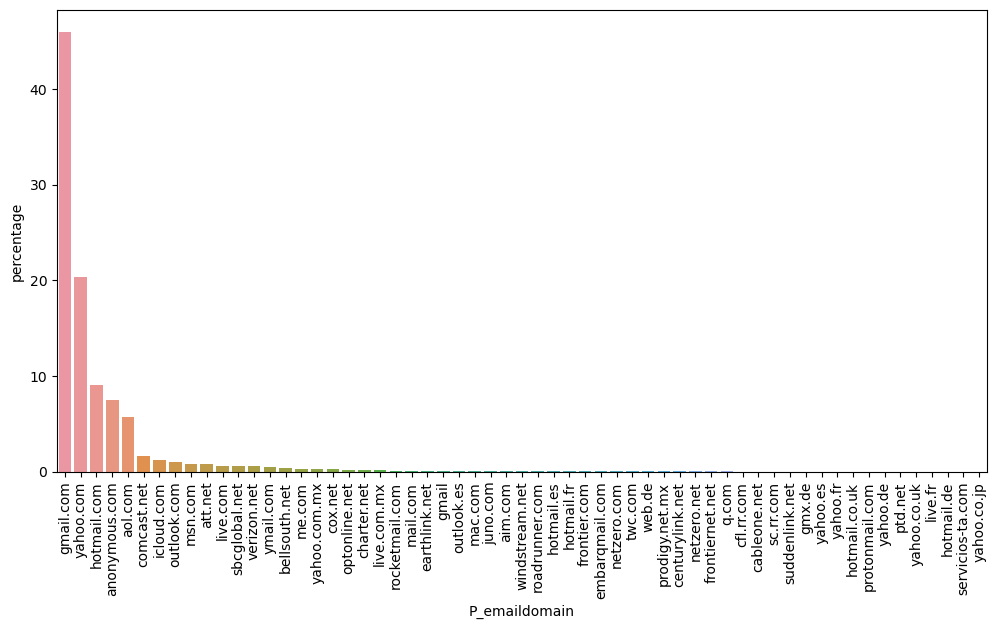

In [118]:
plt.figure(figsize=(12,6))
sns.barplot(x=train_count.index, y=train_count.values*100)
plt.ylabel("percentage")
plt.xticks(rotation=90)
plt.show()

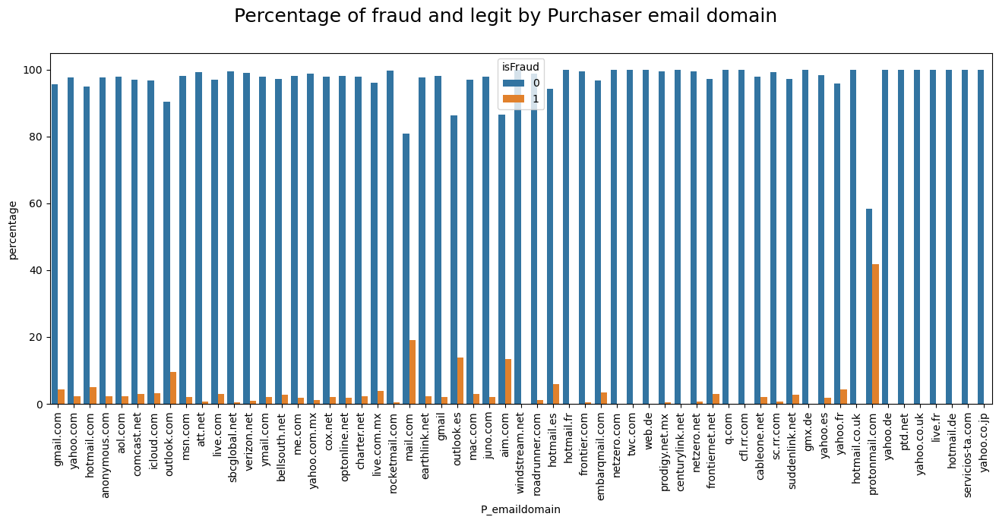

In [119]:
plt.figure(figsize=(16,6))
train_P_email = (train.groupby(['P_emaildomain'])['isFraud'].value_counts(normalize=True).rename('percentage').mul(100).reset_index())
sns.barplot(x="P_emaildomain", y="percentage", hue="isFraud", data=train_P_email, order=train_count.index)
plt.xticks(rotation=90)
plt.suptitle('Percentage of fraud and legit by Purchaser email domain', fontsize=18)
plt.show()

- Nhóm các email domain

In [120]:
train.loc[train['P_emaildomain'].isin(['gmail.com', 'gmail']),'P_emaildomain'] = 'Google'
train.loc[train['P_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                         'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                         'yahoo.es']), 'P_emaildomain'] = 'Yahoo'
train.loc[train['P_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                         'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                         'outlook.es', 'live.com', 'live.fr',
                                         'hotmail.fr']), 'P_emaildomain'] = 'Microsoft'
train.loc[train.P_emaildomain.isin(train.P_emaildomain.value_counts()[train.P_emaildomain.value_counts() <= 0.001*total ].index), 'P_emaildomain'] = "Others"
train.P_emaildomain.fillna("NoInf", inplace=True)

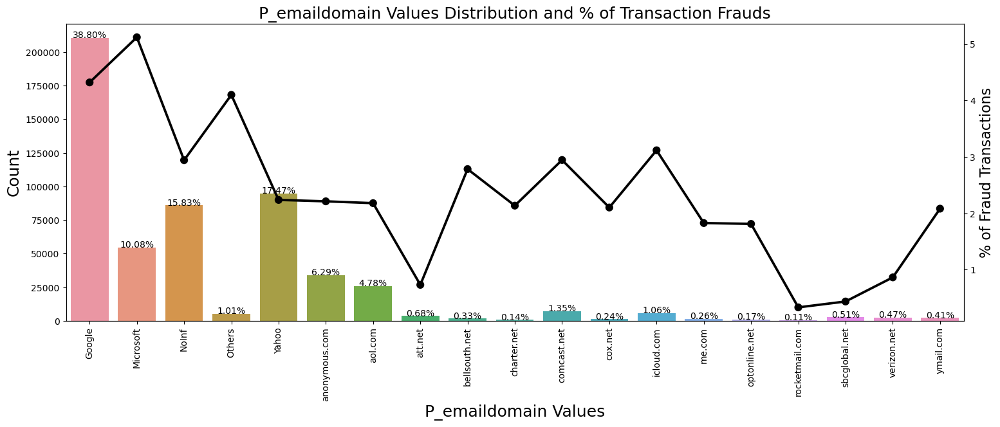

In [121]:
tmp = pd.crosstab(train['P_emaildomain'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
plt.figure(figsize=(18,6))
g2 = sns.countplot(x='P_emaildomain', data=train, order=list(tmp.P_emaildomain.values))
g22 = g2.twinx()
gg2 = sns.pointplot(x='P_emaildomain', y='Fraud', data=tmp,
                    color='black', order=list(tmp.P_emaildomain.values))
gg2.set_ylabel("% of Fraud Transactions", fontsize=16)
g2.set_title("P_emaildomain Values Distribution and % of Transaction Frauds", fontsize=18)
g2.set_xlabel("P_emaildomain Values", fontsize=18)
g2.set_ylabel("Count", fontsize=18)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 25,
            '{:1.2f}%'.format(height/total*100),
            ha="center")
g2.set_xticklabels(g2.get_xticklabels(), rotation=90)
plt.show()

- 38.75% domain là của Google, xác suất Fraud cũng có sự thay đổi giữa các domain

### R_emaildomain

In [122]:
train['R_emaildomain'].isnull().sum()/len(train)

0.7665763574035165

In [123]:
len(train[train['R_emaildomain'].isnull() & train['isFraud']==1])/ train['R_emaildomain'].isnull().sum()

0.02079681868780489

- Có đến 76.75% là missing data, trong đó 2.08% là Fraud

In [124]:
train_count = train['R_emaildomain'].value_counts(normalize=True)
len(train_count)

60

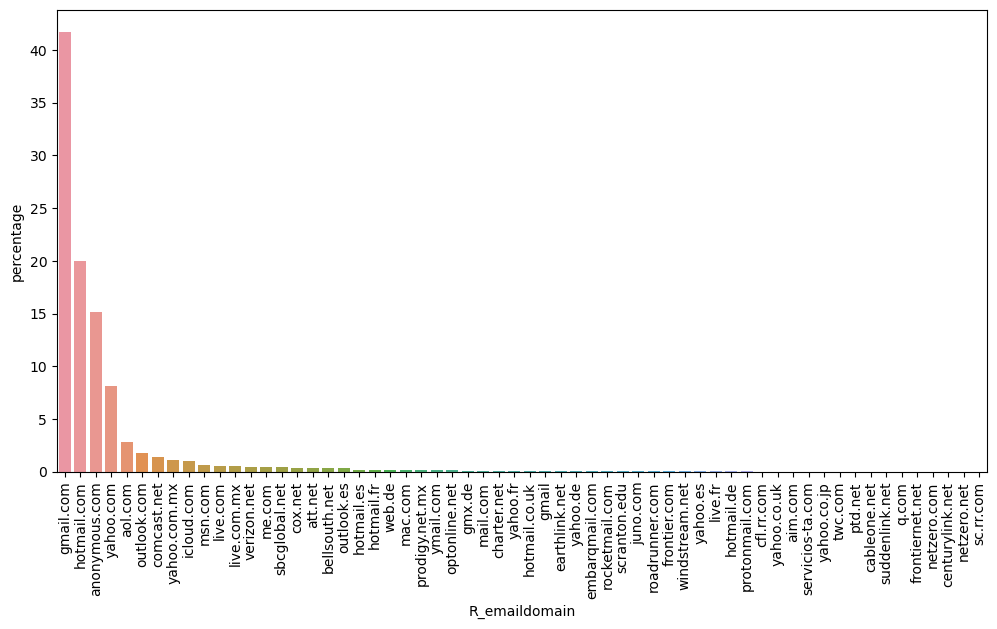

In [125]:
plt.figure(figsize=(12,6))
sns.barplot(x=train_count.index, y=train_count.values*100)
plt.ylabel("percentage")
plt.xticks(rotation=90)
plt.show()

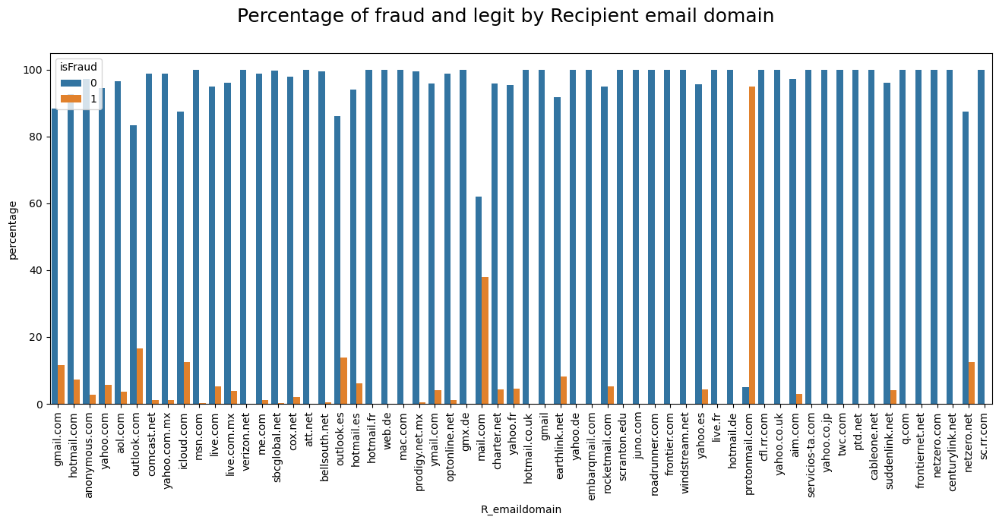

In [126]:
plt.figure(figsize=(16,6))
train_P_email = (train.groupby(['R_emaildomain'])['isFraud'].value_counts(normalize=True).rename('percentage').mul(100).reset_index())
sns.barplot(x="R_emaildomain", y="percentage", hue="isFraud", data=train_P_email, order=train_count.index)
plt.xticks(rotation=90)
plt.suptitle('Percentage of fraud and legit by Recipient email domain', fontsize=18)
plt.show()

* Nhóm các email domain

In [127]:
train.loc[train['R_emaildomain'].isin(['gmail.com', 'gmail']),'R_emaildomain'] = 'Google'

train.loc[train['R_emaildomain'].isin(['yahoo.com', 'yahoo.com.mx',  'yahoo.co.uk',
                                             'yahoo.co.jp', 'yahoo.de', 'yahoo.fr',
                                             'yahoo.es']), 'R_emaildomain'] = 'Yahoo'
train.loc[train['R_emaildomain'].isin(['hotmail.com','outlook.com','msn.com', 'live.com.mx',
                                             'hotmail.es','hotmail.co.uk', 'hotmail.de',
                                             'outlook.es', 'live.com', 'live.fr',
                                             'hotmail.fr']), 'R_emaildomain'] = 'Microsoft'
train.loc[train.R_emaildomain.isin(train.R_emaildomain.value_counts()[train.R_emaildomain.value_counts() <= 0.001*total ].index), 'R_emaildomain'] = "Others"
train.R_emaildomain.fillna("NoInf", inplace=True)

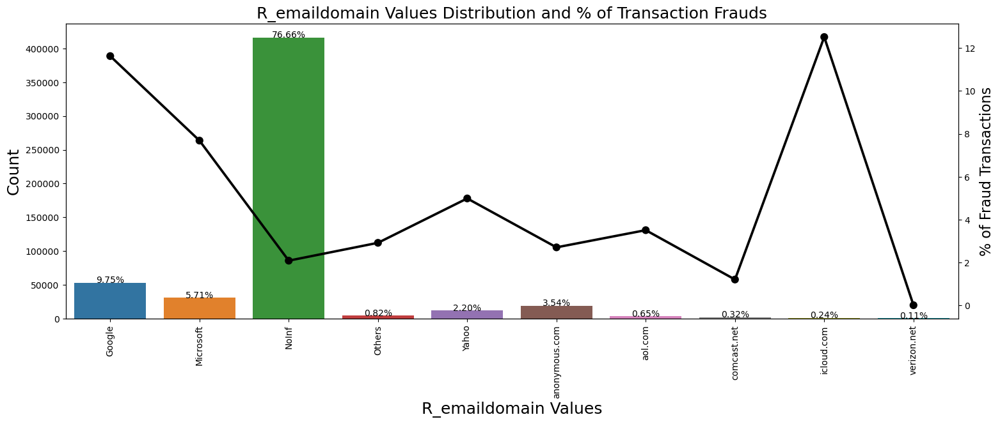

In [128]:
tmp = pd.crosstab(train['R_emaildomain'], train['isFraud'], normalize='index') * 100
tmp = tmp.reset_index()
tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)
plt.figure(figsize=(18,6))
g2 = sns.countplot(x='R_emaildomain', data=train, order=list(tmp.R_emaildomain.values))
g22 = g2.twinx()
gg2 = sns.pointplot(x='R_emaildomain', y='Fraud', data=tmp,
                    color='black', order=list(tmp.R_emaildomain.values))
gg2.set_ylabel("% of Fraud Transactions", fontsize=16)
g2.set_title("R_emaildomain Values Distribution and % of Transaction Frauds", fontsize=18)
g2.set_xlabel("R_emaildomain Values", fontsize=18)
g2.set_ylabel("Count", fontsize=18)
for p in g2.patches:
    height = p.get_height()
    g2.text(p.get_x()+p.get_width()/2.,
            height + 25,
            '{:1.2f}%'.format(height/total*100),
            ha="center")
g2.set_xticklabels(g2.get_xticklabels(), rotation=90)
plt.show()

- Có những domain có tỷ lệ Fraud cao bất thường (Google,Microsoft, icloud.com)

## Identity
Thông tin định danh - các thông tin về kết nối mạng như (IP, ISP, Proxy, etc) và các thông tin kỹ thuật (UA, Browser, OS, Version, etc) liên quan tới giao dịch

### Mô tả dữ liệu

In [129]:
id_col = ['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_07', 'id_08', 'id_09', 'id_10', 'id_11',
       'id_12', 'id_13', 'id_14', 'id_15', 'id_16', 'id_17', 'id_18',
       'id_19', 'id_20', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25',
       'id_26', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_32',
       'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38',
       'DeviceType', 'DeviceInfo']
id_col

['id_01',
 'id_02',
 'id_03',
 'id_04',
 'id_05',
 'id_06',
 'id_07',
 'id_08',
 'id_09',
 'id_10',
 'id_11',
 'id_12',
 'id_13',
 'id_14',
 'id_15',
 'id_16',
 'id_17',
 'id_18',
 'id_19',
 'id_20',
 'id_21',
 'id_22',
 'id_23',
 'id_24',
 'id_25',
 'id_26',
 'id_27',
 'id_28',
 'id_29',
 'id_30',
 'id_31',
 'id_32',
 'id_33',
 'id_34',
 'id_35',
 'id_36',
 'id_37',
 'id_38',
 'DeviceType',
 'DeviceInfo']

In [130]:
train[id_col].describe(include = 'all')

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
count,133487.000000,130378.000000,60564.000000,60564.000000,126820.000000,126820.000000,4804.000000,4804.000000,68750.000000,68750.000000,130491.000000,133487,117298.000000,75190.000000,130491,119837,129202.000000,41760.000000,129161.000000,129117.000000,4807.000000,4817.000000,4817,4431.000000,4787.000000,4811.000000,4817,130491,130491,72905,130090,72926.000000,68629,73029,130491,130491,130491,130491,130328,110127
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,2,2,2,75,124,NaN,244,4,2,2,2,2,2,1729
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NotFound,NaN,NaN,Found,Found,NaN,NaN,NaN,NaN,NaN,NaN,IP_PROXY:TRANSPARENT,NaN,NaN,NaN,Found,Found,Found,Windows 10,chrome 63.0,NaN,1920x1080,match_status:2,T,F,T,F,desktop,Windows
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114741,NaN,NaN,61940,60564,NaN,NaN,NaN,NaN,NaN,NaN,3227,NaN,NaN,NaN,4804,70028,68750,19301,21841,NaN,15998,55672,73002,123938,101984,66918,79261,44032
mean,-10.013829,173616.910905,0.062067,-0.058863,1.656568,-6.643235,13.441091,-38.471690,0.095069,-0.308611,99.738007,NaN,48.583761,-345.323181,NaN,NaN,188.943832,14.205388,352.077338,402.437100,369.618473,15.977579,NaN,12.752652,329.579486,148.728747,NaN,NaN,NaN,NaN,NaN,26.554480,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,14.166014,157565.838204,0.603170,0.696705,5.290388,16.415353,11.359167,25.921072,0.990542,2.824086,1.143136,NaN,11.368920,93.902910,NaN,NaN,30.270963,1.510703,140.369171,152.009432,199.520870,6.860674,NaN,2.252208,97.843057,32.261745,NaN,NaN,NaN,NaN,NaN,3.756195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,-100.000000,1.000000,-13.000000,-28.000000,-72.000000,-100.000000,-46.000000,-100.000000,-36.000000,-100.000000,90.000000,NaN,10.000000,-660.000000,NaN,NaN,100.000000,10.000000,100.000000,100.000000,100.000000,10.000000,NaN,11.000000,100.000000,100.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,-10.000000,68719.500000,0.000000,0.000000,0.000000,-6.000000,5.000000,-48.000000,0.000000,0.000000,100.000000,NaN,49.000000,-360.000000,NaN,NaN,166.000000,13.000000,266.000000,256.000000,252.000000,14.000000,NaN,11.000000,321.000000,119.000000,NaN,NaN,NaN,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,-5.000000,125174.000000,0.000000,0.000000,0.000000,0.000000,14.000000,-34.000000,0.000000,0.000000,100.000000,NaN,52.000000,-300.000000,NaN,NaN,166.000000,15.000000,341.000000,469.000000,252.000000,14.000000,NaN,11.000000,321.000000,147.000000,NaN,NaN,NaN,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,-5.000000,225834.000000,0.000000,0.000000,1.000000,0.000000,22.000000,-23.000000,0.000000,0.000000,100.000000,NaN,52.000000,-300.000000,NaN,NaN,225.000000,15.000000,427.000000,533.000000,497.500000,14.000000,NaN,15.000000,371.000000,169.000000,NaN,NaN,NaN,NaN,NaN,32.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Dữ liệu dạng liên tục: id_01 -> id_11

Dữ liệu dạng rời rạc: id_12 -> id_38 và DeviceType + DeviceInfo

In [131]:
detectmissing(train[id_col])

,Name,dtypes,Missing(%),Uniques
0,id_01,float64,75.397729,76
1,id_02,float64,75.970732,108613
2,id_03,float64,88.837775,24
3,id_04,float64,88.837775,15
4,id_05,float64,76.626488,93
5,id_06,float64,76.626488,100
6,id_07,float64,99.114601,84
7,id_08,float64,99.114601,94
8,id_09,float64,87.329057,45
9,id_10,float64,87.329057,62


Dữ liệu bị missing rất nhiều, tất cả các cột đều missing > 70%

Nhưng vì có những thông tin quan trọng muốn giữ lại nên sẽ chỉ drop bớt đi những cột có số lượng dữ liệu bị thiếu quá lớn ở khoảng > 90% vì qua khoảng này cột không còn mang nhiều ý nghĩa và biểu thị được dữ liệu hoặc những cột có số lượng giá trị bị trùng lặp lớn hơn 90%

### Drop missing data

In [132]:
def get_too_many_null_attr(data):
    many_null_cols = [col for col in data.columns if data[col].isnull().sum() / data.shape[0] > 0.9]
    return many_null_cols
def get_too_many_repeated_val(data):
    big_top_value_cols = [col for col in data.columns if data[col].value_counts(dropna=False, normalize=True).values[0] > 0.9]
    return big_top_value_cols
def get_useless_columns(data):
    too_many_null = get_too_many_null_attr(data)
    print("More than 90% null: " + str(len(too_many_null)))
    too_many_repeated = get_too_many_repeated_val(data)
    print("More than 90% repeated value: " + str(len(too_many_repeated)))
    cols_to_drop = list(set(too_many_null + too_many_repeated))
    return cols_to_drop

cols_to_drop = get_useless_columns(train[id_col])
print(cols_to_drop)

More than 90% null: 10
More than 90% repeated value: 10
['id_24', 'id_22', 'id_23', 'id_26', 'id_18', 'id_07', 'id_08', 'id_27', 'id_25', 'id_21']


Chúng ta sẽ tiến hành drop những cột này vì nó không mang nhiều thông tin cho bài toán


In [133]:
train.drop(cols_to_drop, axis = 1, inplace=True)

### Dữ liệu liên tục: id_01 -> id_11


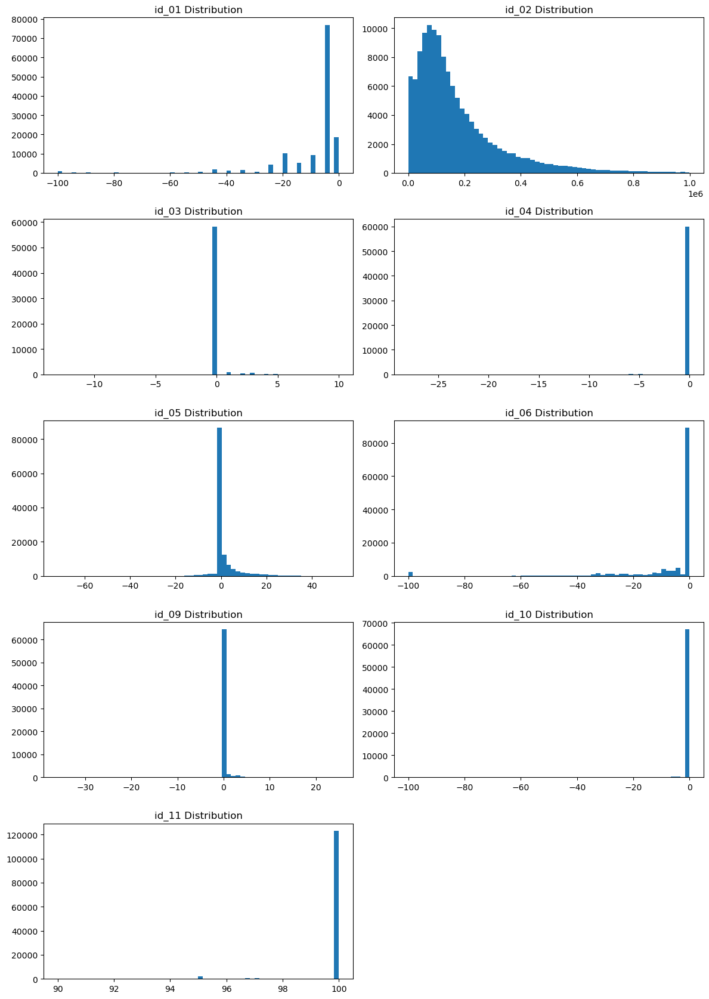

In [135]:
cols = ['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_09', 'id_10', 'id_11']

fig = plt.figure(figsize=(12, 20))

for i, var_name in enumerate(cols):
    ax=fig.add_subplot(6, 2, i + 1)
    plt.hist(train[var_name], bins = 60)
    ax.set_title(var_name +" Distribution")
fig.tight_layout()
plt.show()

In [137]:
def plotHistByFraud(col, bins=20, figsize=(8,3)):
    train_id_f0 = train[train['isFraud'] == 0]
    train_id_f1 = train[train['isFraud'] == 1]
    with np.errstate(invalid='ignore'):
        plt.figure(figsize=figsize)
        plt.hist([train_id_f0[col], train_id_f1[col]], bins=bins, density=False, color=['royalblue', 'orange'])
        plt.xlabel(col)
def plotCategoryRateBar(col, topN=np.nan, figsize=(8,3)):
    train_id_f0 = train[train['isFraud'] == 0]
    train_id_f1 = train[train['isFraud'] == 1]
    a, b = train_id_f0, train_id_f1
    if topN == topN: # isNotNan
        vals = b[col].value_counts(normalize=True).to_frame().iloc[:topN,0]
        subA = a.loc[a[col].isin(vals.index.values), col]
        df = pd.DataFrame({'normal':subA.value_counts(normalize=True), 'fraud':vals})
    else:
        df = pd.DataFrame({'normal':a[col].value_counts(normalize=True), 'fraud':b[col].value_counts(normalize=True)})
    df.sort_values('fraud', ascending=False).plot.bar(figsize=figsize)

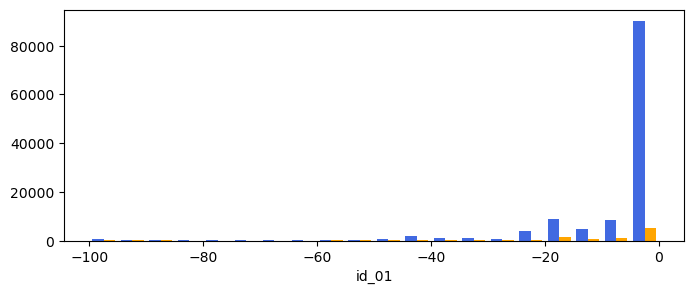

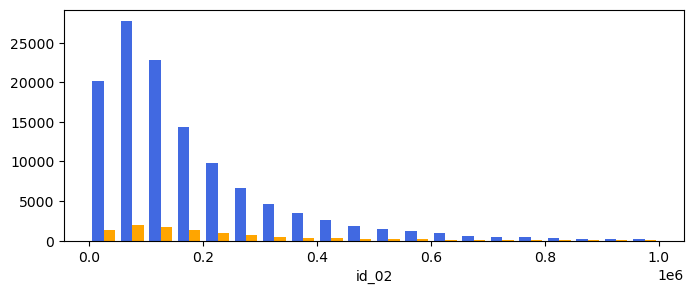

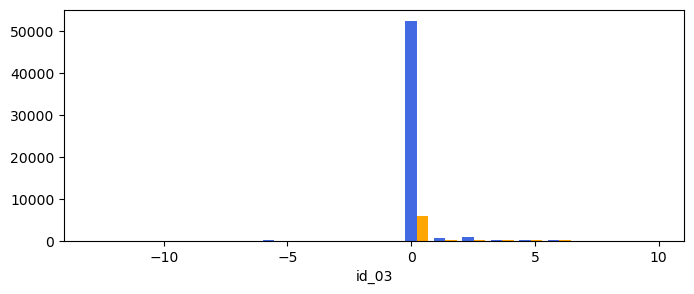

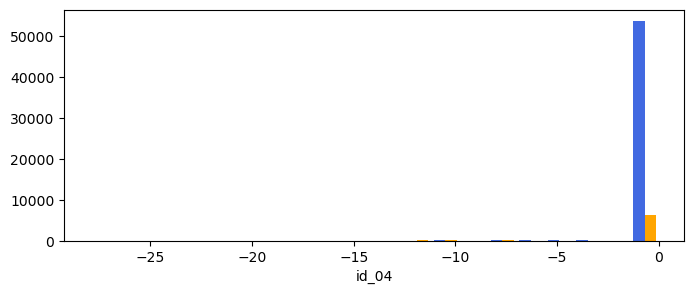

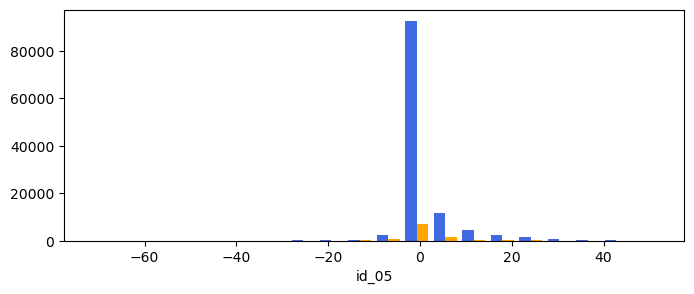

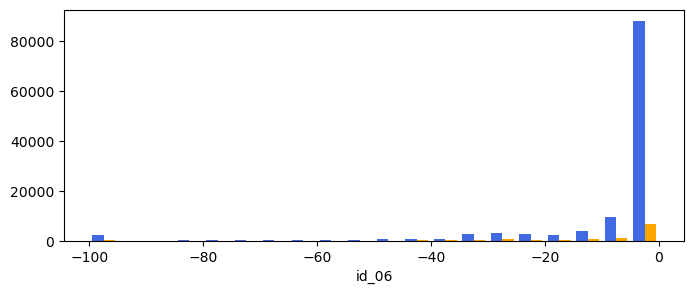

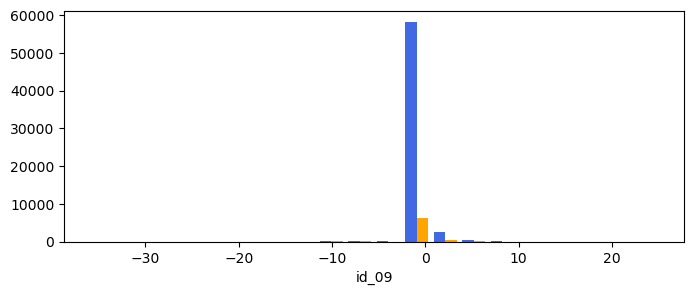

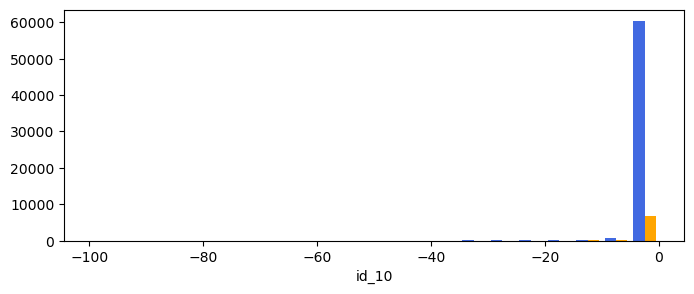

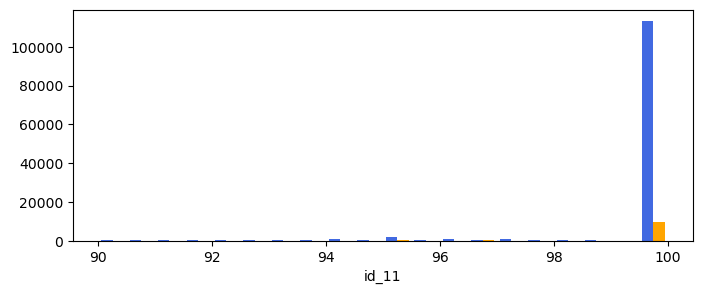

In [139]:
cols = ['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_09', 'id_10', 'id_11']

for i, var_name in enumerate(cols):
    plotHistByFraud(var_name)

Phân bố của dữ liệu thường tập trung vào 1 điểm

Nhưng vì lượng missing lớn nên không thể tập trung để fill các hàng missing bằng dữ liệu tập trung nhiều đó vì sẽ gây mất cân bằng và thông tin sẽ không có ý nghĩa

Thay vào đó sử dụng 1 giá trị mới khác hoàn toàn so với các giá trị có trong cột để coi việc missing đó là 1 feature cho mô hình học

In [141]:
id_num_cols = ['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_09', 'id_10', 'id_11']

for col in id_num_cols: train[col].fillna(train[col].min() - 10, inplace=True)

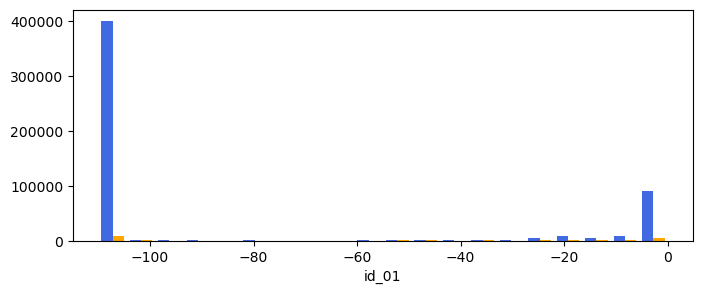

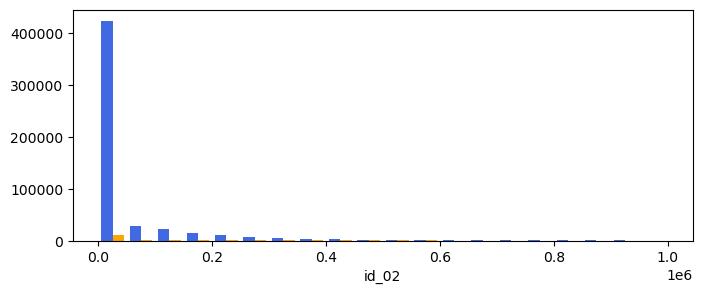

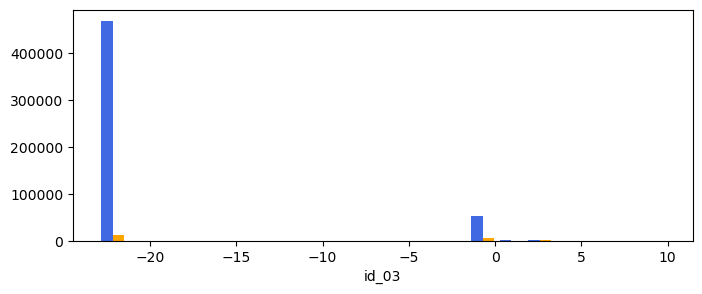

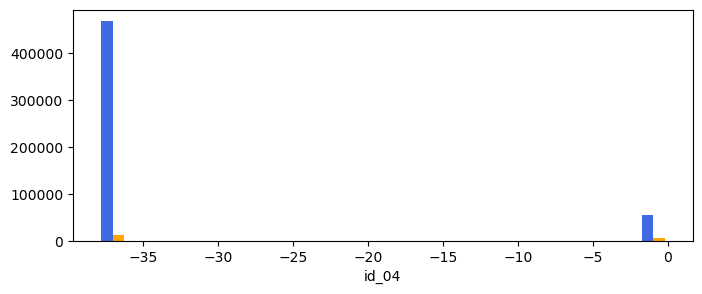

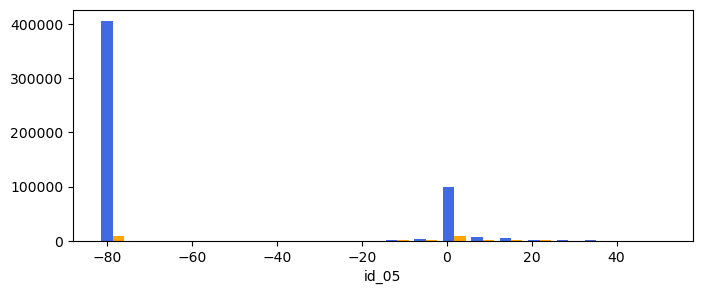

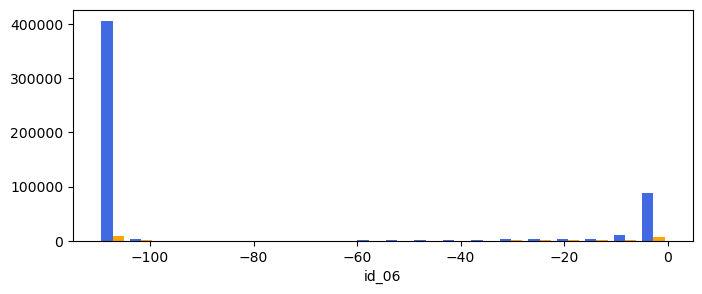

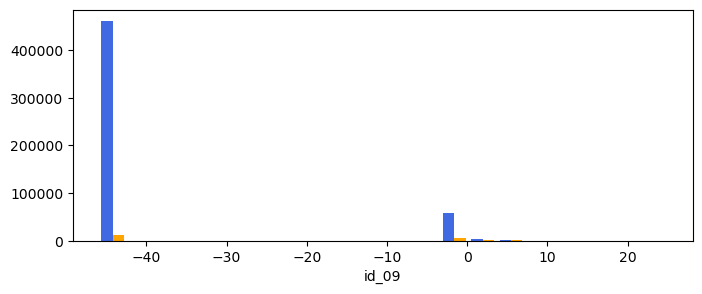

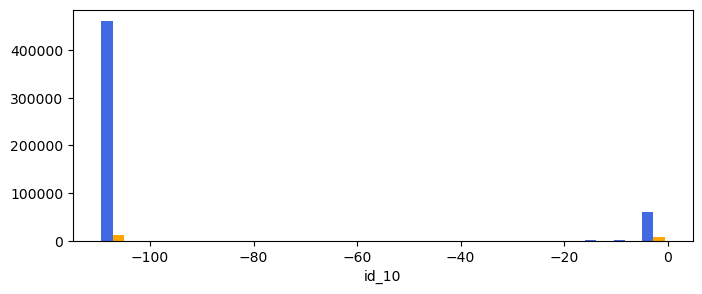

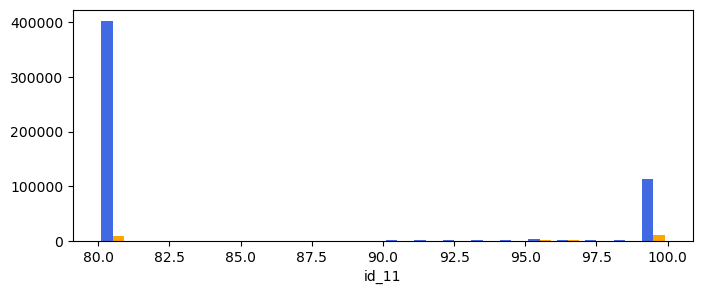

In [142]:
cols = ['id_01', 'id_02', 'id_03', 'id_04', 'id_05', 'id_06', 'id_09', 'id_10', 'id_11']

for i, var_name in enumerate(cols):
    plotHistByFraud(var_name)

### Dữ liệu rời rạc id_12 -> id_38, DeviceType, DeviceInfo

#### Các cột dữ liệu được xử lý chung


In [143]:
cat_col = []
for col in id_col:
  if col not in cols and col not in cols_to_drop:
    cat_col.append(col)
detectmissing(train[cat_col]  )

,Name,dtypes,Missing(%),Uniques
0,id_12,object,75.397729,2
1,id_13,float64,78.381437,52
2,id_14,float64,86.142136,25
3,id_15,object,75.949906,3
4,id_16,object,77.913487,2
5,id_17,float64,76.187475,104
6,id_19,float64,76.195031,520
7,id_20,float64,76.203141,388
8,id_28,object,75.949906,2
9,id_29,object,75.949906,2


Visualize những cột có unique value nhỏ và số lượng bị missing ít

In [144]:
import seaborn as sns
def cat_feat_ploting(df, col):
    tmp = pd.crosstab(df[col], df['isFraud'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoFraud', 1:'Fraud'}, inplace=True)

    plt.figure(figsize=(14,10))
    plt.suptitle(f'{col} Distributions', fontsize=22)

    plt.subplot(221)
    g = sns.countplot(x=col, data=df, order=tmp[col].values)
    # plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])

    g.set_title(f"{col} Distribution", fontsize=19)
    plt.xticks(rotation=90)
    g.set_xlabel(f"{col} Name", fontsize=17)
    g.set_ylabel("Count", fontsize=17)
    # g.set_ylim(0,500000)
    for p in g.patches:
        height = p.get_height()
        g.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/len(train)*100),
                ha="center", fontsize=14)

    plt.subplot(222)
    g1 = sns.countplot(x=col, hue='isFraud', data=df, order=tmp[col].values)
    plt.legend(title='Fraud', loc='best', labels=['No', 'Yes'])
    gt = g1.twinx()
    gt = sns.pointplot(x=col, y='Fraud', data=tmp, color='black', order=tmp[col].values)
    gt.set_ylabel("% of Fraud Transactions", fontsize=16)

    g1.set_title(f"{col} by Target(isFraud)", fontsize=19)
    g1.set_xlabel(f"{col} Name", fontsize=17)
    g1.set_ylabel("Count", fontsize=17)
    g1.set_xticklabels(df[col].unique(), rotation=90)

    plt.subplots_adjust(hspace = 0.4, top = 0.85)

    plt.show()


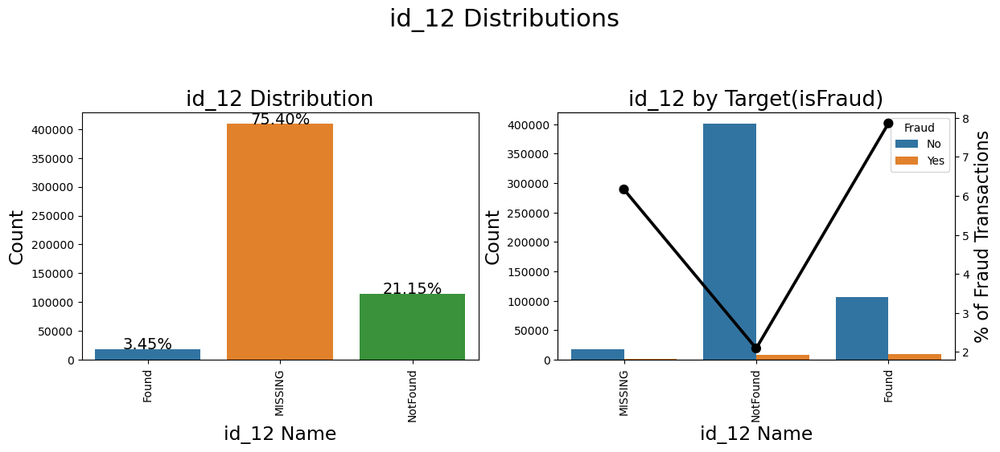

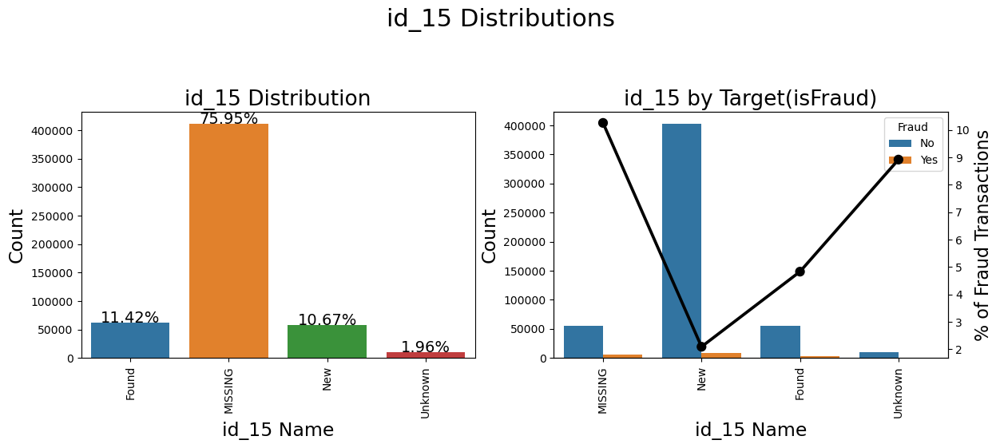

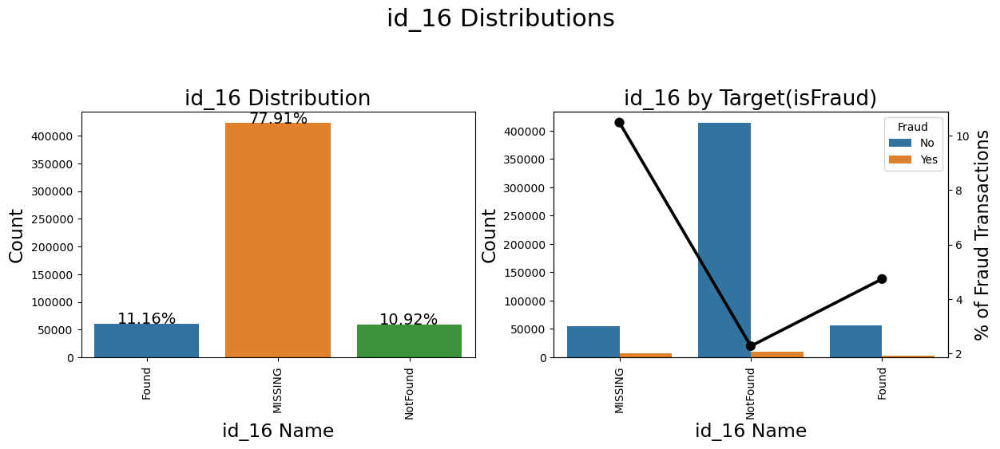

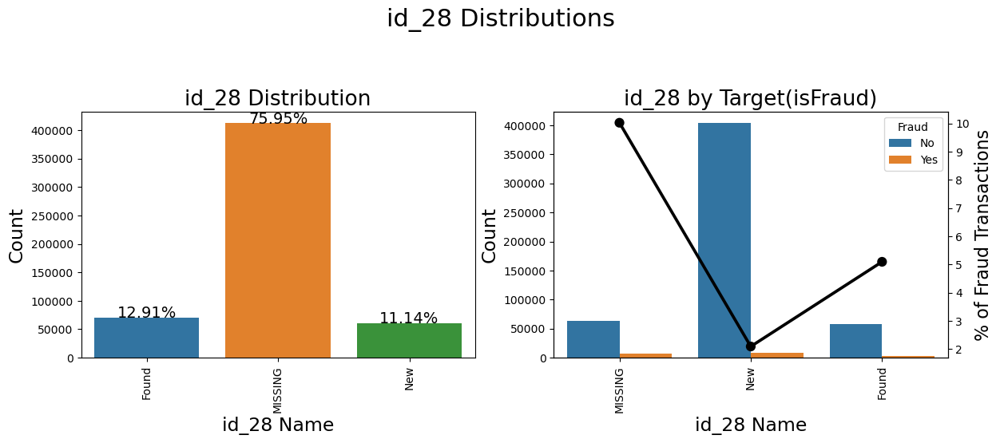

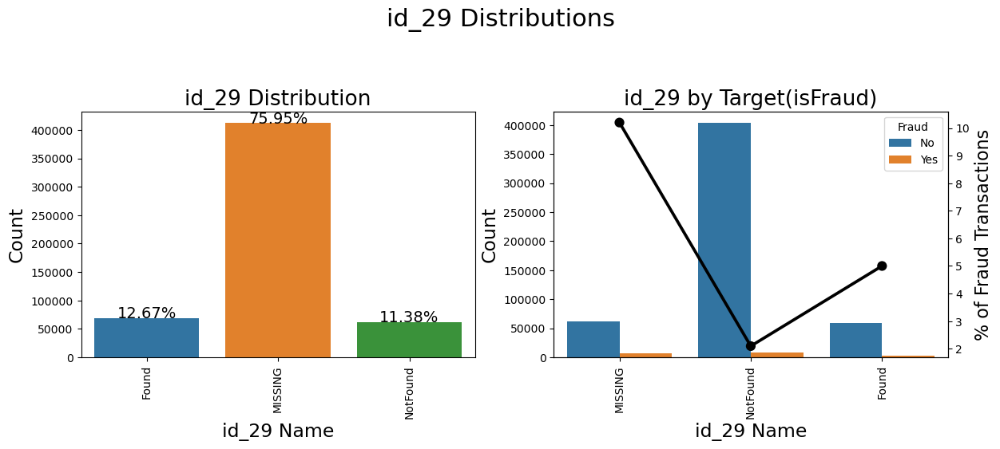

...

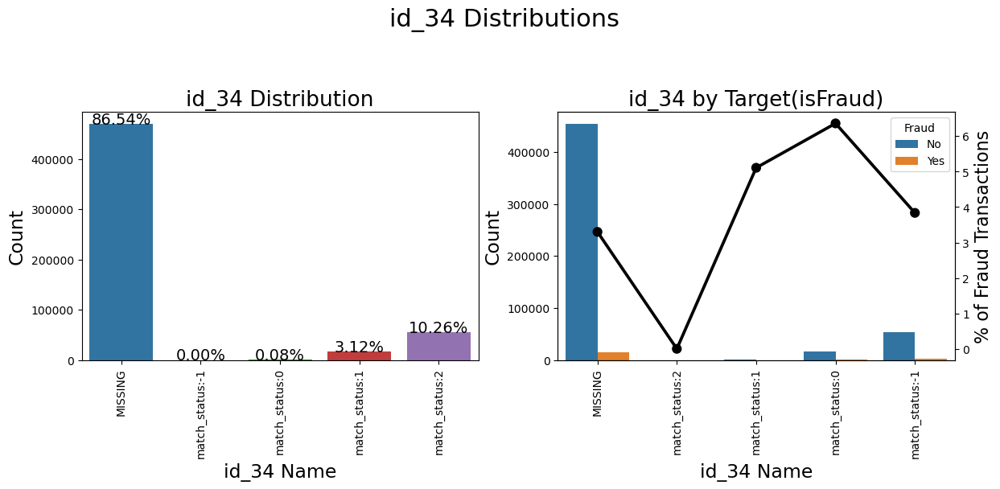

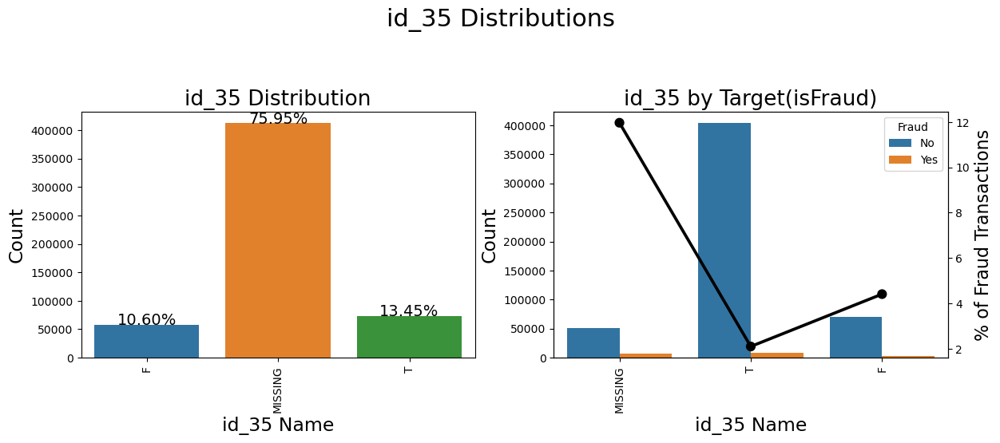

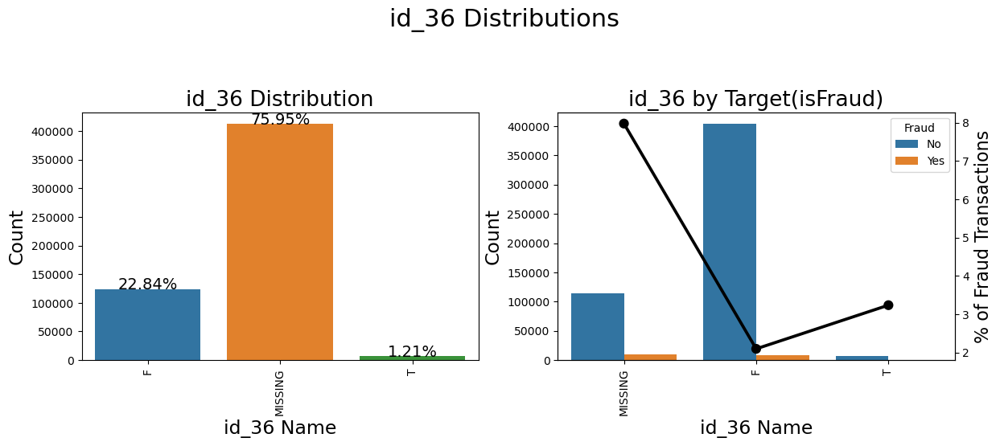

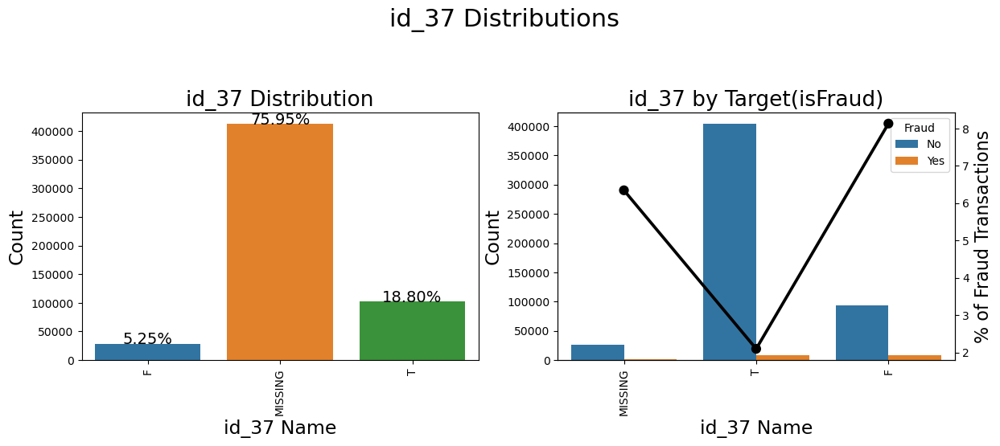

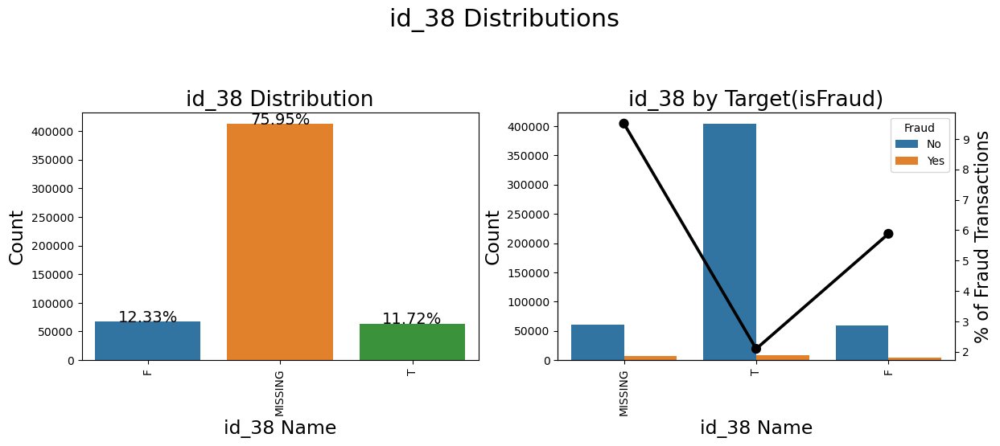

In [145]:
cols = ['id_12', 'id_15', 'id_16', 'id_28', 'id_29', 'id_32', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38']
for col in cols:
    train[col] = train[col].fillna('MISSING')
    cat_feat_ploting(train, col)

Những cột này có giá trị unique nhỏ (Nhỏ hơn 5) và % của các giao dịch fraud của từng giá trị trong 1 cột cũng có chênh lệch khá lớn khi có thêm cột giá trị Null.

Vì vậy tạo giá trị mới cho giá trị bị missing là MISSING để dữ liệu coi phần bị missing là 1 feature mới

#### Các cột dữ liệu được xử lý riêng

In [146]:
cols = ['id_13', 'id_14', 'id_17', 'id_19', 'id_20','id_30', 'id_31', 'id_33', 'DeviceType', 'DeviceInfo']
detectmissing(train[cols])

,Name,dtypes,Missing(%),Uniques
0,id_13,float64,78.381437,52
1,id_14,float64,86.142136,25
2,id_17,float64,76.187475,104
3,id_19,float64,76.195031,520
4,id_20,float64,76.203141,388
5,id_30,object,86.563272,75
6,id_31,object,76.023812,124
7,id_33,object,87.351358,244
8,DeviceType,object,75.979948,2
9,DeviceInfo,object,79.703085,1729


#### id_13

Điền giá trị lớn nhất +2 với giá trị bị missing và gộp những giá trị có số lượng < 200 thành 1 giá trị min - 2

Unique count: id_13
66.0    425282
52.0     53654
49.0     26188
64.0     13577
33.0     10048
20.0      2647
14.0      2318
63.0      1411
19.0      1146
25.0      1000
43.0       789
62.0       770
8.0        705
18.0       655
41.0       601
55.0       490
11.0       358
15.0       354
24.0       301
35.0       286
Name: count, dtype: int64


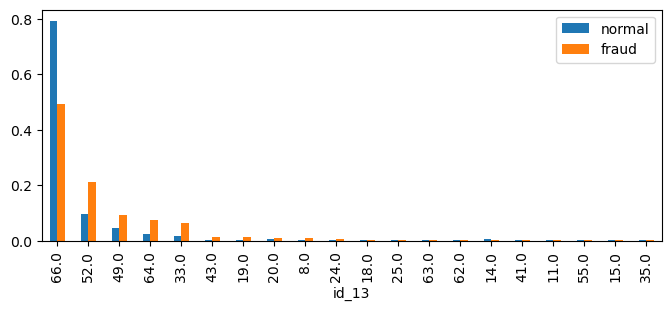

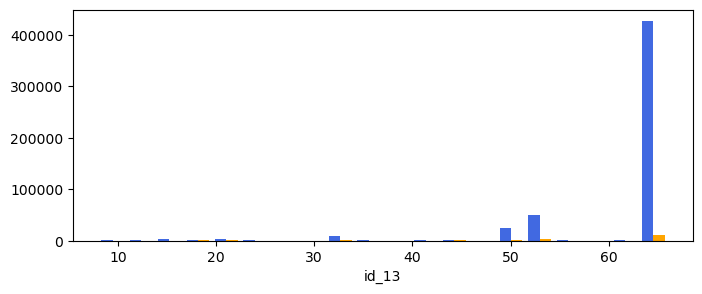

In [147]:
train['id_13'] = train['id_13'].replace(np.nan, train['id_13'].max()+2)
train.loc[train.id_13.isin(train.id_13.value_counts()[train.id_13.value_counts() < 200].index), 'id_13'] = train['id_13'].min()-2
plotCategoryRateBar('id_13', 20)
plotHistByFraud('id_13')
print('Unique count:', train['id_13'].value_counts(dropna=False))

#### id_14

Điền giá trị lớn nhất +2 với giá trị bị missing và gộp những giá trị có số lượng < 200 thành 1 giá trị min - 2

Unique count: id_14
 722.0    467390
-300.0     41011
-360.0     15891
-480.0     12269
-420.0      4322
-662.0       893
-600.0       478
 60.0        326
Name: count, dtype: int64


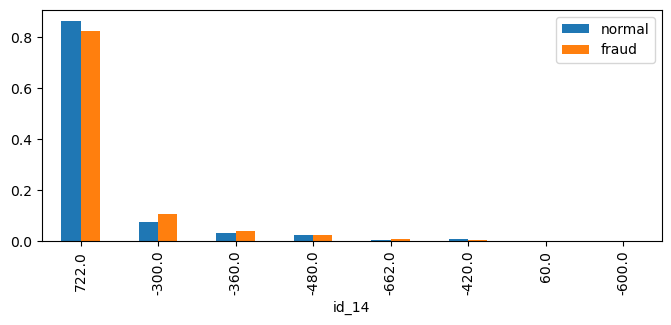

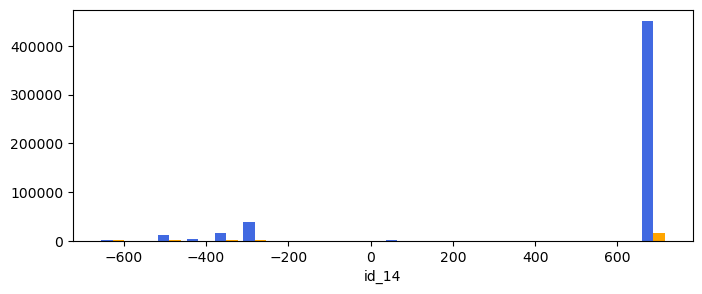

In [148]:
train['id_14'] = train['id_14'].replace(np.nan, train['id_14'].max()+2)
train.loc[train.id_14.isin(train.id_14.value_counts()[train.id_14.value_counts() < 200].index), 'id_14'] = train['id_14'].min()-2
plotCategoryRateBar('id_14', 20)
plotHistByFraud('id_14')
print('Unique count:', train['id_14'].value_counts(dropna=False))

#### id_17

Unique count: id_17
231.0    413378
166.0     74024
225.0     51715
98.0       1691
102.0       642
159.0       325
100.0       323
121.0       262
148.0       220
Name: count, dtype: int64


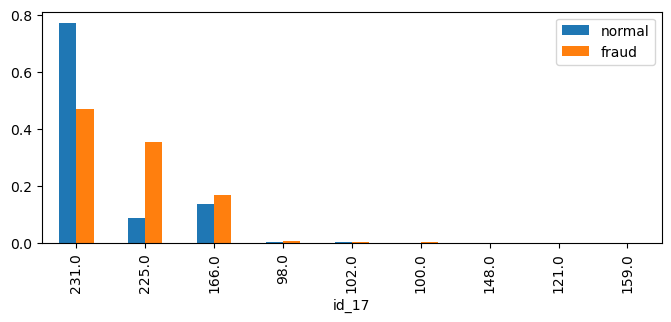

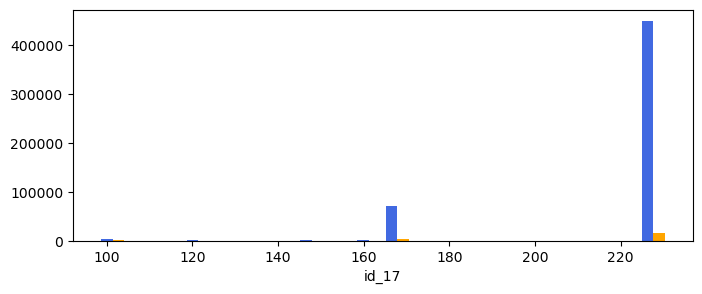

In [149]:
train['id_17'] = train['id_17'].replace(np.nan, train['id_17'].max()+2)
train.loc[train.id_17.isin(train.id_17.value_counts()[train.id_17.value_counts() < 200].index), 'id_17'] = train['id_17'].min()-2
plotCategoryRateBar('id_17', 20)
plotHistByFraud('id_17')
print('Unique count:', train['id_17'].value_counts(dropna=False))

#### id_19

Unique count: id_19
673.0    413419
266.0     17976
410.0     10643
98.0      10334
427.0      8097
529.0      7684
312.0      5963
100.0      5037
542.0      4914
215.0      4524
153.0      3912
352.0      3713
417.0      3654
176.0      3554
290.0      3305
193.0      2941
254.0      2630
548.0      2540
621.0      2060
633.0      1882
390.0      1812
317.0      1750
321.0      1615
122.0      1571
216.0      1517
492.0      1334
341.0      1214
567.0      1143
271.0      1143
384.0      1052
454.0       914
484.0       897
345.0       699
607.0       666
399.0       658
574.0       619
144.0       534
277.0       510
397.0       457
630.0       354
337.0       303
139.0       302
339.0       298
307.0       286
414.0       269
395.0       256
348.0       253
270.0       252
585.0       250
400.0       222
372.0       221
197.0       218
533.0       209
Name: count, dtype: int64


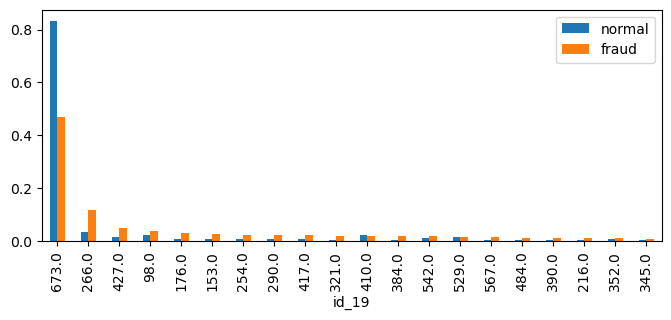

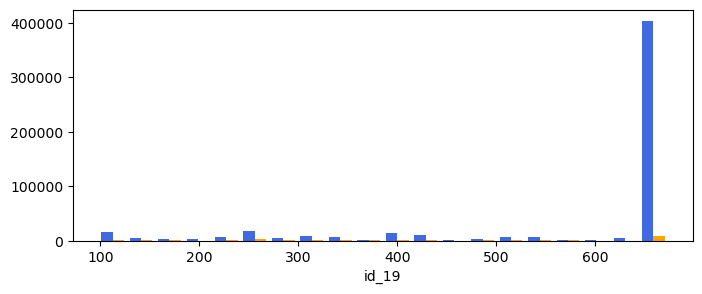

In [150]:
train['id_19'] = train['id_19'].replace(np.nan, train['id_19'].max()+2)
train.loc[train.id_19.isin(train.id_19.value_counts()[train.id_19.value_counts() < 200].index), 'id_19'] = train['id_19'].min()-2
plotCategoryRateBar('id_19', 20)
plotHistByFraud('id_19')
print('Unique count:', train['id_19'].value_counts(dropna=False))

#### id_20

Unique count: id_20
663.0    413463
507.0     20967
222.0     10514
325.0      7251
533.0      5525
214.0      5406
549.0      5346
600.0      5279
98.0       4409
563.0      4132
333.0      3521
595.0      2958
161.0      2945
500.0      2693
401.0      2517
489.0      2444
597.0      2419
305.0      2156
368.0      2124
256.0      2101
535.0      2028
127.0      1885
391.0      1740
277.0      1507
561.0      1472
280.0      1335
177.0      1327
315.0      1133
266.0      1121
225.0      1101
611.0      1088
484.0      1051
566.0      1044
612.0      1027
146.0      1025
417.0       925
521.0       859
472.0       831
278.0       791
107.0       786
469.0       717
144.0       652
299.0       630
100.0       593
394.0       545
178.0       533
122.0       467
216.0       433
638.0       433
565.0       390
186.0       383
153.0       376
139.0       365
181.0       335
360.0       320
340.0       310
314.0       281
324.0       280
411.0       265
272.0       257
253.0       239
610.

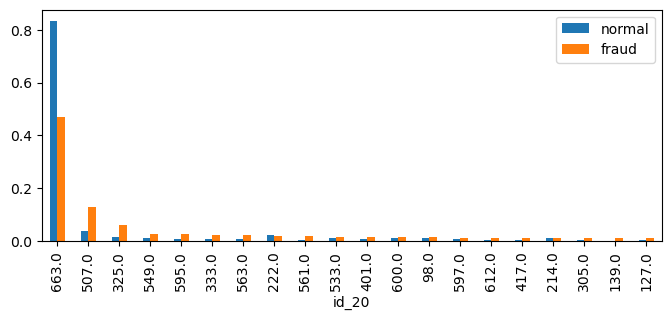

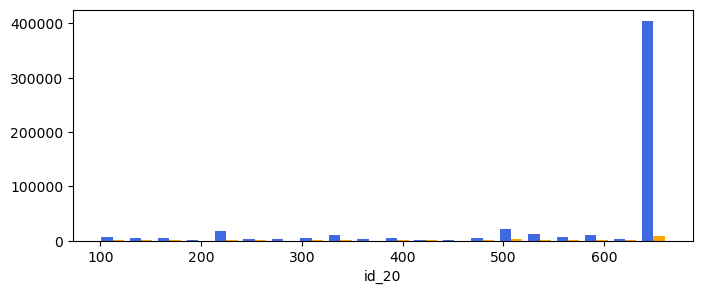

In [151]:
train['id_20'] = train['id_20'].replace(np.nan, train['id_20'].max()+2)
train.loc[train.id_20.isin(train.id_20.value_counts()[train.id_20.value_counts() < 200].index), 'id_20'] = train['id_20'].min()-2
plotCategoryRateBar('id_20', 20)
plotHistByFraud('id_20')
print('Unique count:', train['id_20'].value_counts(dropna=False))

#### id_30


ID30 là hệ điều hành, Ở đây hệ điều hành được sử dụng nhiều nhất là Win10, Win7, IOS

<Axes: xlabel='id_30'>

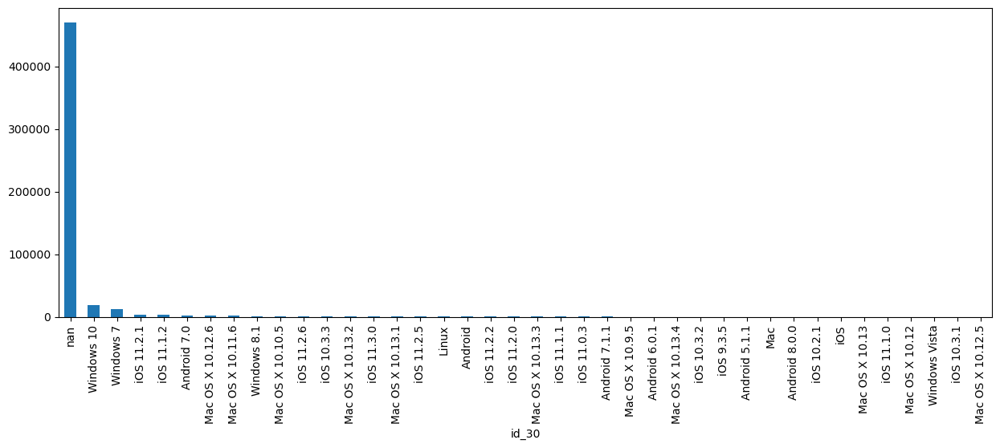

In [152]:
plt.figure(figsize = (15, 5))
train['id_30'] = train['id_30'].str.replace('_', '.')
train['id_30'].value_counts(dropna=False)[0:40].plot(kind='bar')

Chia dữ liệu về hệ điều hành thành 2 feature mới là Hệ điều hành và Phiên bản

Fill missing data bằng 1 nhãn mới là MISSING

In [153]:
train['OS_id_30'] = train['id_30'].str.split(' ', expand=True)[0]
train['version_id_30'] = train['id_30'].str.split(' ', expand=True)[1]
train['OS_id_30'].fillna('MISSING', inplace=True)
train['version_id_30'].fillna('MISSING', inplace=True)
train.drop('id_30', axis=1, inplace=True)

<Axes: xlabel='OS_id_30'>

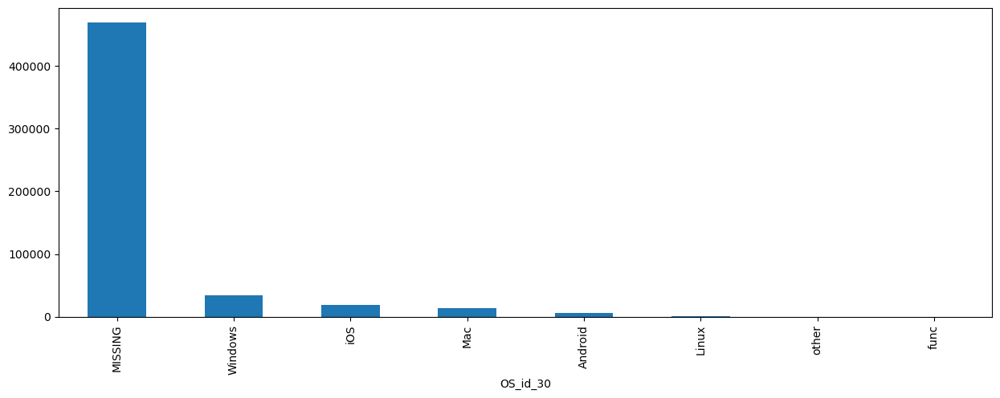

In [154]:
plt.figure(figsize = (15, 5))
train['OS_id_30'].value_counts(dropna=False)[0:40].plot(kind='bar')

<Axes: xlabel='version_id_30'>

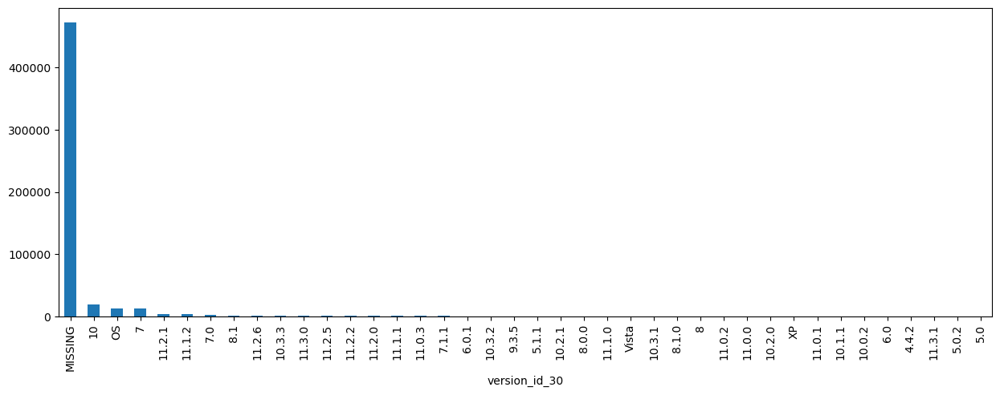

In [155]:
plt.figure(figsize = (15, 5))
train['version_id_30'].value_counts(dropna=False)[0:40].plot(kind='bar')

#### id_31

ID31 là trình duyệt thực hiện giao dịch, ở đây là chorme và safari được sử dụng nhiều nhất

<Axes: xlabel='id_31'>

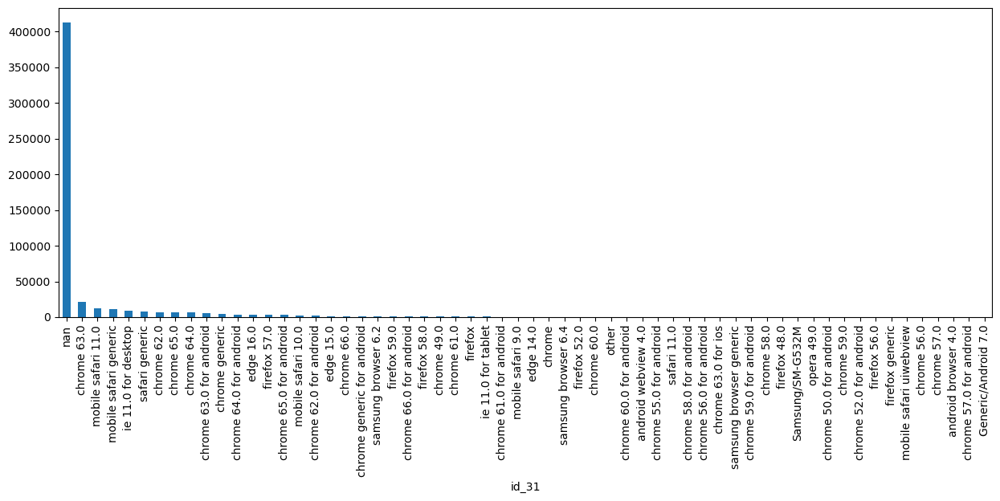

In [156]:
plt.figure(figsize = (15, 5))
train['id_31'].value_counts(dropna=False)[0:60].plot(kind='bar')

Biến đổi dữ liệu thành Trình duyệt với phiên bản của Desktop hay Mobile

In [157]:
train.loc[train['id_31'].str.contains('chrome.*android', na=False), 'id_31'] = 'Chorme Android'
train.loc[train['id_31'].str.contains('chrome.*ios', na=False), 'id_31'] = 'Chorme IOS'
train.loc[train['id_31'].str.contains('chrome', na=False), 'id_31'] = 'Chorme Desktop'
train.loc[train['id_31'].str.contains('mobile safari', na=False), 'id_31'] = 'Mobile Safari'
train.loc[train['id_31'].str.contains('safari', na=False), 'id_31'] = 'Safari Mac'
train.loc[train['id_31'].str.contains('samsung|Samsung', na=False), 'id_31'] = 'Samsung Browser'
train.loc[train['id_31'].str.contains('edge', 'Edge', na=False), 'id_31'] = 'Edge'
train.loc[train['id_31'].str.contains('firefox.*android', na=False), 'id_31'] = 'Firefox Android'
train.loc[train['id_31'].str.contains('firefox', na=False), 'id_31'] = 'Firefox Desktop'
train.loc[train['id_31'].str.contains('ie.*tablet', na=False), 'id_31'] = 'IE Mobile'
train.loc[train['id_31'].str.contains('ie', na=False), 'id_31'] = 'IE Desktop'
train.loc[train['id_31'].str.contains('android', na=False), 'id_31'] = 'Android'
train.loc[train['id_31'].str.contains('opera', na=False), 'id_31'] = 'Opera'
train.loc[train.id_31.isin(train.id_31.value_counts()[train.id_31.value_counts() < 200].index), 'id_31'] = "Others"

<Axes: xlabel='id_31'>

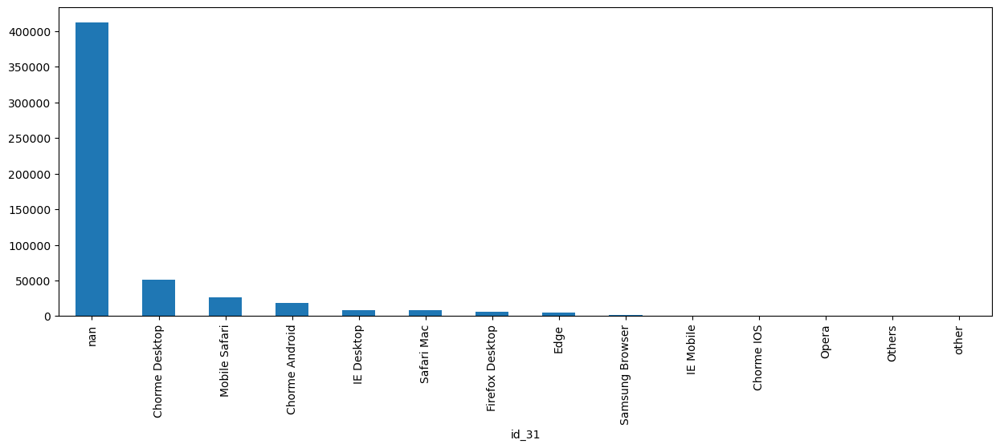

In [158]:
plt.figure(figsize = (15, 5))
train['id_31'].value_counts(dropna=False)[0:60].plot(kind='bar')

Fill missing data with giá trị MISSING

In [159]:
train['id_31'].fillna('MISSING', inplace=True)

#### id_33


id_33 là độ phân giải màn hình dùng dể giao dịch

Chia dữ liệu về hệ điều hành thành 2 feature mới là chiều dài và chiều rộng

Fill missing data bằng 1 nhãn mới là -1

<Axes: xlabel='id_33'>

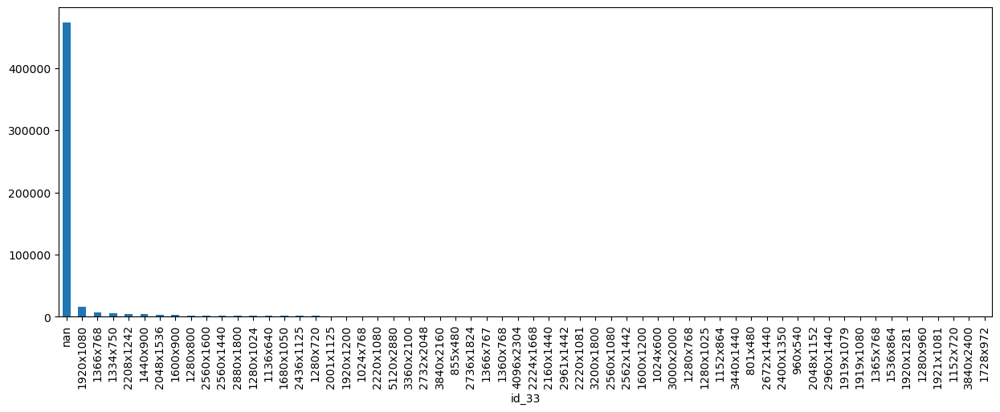

In [160]:
plt.figure(figsize = (15, 5))
train['id_33'].value_counts(dropna=False)[0:60].plot(kind='bar')

In [161]:
train['screen_width'] = train['id_33'].str.split('x', expand=True)[0]
train['screen_height'] = train['id_33'].str.split('x', expand=True)[1]
train['screen_width'].fillna(-1, inplace=True)
train['screen_height'].fillna(-1, inplace=True)
train.drop('id_33', axis=1, inplace=True)

<Axes: xlabel='screen_width'>

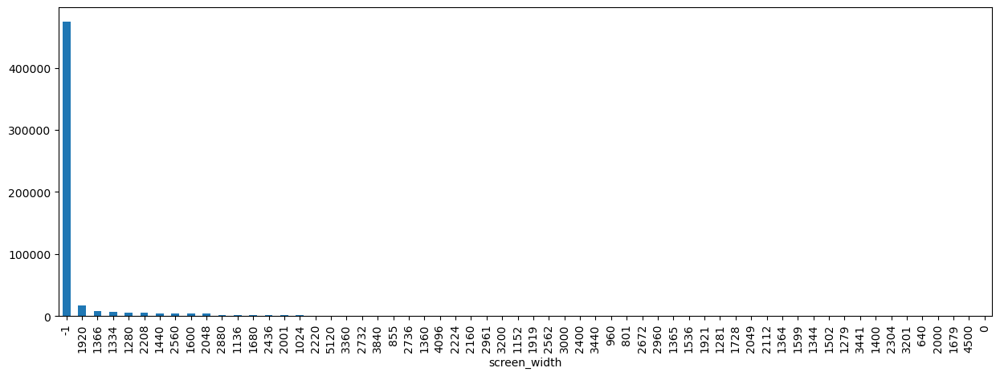

In [162]:
plt.figure(figsize = (15, 5))
train['screen_width'].value_counts(dropna=False)[0:60].plot(kind='bar')

<Axes: xlabel='screen_height'>

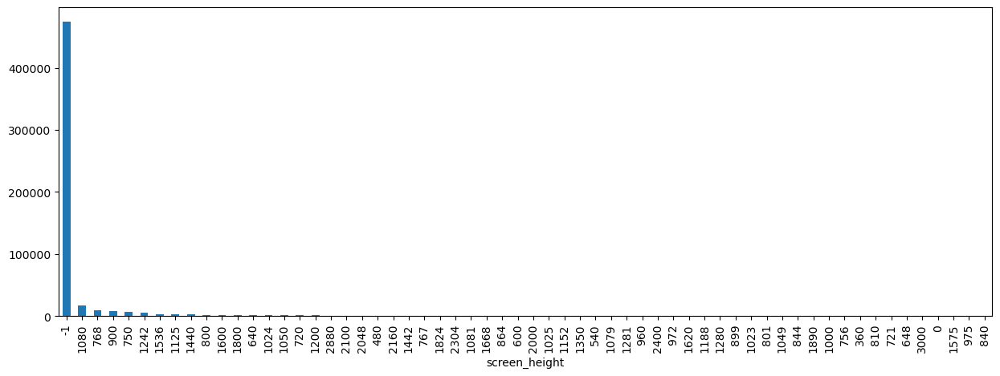

In [163]:
plt.figure(figsize = (15, 5))
train['screen_height'].value_counts(dropna=False)[0:60].plot(kind='bar')

#### Device Type


Loại thiết bị điện thoại hay máy tính

<Axes: xlabel='DeviceType'>

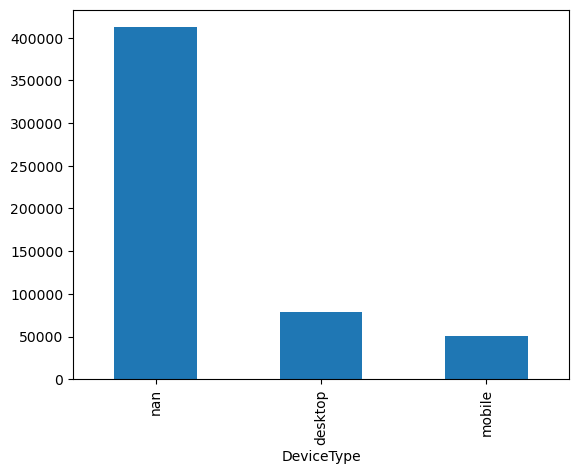

In [164]:
train['DeviceType'].value_counts(dropna=False).plot(kind='bar')

Tạo nhãn mới cho giá trị bị missing là MISSING

In [165]:
train['DeviceType'].fillna('MISSING', inplace=True)

<Axes: xlabel='DeviceType'>

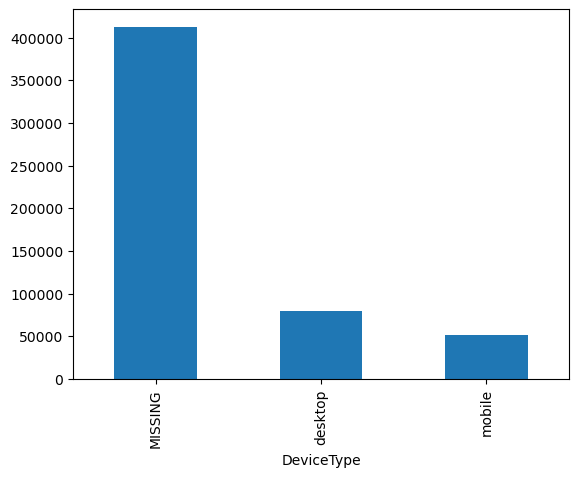

In [166]:
train['DeviceType'].value_counts(dropna=False).plot(kind='bar')

#### Device Info

Thông tin máy giao dịch

<Axes: xlabel='DeviceInfo'>

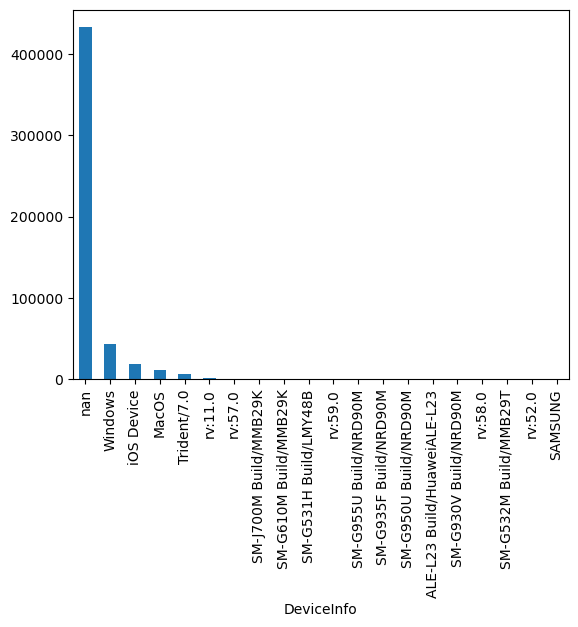

In [167]:
train['DeviceInfo'].value_counts(dropna=False)[0:20].plot(kind='bar')

Tạo thuộc tính Device Corp là công ty sản xuất thiết bị từ Device Info

In [168]:
def transform_DeviceInfo(df):
    df['DeviceCorp'] = df['DeviceInfo']
    df.loc[df['DeviceInfo'].str.contains('HUAWEI|HONOR', case=False, na=False, regex=True), 'DeviceCorp'] = 'HUAWEI'
    df.loc[df['DeviceInfo'].str.contains('OS', na=False, regex=False), 'DeviceCorp'] = 'APPLE'
    df.loc[df['DeviceInfo'].str.contains('Idea|TA', case=False, na=False), 'DeviceCorp'] = 'Lenovo'
    df.loc[df['DeviceInfo'].str.contains('Moto|XT|Edison', case=False, na=False), 'DeviceCorp'] = 'Moto'
    df.loc[df['DeviceInfo'].str.contains('MI|Mi|Redmi', na=False), 'DeviceCorp'] = 'Mi'
    df.loc[df['DeviceInfo'].str.contains('VS|LG|EGO', na=False), 'DeviceCorp'] = 'LG'
    df.loc[df['DeviceInfo'].str.contains('ONE TOUCH|ALCATEL', case=False, na=False, regex=False), 'DeviceCorp'] = 'ALCATEL'
    df.loc[df['DeviceInfo'].str.contains('ONE A', na=False, regex=False), 'DeviceCorp'] = 'ONEPLUS'
    df.loc[df['DeviceInfo'].str.contains('OPR6', na=False, regex=False), 'DeviceCorp'] = 'HTC'
    df.loc[df['DeviceInfo'].str.contains('Nexus|Pixel', case=False, na=False, regex=True), 'DeviceCorp'] = 'google'
    df.loc[df['DeviceInfo'].str.contains('STV', na=False, regex=False), 'DeviceCorp'] = 'blackberry'
    df.loc[df['DeviceInfo'].str.contains('ASUS', case=False, na=False, regex=False), 'DeviceCorp'] = 'ASUS'
    df.loc[df['DeviceInfo'].str.contains('BLADE', case=False, na=False, regex=False), 'DeviceCorp'] = 'ZTE'

    df['DeviceCorp'] = df['DeviceInfo'].astype('str').str.split(':', expand=True)[0].\
                                str.split('-', expand=True)[0].str.split(expand=True)[0]

    df.loc[df['DeviceInfo'].isin(['rv', 'SM', 'GT', 'SGH']), 'DeviceCorp'] = 'SAMSUNG'
    df.loc[df['DeviceInfo'].str.startswith('Z', na=False), 'DeviceCorp'] = 'ZTE'
    df.loc[df['DeviceInfo'].str.startswith('KF', na=False), 'DeviceCorp'] = 'Amazon'

    for i in ['D', 'E', 'F', 'G']:
        df.loc[df['DeviceInfo'].str.startswith(i, na=False), 'DeviceCorp'] = 'SONY'

    df.loc[df['DeviceCorp'].isin(df['DeviceCorp'].value_counts()\
                                 [df['DeviceCorp'].value_counts() < 100].index), 'DeviceCorp'] = 'Other'
    df['DeviceCorp'] = df['DeviceCorp'].str.upper()

    return df

<Axes: xlabel='DeviceCorp'>

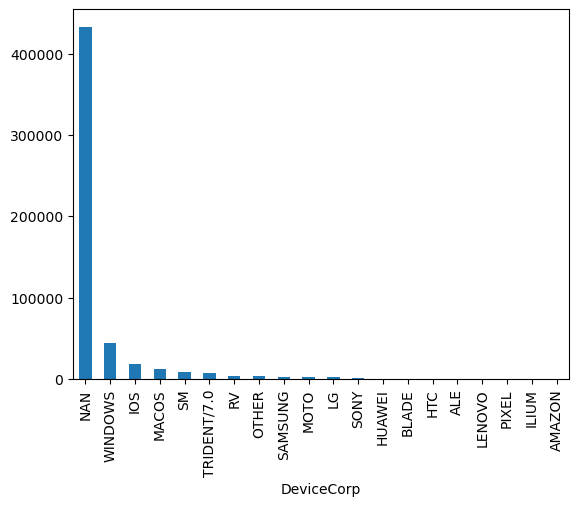

In [169]:
train = transform_DeviceInfo(train)

train['DeviceCorp'].value_counts(dropna=False)[0:20].plot(kind='bar')

Gộp các thuộc tính giống nhau của Device Info lại

In [170]:
train.loc[train['DeviceInfo'].str.contains('SM', na=False), 'DeviceInfo'] = 'Samsung'
train.loc[train['DeviceInfo'].str.contains('SAMSUNG', na=False), 'DeviceInfo'] = 'Samsung'
train.loc[train['DeviceInfo'].str.contains('GT-', na=False), 'DeviceInfo'] = 'Samsung'
train.loc[train['DeviceInfo'].str.contains('Moto G', na=False), 'DeviceInfo'] = 'Motorola'
train.loc[train['DeviceInfo'].str.contains('Moto', na=False), 'DeviceInfo'] = 'Motorola'
train.loc[train['DeviceInfo'].str.contains('moto', na=False), 'DeviceInfo'] = 'Motorola'
train.loc[train['DeviceInfo'].str.contains('LG-', na=False), 'DeviceInfo'] = 'LG'
train.loc[train['DeviceInfo'].str.contains('rv:', na=False), 'DeviceInfo'] = 'RV'
train.loc[train['DeviceInfo'].str.contains('HUAWEI', na=False), 'DeviceInfo'] = 'Huawei'
train.loc[train['DeviceInfo'].str.contains('ALE-', na=False), 'DeviceInfo'] = 'Huawei'
train.loc[train['DeviceInfo'].str.contains('-L', na=False), 'DeviceInfo'] = 'Huawei'
train.loc[train['DeviceInfo'].str.contains('Blade', na=False), 'DeviceInfo'] = 'ZTE'
train.loc[train['DeviceInfo'].str.contains('BLADE', na=False), 'DeviceInfo'] = 'ZTE'
train.loc[train['DeviceInfo'].str.contains('Linux', na=False), 'DeviceInfo'] = 'Linux'
train.loc[train['DeviceInfo'].str.contains('XT', na=False), 'DeviceInfo'] = 'Sony'
train.loc[train['DeviceInfo'].str.contains('HTC', na=False), 'DeviceInfo'] = 'HTC'
train.loc[train['DeviceInfo'].str.contains('ASUS', na=False), 'DeviceInfo'] = 'Asus'
train.loc[train.DeviceInfo.isin(train.DeviceInfo.value_counts()[train.DeviceInfo.value_counts() < 200].index), 'DeviceInfo'] = "Others"

<Axes: xlabel='DeviceInfo'>

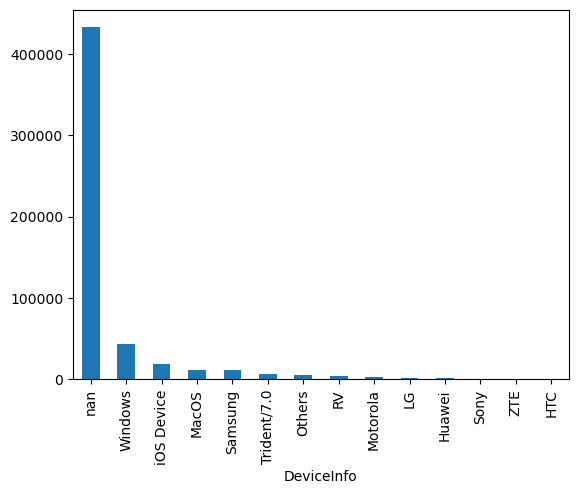

In [171]:
train['DeviceInfo'].value_counts(dropna=False)[0:20].plot(kind='bar')

#### Visualize lại các cột được biến đổi

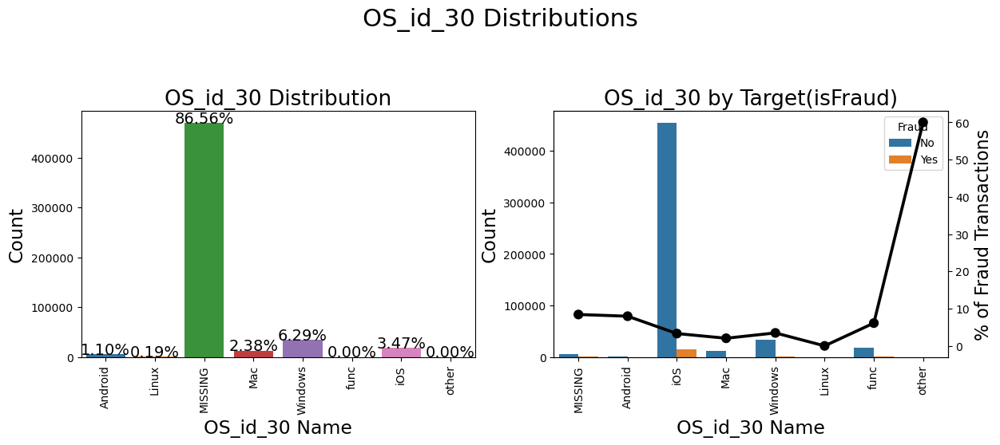

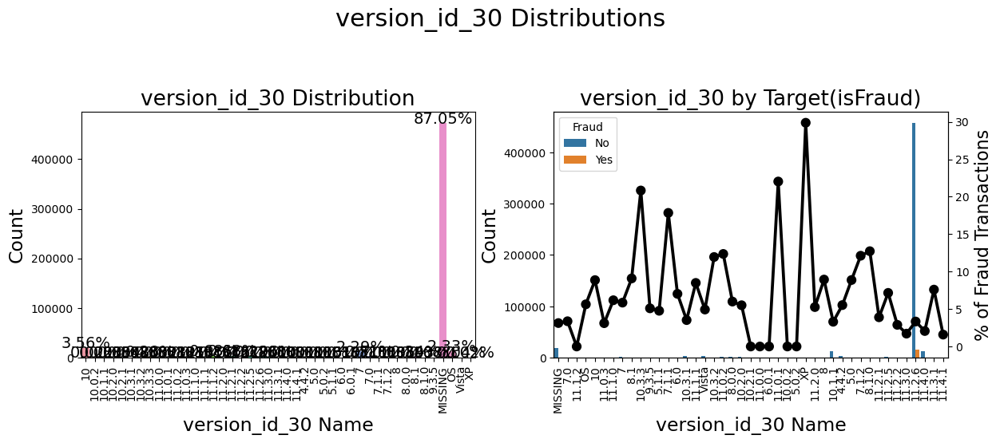

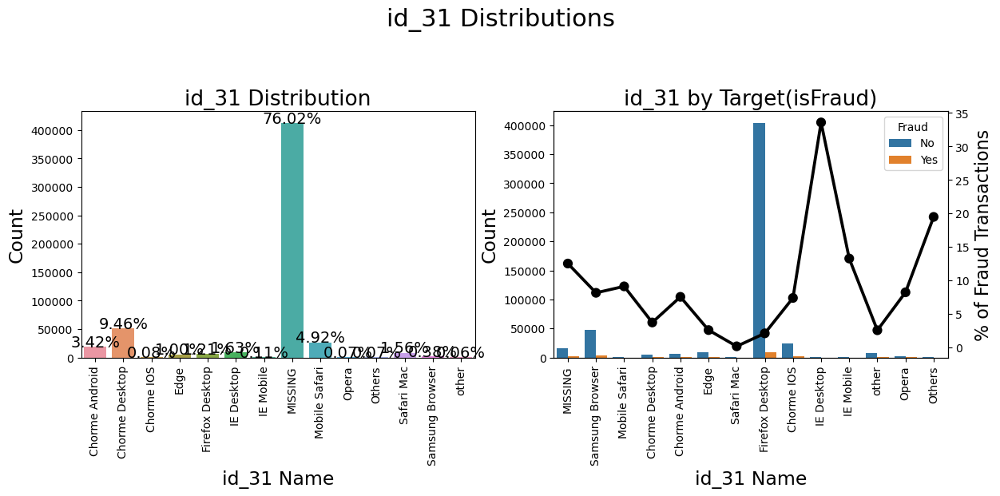

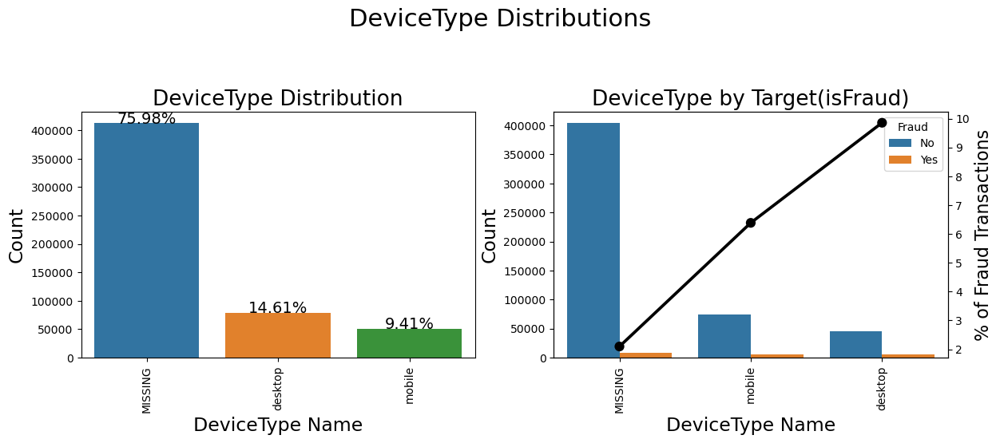

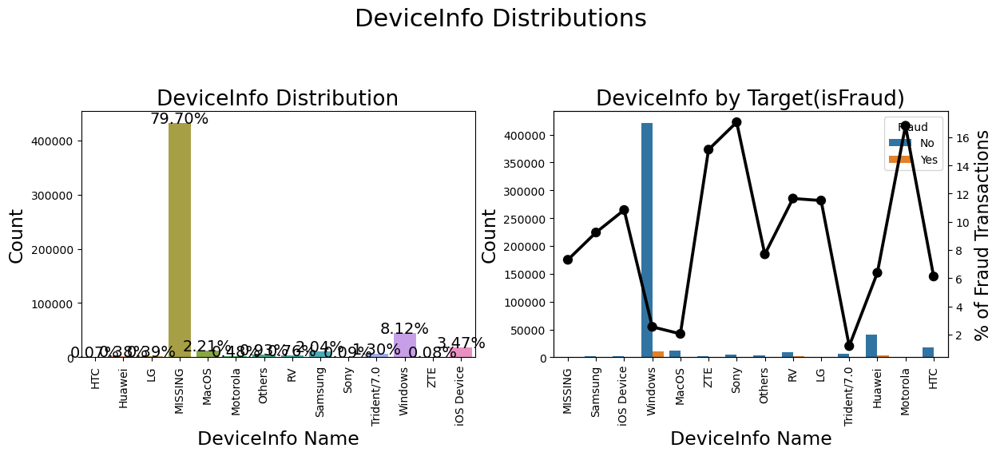

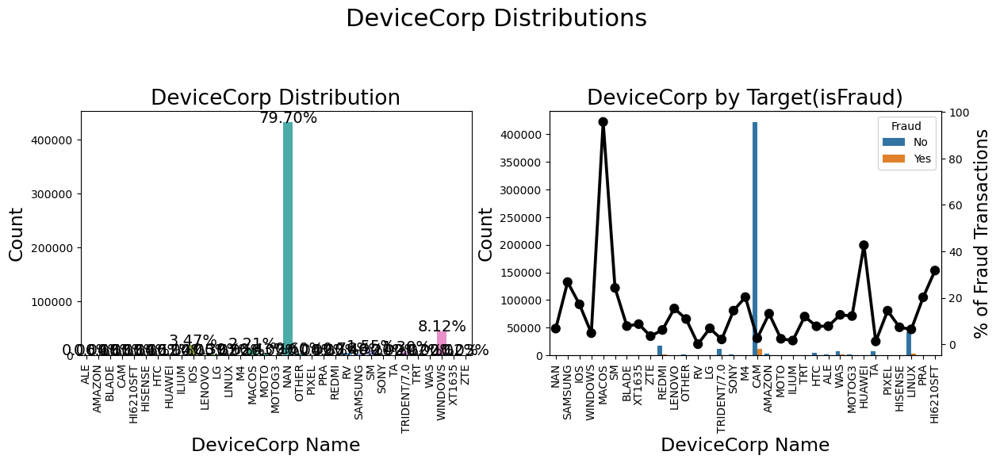

In [172]:
for col in ['OS_id_30','version_id_30', 'id_31', 'DeviceType', 'DeviceInfo', 'DeviceCorp']:
    train[col] = train[col].fillna('MISSING')
    cat_feat_ploting(train, col)

## V1 -> V339

In [173]:
train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,...,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_31,id_32,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,hour,OS_id_30,version_id_30,screen_width,screen_height,DeviceCorp
0,2987000,0,86400,68.5,W,13926,143.0,150.0,discover,240.0,credit,315.0,87.0,19.00,NoInf,NoInf,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-110.0,-9.0,-23.0,-38.0,-82.0,-110.0,-46.0,-110.0,80.0,MISSING,66.0,722.0,MISSING,MISSING,231.0,673.0,663.0,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,0,MISSING,MISSING,-1,-1,NAN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,1927.65,Google,NoInf,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,T,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-110.0,-9.0,-23.0,-38.0,-82.0,-110.0,-46.0,-110.0,80.0,MISSING,66.0,722.0,MISSING,MISSING,231.0,673.0,663.0,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,0,MISSING,MISSING,-1,-1,NAN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.00,Microsoft,NoInf,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-110.0,-9.0,-23.0,-38.0,-82.0,-110.0,-46.0,-110.0,80.0,MISSING,66.0,722.0,MISSING,MISSING,231.0,673.0,663.0,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,0,MISSING,MISSING,-1,-1,NAN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,156.03,Yahoo,NoInf,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,T,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-110.0,-9.0,-23.0,-38.0,-82.0,-110.0,-46.0,-110.0,80.0,MISSING,66.0,722.0,MISSING,MISSING,231.0,673.0,663.0,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,MISSING,0,MISSING,MISSING,-1,-1,NAN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,credit,420.0,87.0,1877.15,Google,NoInf,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,70787.0,-23.0,-38.0,-82.0,-110.0,-46.0,-110.0,100.0,NotFound,66.0,-480.0,New,NotFound,166.0,542.0,144.0,New,NotFound,Samsung Browser,32.0,match_status:2,T,F,T,T,mobile,Samsung,0,Android,7.0,2220,1080,SAMSUNG


In [174]:
v_columns = ['V' + str(i) for i in range(1,340)]

In [175]:
df_v_col = train[v_columns]
df_v_col.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,...,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,38.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,50.0,1758.0,925.0,0.0,354.0,0.0,135.0,0.0,0.0,0.0,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [176]:
detectmissing(df_v_col)

,Name,dtypes,Missing(%),Uniques
0,V1,float64,48.864315,2
1,V2,float64,48.864315,9
2,V3,float64,48.864315,10
3,V4,float64,48.864315,7
4,V5,float64,48.864315,7
5,V6,float64,48.864315,9
6,V7,float64,48.864315,10
7,V8,float64,48.864315,9
8,V9,float64,48.864315,9
9,V10,float64,48.864315,5


Qua khảo sát đầu tiên, ta có thể thấy là một vài các cột V có số lượng giá trị bị thiếu (missing values) giống nhau. Điều này dẫn đến dự đoán của bọn mình là có rất nhiều cột V giống nhau hoặc là có sự tương quan đáng kể với nhau. Ta sẽ nhóm các cột có cùng số lượng giá trị missing với nhau, tính hệ số tương quan giữa các cột trong nhóm đó và chọn một cột làm đại diện đặc trưng.

In [177]:
# group columns by the number of missing values
nans_df = df_v_col.isnull()
nans_df.head()
nans_groups={}

for col in df_v_col.columns:
    cur_group = nans_df[col].sum()
    try:
        nans_groups[cur_group].append(col)
    except:
        nans_groups[cur_group]=[col]

del nans_df

for k,v in nans_groups.items():
    print('####### NAN count =',k)
    print(v)

####### NAN count = 265128
['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']
####### NAN count = 71644
['V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34']
####### NAN count = 157679
['V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52']
####### NAN count = 73354
['V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74']
####### NAN count = 84720
['V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94']
####### NAN count = 314
['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V

In [178]:
final_v_columns = np.array(['V261', 'V223', 'V277', 'V274', 'V267', 'V266', 'V260', 'V218',
       'V226', 'V224', 'V229', 'V252', 'V228', 'V253', 'V257', 'V258',
       'V240', 'V235', 'V264', 'V178', 'V173', 'V182', 'V187', 'V203',
       'V205', 'V215', 'V207', 'V176', 'V171', 'V209', 'V175', 'V180',
       'V185', 'V188', 'V169', 'V198', 'V210', 'V271', 'V250', 'V238',
       'V234', 'V221', 'V220', 'V3', 'V1', 'V11', 'V8', 'V6', 'V4', 'V47',
       'V44', 'V41', 'V40', 'V36', 'V37', 'V48', 'V89', 'V91', 'V76',
       'V78', 'V80', 'V82', 'V86', 'V88', 'V59', 'V65', 'V54', 'V56',
       'V67', 'V70', 'V68', 'V62', 'V27', 'V14', 'V17', 'V20', 'V23',
       'V26', 'V13', 'V30', 'V314', 'V301', 'V296', 'V289', 'V283',
       'V281', 'V120', 'V111', 'V115', 'V117', 'V136', 'V107', 'V121',
       'V104', 'V99', 'V98', 'V123', 'V96', 'V108', 'V130', 'V129',
       'V127', 'V124', 'V320', 'V310', 'V294', 'V309', 'V307', 'V305',
       'V303', 'V297', 'V286', 'V285', 'V284', 'V291'], dtype=object)


len(final_v_columns)

115

In [179]:
dropped_v_cols = np.array(['V2',
 'V5',
 'V7',
 'V9',
 'V10',
 'V12',
 'V15',
 'V16',
 'V18',
 'V19',
 'V21',
 'V22',
 'V24',
 'V25',
 'V28',
 'V29',
 'V31',
 'V32',
 'V33',
 'V34',
 'V35',
 'V38',
 'V39',
 'V42',
 'V43',
 'V45',
 'V46',
 'V49',
 'V50',
 'V51',
 'V52',
 'V53',
 'V55',
 'V57',
 'V58',
 'V60',
 'V61',
 'V63',
 'V64',
 'V66',
 'V69',
 'V71',
 'V72',
 'V73',
 'V74',
 'V75',
 'V77',
 'V79',
 'V81',
 'V83',
 'V84',
 'V85',
 'V87',
 'V90',
 'V92',
 'V93',
 'V94',
 'V95',
 'V97',
 'V100',
 'V101',
 'V102',
 'V103',
 'V105',
 'V106',
 'V109',
 'V110',
 'V112',
 'V113',
 'V114',
 'V116',
 'V118',
 'V119',
 'V122',
 'V125',
 'V126',
 'V128',
 'V131',
 'V132',
 'V133',
 'V134',
 'V135',
 'V137',
 'V138',
 'V139',
 'V140',
 'V141',
 'V142',
 'V143',
 'V144',
 'V145',
 'V146',
 'V147',
 'V148',
 'V149',
 'V150',
 'V151',
 'V152',
 'V153',
 'V154',
 'V155',
 'V156',
 'V157',
 'V158',
 'V159',
 'V160',
 'V161',
 'V162',
 'V163',
 'V164',
 'V165',
 'V166',
 'V167',
 'V168',
 'V170',
 'V172',
 'V174',
 'V177',
 'V179',
 'V181',
 'V183',
 'V184',
 'V186',
 'V189',
 'V190',
 'V191',
 'V192',
 'V193',
 'V194',
 'V195',
 'V196',
 'V197',
 'V199',
 'V200',
 'V201',
 'V202',
 'V204',
 'V206',
 'V208',
 'V211',
 'V212',
 'V213',
 'V214',
 'V216',
 'V217',
 'V219',
 'V222',
 'V225',
 'V227',
 'V230',
 'V231',
 'V232',
 'V233',
 'V236',
 'V237',
 'V239',
 'V241',
 'V242',
 'V243',
 'V244',
 'V245',
 'V246',
 'V247',
 'V248',
 'V249',
 'V251',
 'V254',
 'V255',
 'V256',
 'V259',
 'V262',
 'V263',
 'V265',
 'V268',
 'V269',
 'V270',
 'V272',
 'V273',
 'V275',
 'V276',
 'V278',
 'V279',
 'V280',
 'V282',
 'V287',
 'V288',
 'V290',
 'V292',
 'V293',
 'V295',
 'V298',
 'V299',
 'V300',
 'V302',
 'V304',
 'V306',
 'V308',
 'V311',
 'V312',
 'V313',
 'V315',
 'V316',
 'V317',
 'V318',
 'V319',
 'V321',
 'V322',
 'V323',
 'V324',
 'V325',
 'V326',
 'V327',
 'V328',
 'V329',
 'V330',
 'V331',
 'V332',
 'V333',
 'V334',
 'V335',
 'V336',
 'V337',
 'V338',
 'V339'])

len(dropped_v_cols)

224

In [180]:
train = train.drop(dropped_v_cols, axis=1)
train.shape

(542580, 203)

In [181]:
for col in final_v_columns:
  train[col] = train[col].fillna(train[col].min() - 2)

In [182]:
del df_v_col

## TransactionDT

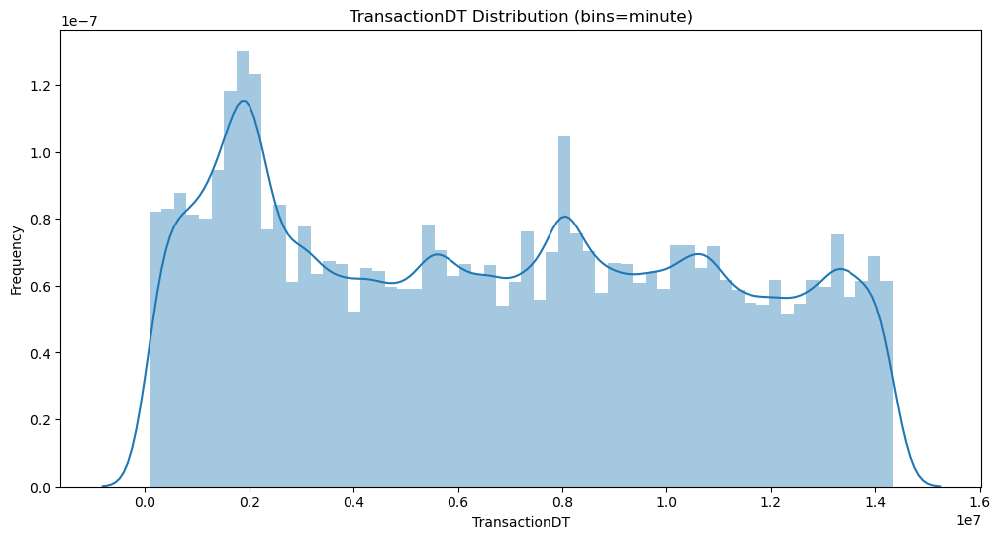

In [193]:
plt.figure(figsize=(12,6))
sns.distplot(train.TransactionDT,kde=True,bins=60)
plt.title("TransactionDT Distribution (bins=minute)")
plt.ylabel("Frequency")
plt.show()

Tạo 1 cột là ngày giao dịch (1 trong 7 ngày trong tuần) và kiểm tra tỷ lệ giao dịch lỗi ở trong mỗi ngày

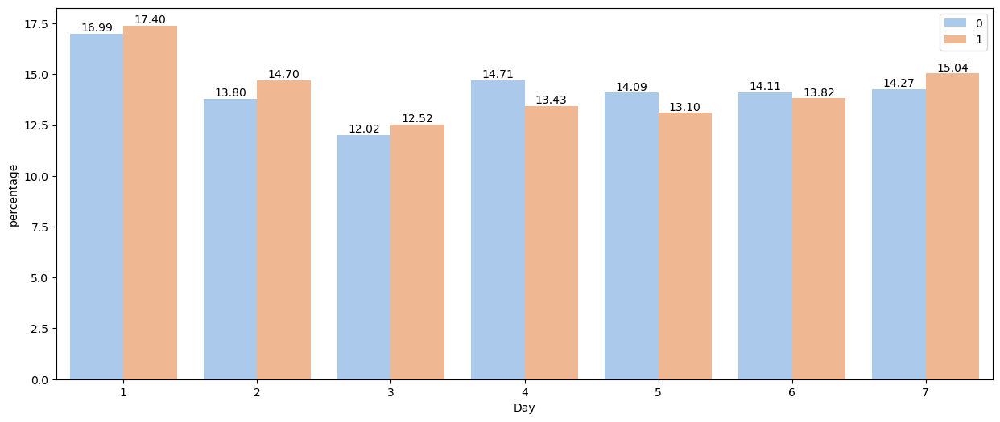

In [184]:
train['Day'] =((train['TransactionDT']//(3600*24)-1)%7)+1
train_day = train.groupby(['isFraud'])['Day'].value_counts(normalize = True).rename('percentage').mul(100).reset_index().sort_values('Day')
plt.figure(figsize=(15,6))

barplot = sns.barplot(x='Day',y='percentage',data=train_day,hue = "isFraud",palette='pastel')
plt.legend()
for p in barplot.patches:
    barplot.annotate(format(p.get_height(),'.2f'),(p.get_x() + p.get_width() / 2 , p.get_height()),ha = 'center',va='center'
                    ,xytext = (0,5), textcoords = 'offset points')

Nhận xét : Không có nhiều đặc biệt về số lượng giao dịch bất thường theo ngày
</br>
Tạo 1 cột mới là giờ trong ngày để kiểm tra tỷ lệ bất thường tương ứng

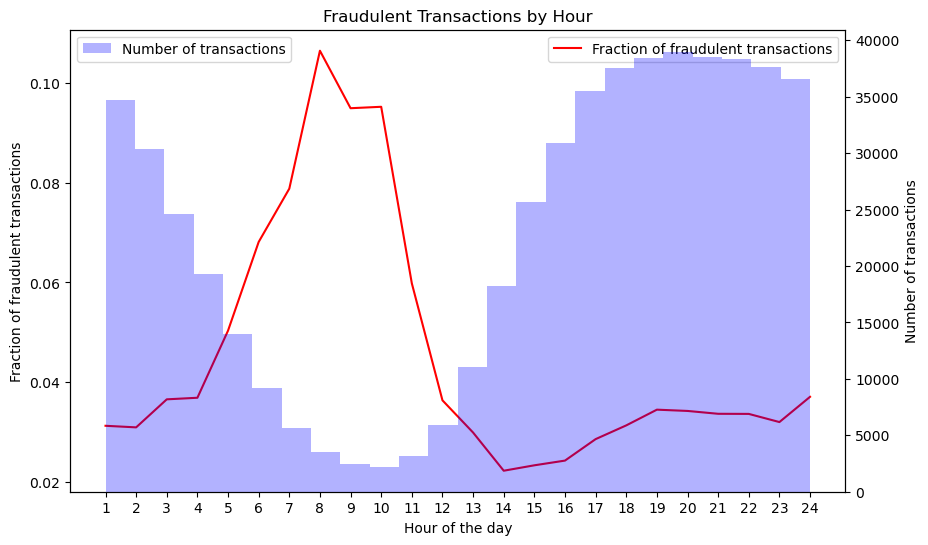

In [185]:
train['hour'] = ((train['TransactionDT']//3600)%24)+1

fraud_by_hour = train.groupby('hour')['isFraud'].mean()
plt.figure(figsize=(10, 6))
plt.plot(fraud_by_hour.index, fraud_by_hour.values, color='r', label='Fraction of fraudulent transactions')
plt.xlabel('Hour of the day')
plt.ylabel('Fraction of fraudulent transactions')
plt.title('Fraudulent Transactions by Hour')
plt.xticks(np.arange(1, 25, 1))
plt.legend()

ax2 = plt.gca().twinx()
ax2.hist(train['hour'], alpha=0.3, bins=24, color='blue', label='Number of transactions')
ax2.set_ylabel('Number of transactions')
plt.legend()

plt.show()







$\textbf{Mức Cao (6 AM - 9 AM):}$ Xác suất giao dịch gian lận khá cao vào các giờ sáng sớm, từ 6 AM đến 9 AM.

$\textbf{Mức Trung Bình (3 AM - 5 AM, 10 AM - 11 AM):}$ Xác suất giao dịch gian lận vừa phải được quan sát vào các giờ sáng sớm (3 AM - 5 AM) và giờ sáng muộn (10 AM - 11 AM).

$\textbf{Mức Thấp (11 AM - 12 PM, 4 PM - Nửa đêm, 1 AM - 2 AM):}$ Khả năng giao dịch gian lận thấp hơn vào các giờ sáng muộn, buổi chiều và giờ khuya, bao gồm khoảng thời gian từ 11 AM đến 12 PM, từ 4 PM đến nửa đêm và từ 1 AM đến 2 AM.

$\textbf{Rất Thấp (1 PM - 3 PM):}$ Xác suất giao dịch gian lận rất thấp vào các giờ chiều sớm, cụ thể từ 1 PM đến 3 PM. </br></br></br>
Hơn nữa, đáng chú ý rằng các khoảng thời gian có xác suất cao nhất về giao dịch gian lận thường trùng khớp với số lượng giao dịch tổng cộng thấp hơn đáng kể. Những khung thời gian này thường tương ứng với những khoảnh khắc trong ngày có ít giao dịch được ghi nhận.

* Nhận xét : Từ 7 đến 10h số lượng giao dịch ít ,tỷ lệ bất thường cao => tạo 1 cột mới để biểu diễn observation trên

In [186]:
def new_warning_feature(hr):
    if hr >= 7 and hr < 10:
        return  "highwarningsign"
    if hr >=14 and hr < 16:
        return "lowestwarningsign"
    if (hr >= 4 and hr < 7) or (hr >= 10 and hr < 14):
        return "mediumwarningsign"
    else:
        return "lowwarningsign"

train['hour_warning'] = train['hour'].apply(new_warning_feature)


## M1-> M9

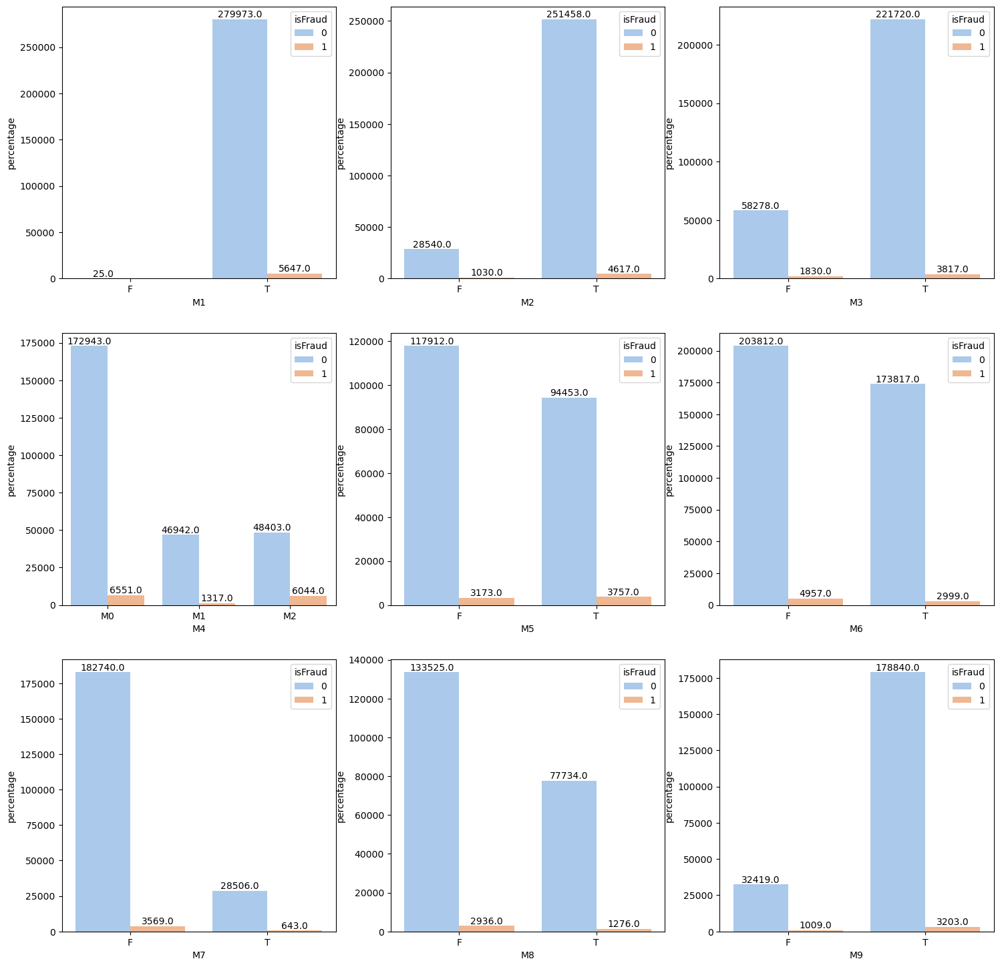

In [187]:
plt.figure(figsize = (18,18))
var = ['train_m' + str(i) for i in range(1,10)]
col = ['M' + str(i) for i in range(1,10)]
for i,j,k in zip(var,col,range(1,10)):
    i = train.groupby(['isFraud'])[j].value_counts().rename('percentage').reset_index().sort_values(j)
    plt.subplot(3,3,k)
    ax = sns.barplot(x=j, y="percentage", hue="isFraud", data=i, palette = 'pastel')
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}',
                    (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')
plt.show()

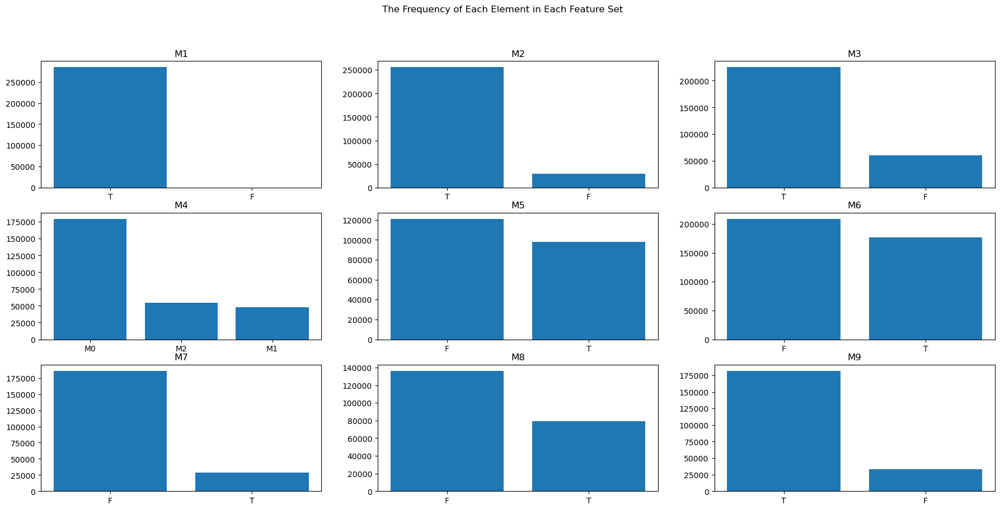

In [188]:
i = 1
plt.figure(figsize = (22,10))
plt.suptitle("The Frequency of Each Element in Each Feature Set")
for column in col:
    d = train[column].value_counts().reset_index()
    plt.subplot(3,3,i)
    plt.bar(d[column], d['count'])
    plt.title(column)
    i+=1

## D1->D15

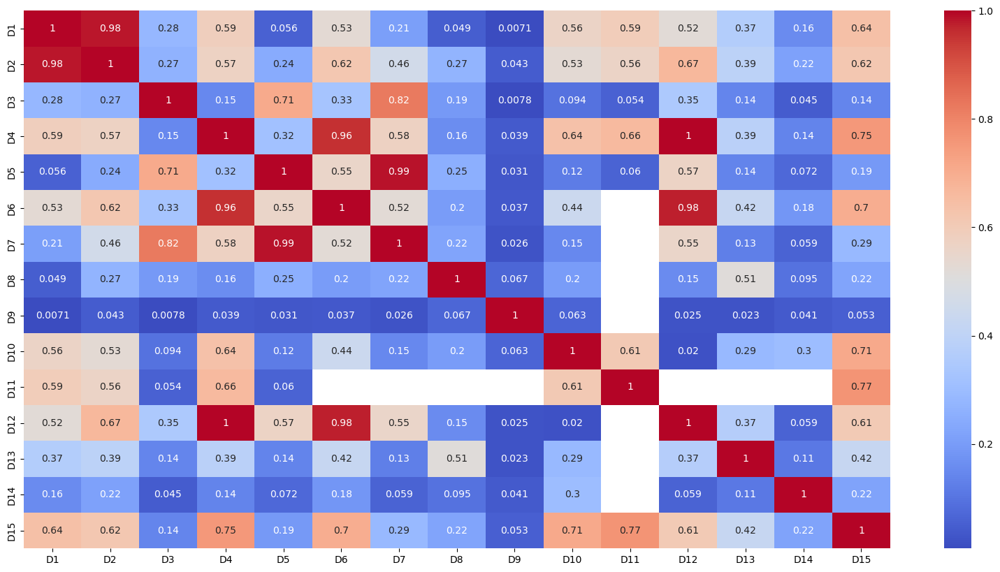

In [189]:
plt.figure(figsize = (20,10))
sns.heatmap(train[['D'+str(i) for i in range(1,16)]].corr(),annot = True , cmap = "coolwarm")
plt.show()

- Nhìn vào heatmap , ta loại bỏ 2 feature có hệ số correlation lớn (giữ lại feauture có tỷ lệ missing value nhỏ) <br>
- Điền giá trị cột M bằng phần tử xuất hiện nhiều nhất (Cột này không thể tạo ra giá trị mới để biểu diễn cho giá trị Null vì ý nghĩa ban đầu của cột)
- Ở cột D là khoảng thời gian giữa 2 giao dịch => Điền giá trị null bằng trung bình của cột

In [190]:
M_column = ['M' + str(i) for i in range(1,10)]
D_column = ['D' + str(i) for i in range(1,16) if i!=2 and i!=6 and i!=7 and i!=12]
train[M_column] = train[M_column].fillna(train[M_column].mode().iloc[0])
train[D_column] = train[D_column].fillna(train[D_column].mean())

train.drop(['Day','hour'],axis = 1,inplace = True)
train.drop(['D2','D6','D7','D12'],axis = 1,inplace=True)

In [191]:
train.shape
train.isnull().sum()

TransactionID     0
isFraud           0
TransactionDT     0
TransactionAmt    0
ProductCD         0
card1             0
card2             0
card3             0
card4             0
card5             0
card6             0
addr1             0
addr2             0
dist1             0
P_emaildomain     0
R_emaildomain     0
C1                0
C2                0
C3                0
C4                0
C5                0
C6                0
C7                0
C8                0
C9                0
C10               0
C11               0
C12               0
C13               0
C14               0
D1                0
D3                0
D4                0
D5                0
D8                0
D9                0
D10               0
D11               0
D13               0
D14               0
D15               0
M1                0
M2                0
M3                0
M4                0
M5                0
M6                0
M7                0
M8                0
M9                0


In [192]:
csv_file_path = "train_eda.csv"

# Write data to CSV
train.to_csv(csv_file_path, index=False)